In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount("/content/drive/")

Mounted at /content/drive/


In [2]:
from scipy.spatial import  distance_matrix

In [3]:
import torch
!pip install torch-scatter -f https://data.pyg.org/whl/torch-{torch.__version__}.html
!pip install torch-sparse -f https://data.pyg.org/whl/torch-{torch.__version__}.html
!pip install torch-cluster -f https://data.pyg.org/whl/torch-{torch.__version__}.html
!pip install torch-geometric


from torch_geometric.nn import Node2Vec
from torch_geometric.utils import from_networkx

Looking in links: https://data.pyg.org/whl/torch-2.3.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 18.6 MB/s eta 0:00:00
Looking in links: https://data.pyg.org/whl/torch-2.3.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 35.5 MB/s eta 0:00:00
Looking in links: https://data.pyg.org/whl/torch-2.3.0+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 34.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 7.3 MB/s eta 0:00:00


In [4]:
import sys
import altair as alt
import matplotlib as mlp
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

In [5]:
!pip install opentsne

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 10.9 MB/s eta 0:00:00


In [6]:
import openTSNE

### Preparar datos

In [27]:
origen = pd.read_csv("/content/drive/MyDrive/Proyecto - Grafos/Datos/origen.csv", index_col = 0)
continent_paint = {"America": "blue",
                   "Africa": "green",
                   "Europa": "red",
                   "Oceania": "yellow",
                   "Asia": "cyan"}

In [7]:
df = pd.read_csv("/content/drive/MyDrive/Proyecto - Grafos/GT_SNP_AS_COL", index_col = 0) # datos

In [8]:
df

,rs11588312,rs2843143,rs7545940,rs4648482,rs12409345,rs2493291,rs10915433,rs6681347,rs10915494,rs17407901,...,rs7290877,rs8138195,rs5770403,rs4823934,rs714006,rs5770482,rs6009839,rs12171156,rs909693,rs8185000
1_C1_1_C1,1.0,2.0,1.0,0.0,2.0,0.0,1.0,1.0,1.0,0.0,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0
2_C2_2_C2,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3_C3_3_C3,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,1.0
4_C4_4_C4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5_C5_5_C5,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,1.0,1.0,...,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2358_NAD64_2358_NAD64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2359_NAD93_2359_NAD93,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2360_NAD96_2360_NAD96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0


In [9]:
# 1. Imputamos datos vacíos con la media de cada columna
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(df)

# 2. Estandarizamos los datos
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_imputed)

# Mapas de colores

In [192]:
africa_data = origen[origen["Continente"] == "Africa"]
africa_labels = africa_data["label"].unique()
africa_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(africa_labels)))
dict_af = {africa_labels[i]: africa_rainbow[i] for i in range(len(africa_labels))}
colors_africa = africa_data["label"].apply(lambda x: dict_af[x])

In [193]:
indices_africa = origen[origen['label'].isin(africa_labels)].index

In [194]:
oceania_data = origen[origen["Continente"] == "Oceania"]
oceania_labels = oceania_data["label"].unique()
oceania_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(oceania_labels)))
dict_o = {oceania_labels[i]: oceania_rainbow[i] for i in range(len(oceania_labels))}
colors_oceania = oceania_data["label"].apply(lambda x: dict_o[x])

In [195]:
indices_oceania = origen[origen['label'].isin(oceania_labels)].index

In [196]:
asia_data = origen[origen["Continente"] == "Asia"]
asia_labels = asia_data["label"].unique()
asia_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(asia_labels)))
dict_as = {asia_labels[i]: asia_rainbow[i] for i in range(len(asia_labels))}
colors_asia = asia_data["label"].apply(lambda x: dict_as[x])

In [197]:
indices_asia = origen[origen['label'].isin(asia_labels)].index

In [198]:
europa_data = origen[origen["Continente"] == "Europa"]
europa_labels = europa_data["label"].unique()
europa_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(europa_labels)))
dict_eu = {europa_labels[i]: europa_rainbow[i] for i in range(len(europa_labels))}
colors_europa = europa_data["label"].apply(lambda x: dict_eu[x])

In [199]:
indices_europa = origen[origen['label'].isin(europa_labels)].index

In [200]:
america_data = origen[origen["Continente"] == "America"]
america_labels = america_data["label"].unique()
america_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(america_labels)))
dict_am = {america_labels[i]: america_rainbow[i] for i in range(len(america_labels))}
colors_america = america_data["label"].apply(lambda x: dict_am[x])

In [201]:
# Definir las nuevas agrupaciones para América
america_norte = [
    'Cree', 'Chipewyan', 'Ojibwa', 'Algonquin', 'Yaqui', 'MEX',
    'Zapotec1', 'Mixe', 'Zapotec2', 'Purepecha', 'Tepehuano',
    'Maya1', 'Maya2'
]
america_central = [
    'Cabecar', 'Kaqchikel', 'Mixtec', 'Wayuu', 'Bribri', 'Ticuna',
    'Maleku', 'Huetar', 'Teribe', 'Waunana', 'Chorotega', 'Arhuaco',
    'Embera', 'Kogi', 'Guaymi'
]
america_sur = [
    'CHARRUA', 'Piapoco', 'Karitiana', 'Surui', 'Pima', 'Chono',
    'Quechua', 'Chilote', 'Aymara', 'Diaguita', 'Hulliche', 'Inga',
    'Jamamadi', 'Parakana', 'Guarani', 'Kaingang', 'Yaghan',
    'Palikur', 'Toba', 'Arara', 'Wichi', 'Chane', 'Guahibo'
]
region_artica = [
    'EastGreenland', 'WestGreenland', 'Aleutian'
]

# Crear un diccionario para asignar regiones
region_dict = {}
for group, region in zip(
    [america_norte, america_central, america_sur, region_artica],
    ['America del Norte', 'America Central', 'America del Sur', 'Region Artica']
):
    for origin in group:
        region_dict[origin] = region

# Filtrar solo las poblaciones de América
poblaciones_america = america_norte + america_central + america_sur + region_artica

indices_america = origen[origen['label'].isin(poblaciones_america)].index

origen['Region'] = origen['label'].map(region_dict)

# Filtrar las regiones para los puntos de América
regions_america = origen.loc[indices_america, 'Region']

# Asignar colores a las regiones
region_paint = {
    'America del Norte': 'tab:red',
    'America Central': 'tab:olive',
    'America del Sur': 'tab:purple',
    'Region Artica': 'tab:blue'
}

colors_america_regiones = regions_america.apply(lambda x: region_paint.get(x, 'white'))

<ipython-input-201-1c09176699c1>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  origen['Region'] = origen['label'].map(region_dict)


# PCA

In [ ]:
# Aplicamos PCA
pca = PCA(n_components=3)
S_pca = pca.fit_transform(data_scaled)

In [ ]:
colors = origen['Continente'].apply(lambda x: continent_paint[x])

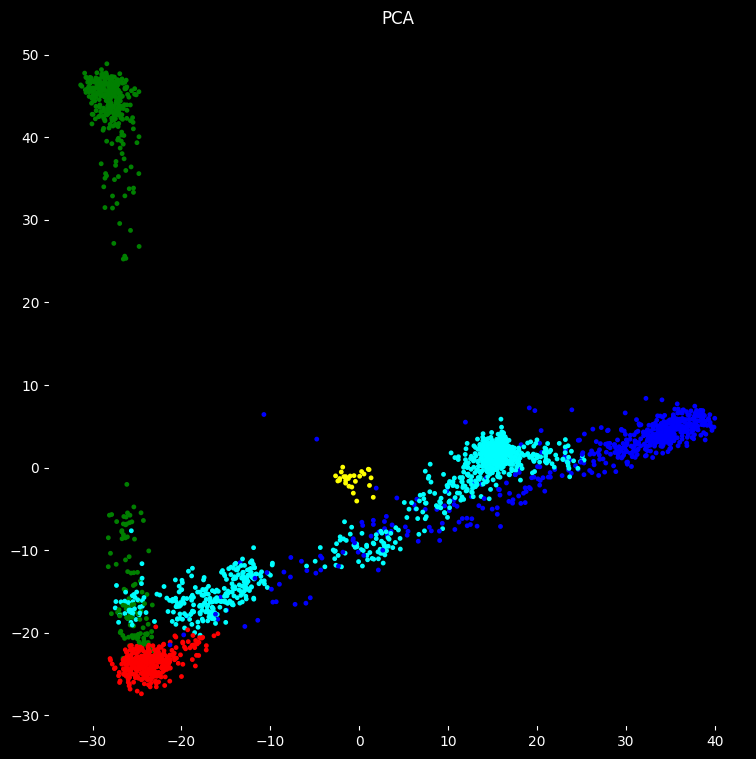

In [ ]:
# Plotear PCA (1era y 2da componente principal)
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(S_pca[:, 0], S_pca[:, 1], c=colors, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA", color='white')
plt.show()

Separación América y Asia en la tercera componente principal

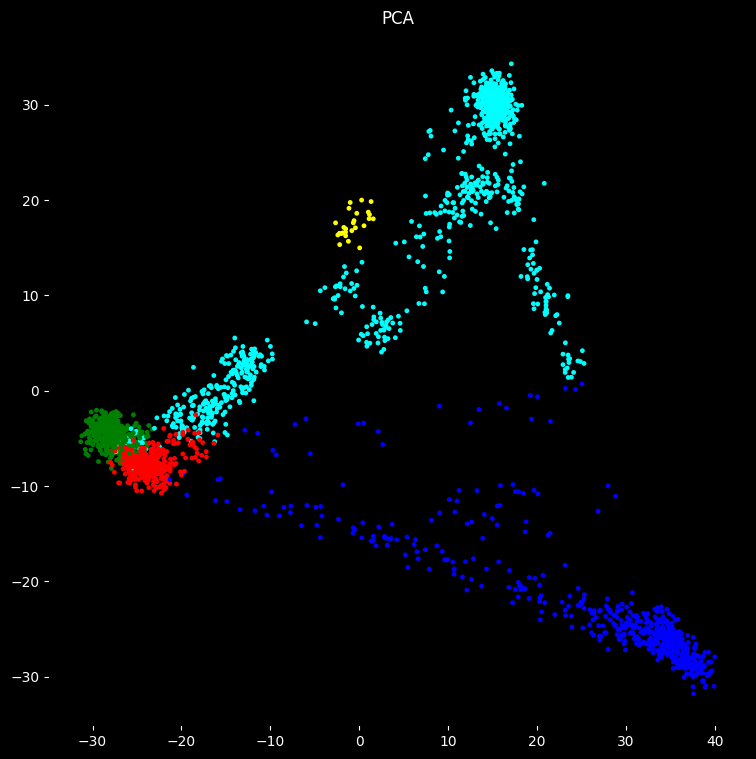

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(S_pca[:, 0], S_pca[:, 2], c=colors, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA", color='white')
plt.show()

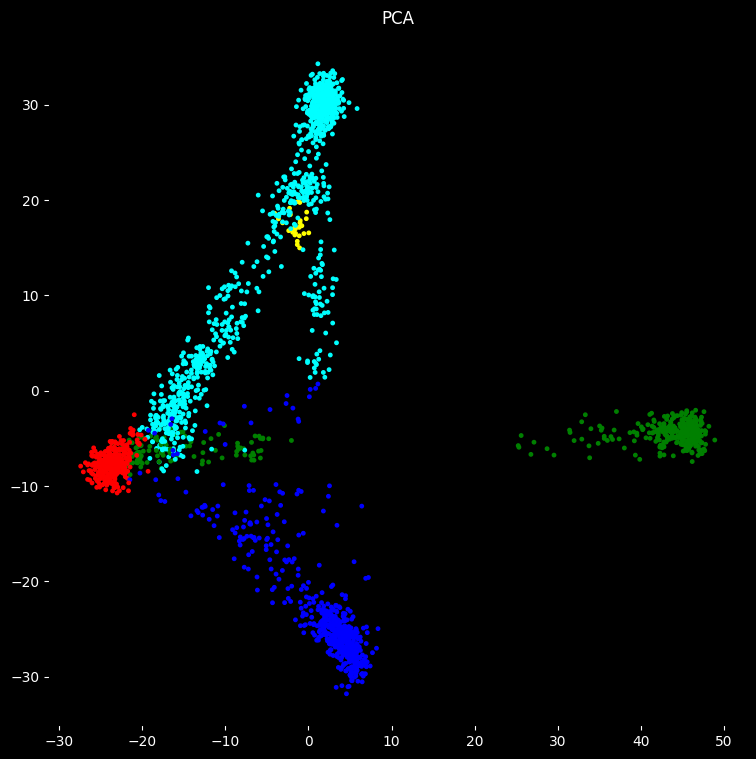

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(S_pca[:, 1], S_pca[:, 2], c=colors, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA", color='white')
plt.show()

Estructura local


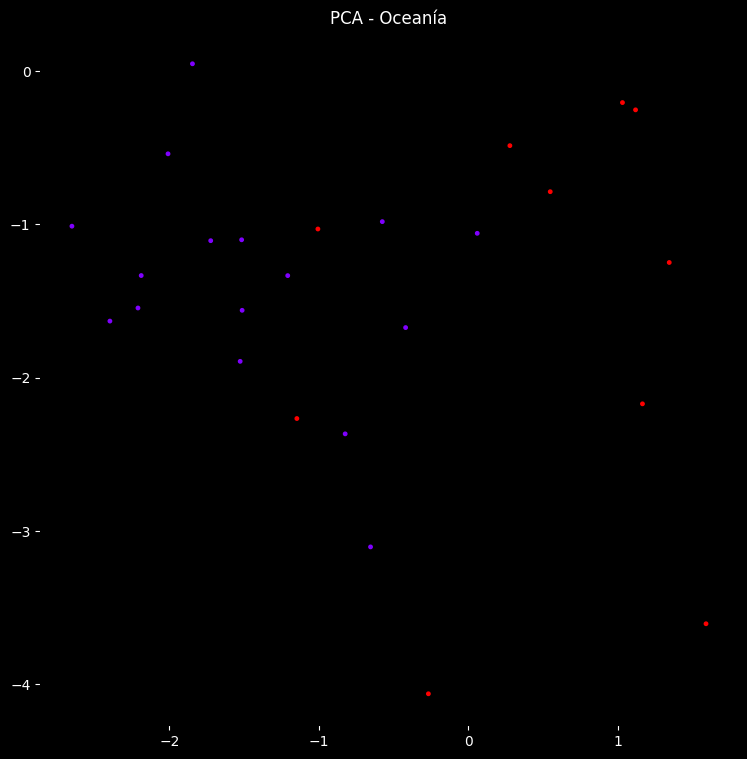

In [ ]:
oceania_data = origen[origen["Continente"] == "Oceania"]
oceania_pca = S_pca[origen["Continente"] == "Oceania"]

oceania_labels = oceania_data["label"].unique()
oceania_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(oceania_labels)))
dict_o = {oceania_labels[i]: oceania_rainbow[i] for i in range(len(oceania_labels))}

# Asignar colores a cada punto de Oceania
colors_oceania = oceania_data["label"].apply(lambda x: dict_o[x])

# Plotear PCA para Oceania
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(oceania_pca[:, 0], oceania_pca[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA - Oceanía", color='white')
plt.show()

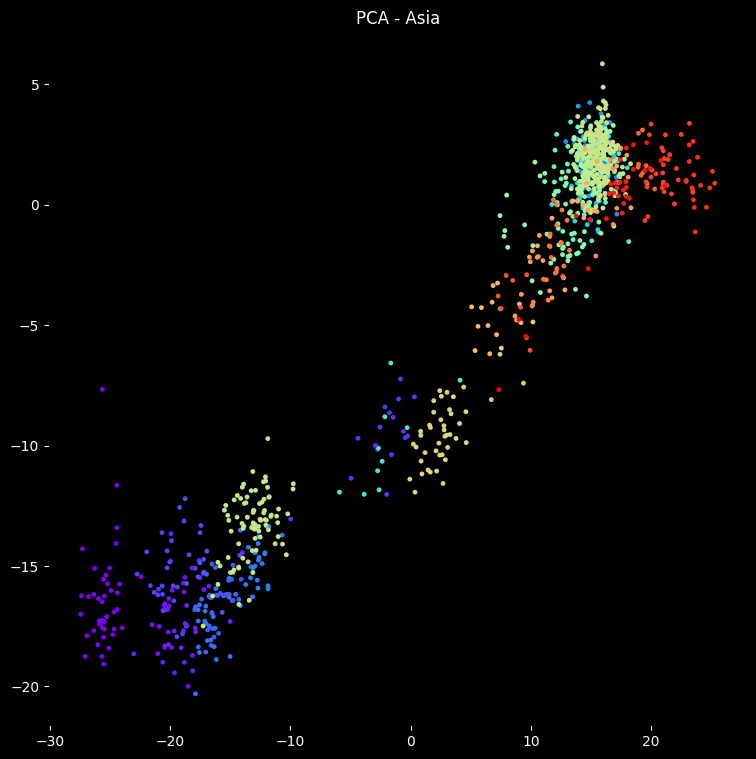

In [ ]:
asia_data = origen[origen["Continente"] == "Asia"]
asia_pca = S_pca[origen["Continente"] == "Asia"]

asian_labels = asia_data["label"].unique()
asian_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(asian_labels)))
dict_as = {asian_labels[i]: asian_rainbow[i] for i in range(len(asian_labels))}

# Asignar colores a cada punto de Asia
colors_asia = asia_data["label"].apply(lambda x: dict_as[x])

# Plotear PCA para Asia
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(asia_pca[:, 0], asia_pca[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA - Asia", color='white')
plt.show()

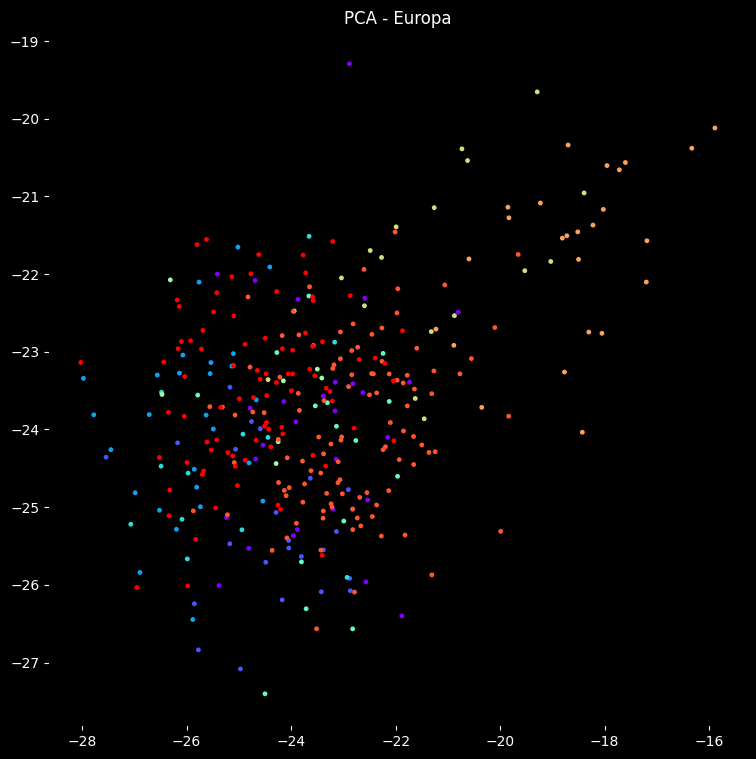

In [ ]:
europa_data = origen[origen["Continente"] == "Europa"]
europa_pca = S_pca[origen["Continente"] == "Europa"]

europa_labels = europa_data["label"].unique()
europa_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(europa_labels)))
dict_eu = {europa_labels[i]: europa_rainbow[i] for i in range(len(europa_labels))}

# Asignar colores a cada punto de Europa
colors_europa = europa_data["label"].apply(lambda x: dict_eu[x])

# Plotear PCA para Europa
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(europa_pca[:, 0], europa_pca[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA - Europa", color='white')
plt.show()

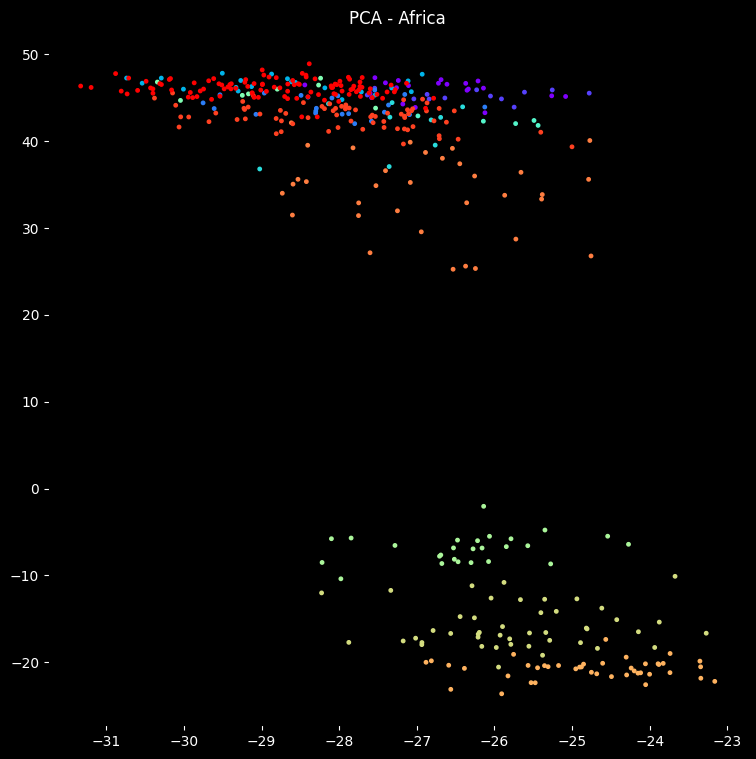

In [ ]:
africa_data = origen[origen["Continente"] == "Africa"]
africa_pca = S_pca[origen["Continente"] == "Africa"]

africa_labels = africa_data["label"].unique()
africa_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(africa_labels)))
dict_af = {africa_labels[i]: africa_rainbow[i] for i in range(len(africa_labels))}

# Asignar colores a cada punto de Africa
colors_africa = africa_data["label"].apply(lambda x: dict_af[x])

# Plotear PCA para Africa
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(africa_pca[:, 0], africa_pca[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA - Africa", color='white')
plt.show()

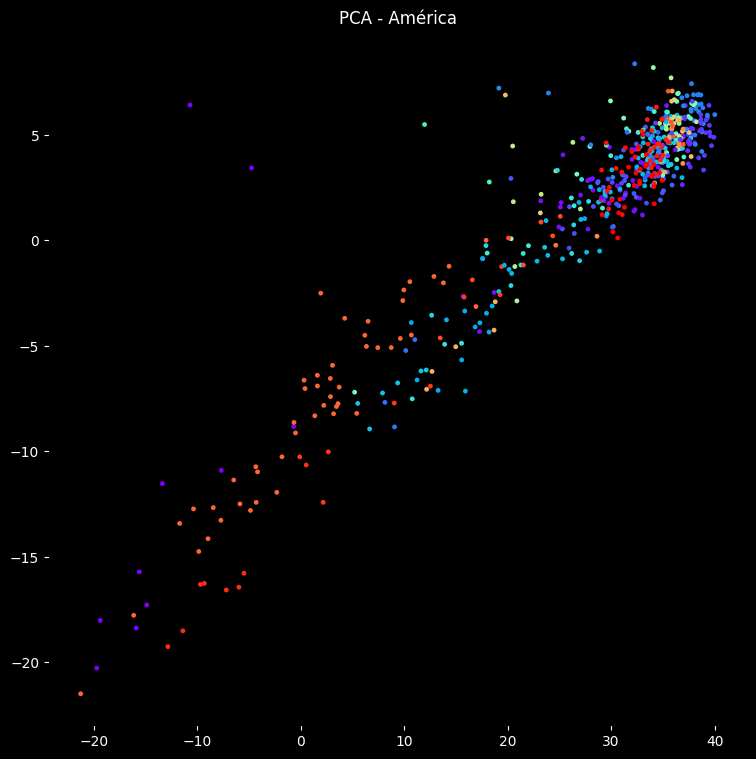

In [ ]:
america_data = origen[origen["Continente"] == "America"]
america_pca = S_pca[origen["Continente"] == "America"]

america_labels = america_data["label"].unique()
america_rainbow = plt.colormaps.get_cmap("rainbow")(np.linspace(0, 1, len(america_labels)))
dict_am = {america_labels[i]: america_rainbow[i] for i in range(len(america_labels))}

# Asignar colores a cada punto de América
colors_america = america_data["label"].apply(lambda x: dict_am[x])

# Plotear PCA para América
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(america_pca[:, 0], america_pca[:, 1], c=colors_america, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA - América", color='white')
plt.show()

In [ ]:
# Definir las nuevas agrupaciones para América
america_norte = [
    'Cree', 'Chipewyan', 'Ojibwa', 'Algonquin', 'Yaqui', 'MEX',
    'Zapotec1', 'Mixe', 'Zapotec2', 'Purepecha', 'Tepehuano',
    'Maya1', 'Maya2'
]
america_central = [
    'Cabecar', 'Kaqchikel', 'Mixtec', 'Wayuu', 'Bribri', 'Ticuna',
    'Maleku', 'Huetar', 'Teribe', 'Waunana', 'Chorotega', 'Arhuaco',
    'Embera', 'Kogi', 'Guaymi'
]
america_sur = [
    'Charrua', 'Piapoco', 'Karitiana', 'Surui', 'Pima', 'Chono',
    'Quechua', 'Chilote', 'Aymara', 'Diaguita', 'Hulliche', 'Inga',
    'Jamamadi', 'Parakana', 'Guarani', 'Kaingang', 'Yaghan',
    'Palikur', 'Toba', 'Arara', 'Wichi', 'Chane', 'Guahibo'
]
region_artica = [
    'EastGreenland', 'WestGreenland', 'Aleutian'
]

# Crear un diccionario para asignar regiones
region_dict = {}
for group, region in zip(
    [america_norte, america_central, america_sur, region_artica],
    ['America del Norte', 'America Central', 'America del Sur', 'Region Artica']
):
    for origin in group:
        region_dict[origin] = region

# Filtrar solo las poblaciones de América
poblaciones_america = america_norte + america_central + america_sur + region_artica

indices_america = origen[origen['label'].isin(poblaciones_america)].index

# Filtrar los puntos del PCA correspondientes a América
S_pca_america = S_pca[indices_america]

# Añadir la columna de regiones al DataFrame 'origen'
origen['Region'] = origen['label'].map(region_dict)

# Filtrar las regiones para los puntos de América
regions_america = origen.loc[indices_america, 'Region']

# Asignar colores a las regiones
region_paint = {
    'America del Norte': 'tab:red',
    'America Central': 'tab:olive',
    'America del Sur': 'tab:purple',
    'Region Artica': 'tab:blue'
}

colors_america = regions_america.apply(lambda x: region_paint.get(x, 'white'))

# Plotear PCA para las poblaciones de América
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(S_pca_america[:, 0], S_pca_america[:, 1], c=colors_america, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA - Poblaciones de América", color='white')
plt.show()

NameError: name 'S_pca' is not defined

In [ ]:
region_paint = {
    'America del Norte': 'tab:red',
    'America Central': 'tab:olive',
    'America del Sur': 'tab:purple',
    'Region Artica': 'tab:blue'
}

colors_america2 = origen['Region'].apply(lambda x: region_paint.get(x, 'white'))

# 5. Plotear PCA
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(S_pca[:, 0], S_pca[:, 1], c=colors_america2, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("PCA - Regiones de América", color='white')
plt.show()

KeyError: 'Region'

#Grafo producto interno y embedding Node2vec

In [ ]:
# Normalizamos por fila (individuo) para que tenga sentido el producto interno
df_norm = data_scaled.copy()
df_norm = normalize(df_norm, norm='l2', axis=1)
display(df_norm)

array([[ 0.01862001,  0.02716563,  0.00195152, ..., -0.00312865,
        -0.00388867,  0.00966709],
       [-0.00238118, -0.00341791,  0.0019554 , ..., -0.00313487,
        -0.0038964 , -0.00945094],
       [-0.00246211, -0.00353408,  0.01220892, ..., -0.00324141,
        -0.00402883,  0.00012168],
       ...,
       [-0.00246605, -0.00353974, -0.00817828, ..., -0.0032466 ,
         0.01007325, -0.0097878 ],
       [-0.00250628, -0.00359748, -0.00831169, ..., -0.00329956,
         0.01023758,  0.00012386],
       [-0.00249015, -0.00357433,  0.00204489, ..., -0.00327833,
        -0.00407472,  0.00012307]])

In [ ]:
producto_interno= np.dot(df_norm, df_norm.T)
producto_interno

array([[ 1.00000000e+00,  2.93415886e-02,  2.55656834e-02, ...,
        -2.02336095e-02, -1.65648809e-02,  8.33324055e-03],
       [ 2.93415886e-02,  1.00000000e+00,  5.75260825e-03, ...,
        -2.33642278e-02, -1.01884627e-02,  1.29377888e-02],
       [ 2.55656834e-02,  5.75260825e-03,  1.00000000e+00, ...,
        -7.94993629e-04, -4.91794956e-03,  8.43810515e-03],
       ...,
       [-2.02336095e-02, -2.33642278e-02, -7.94993629e-04, ...,
         1.00000000e+00,  1.73004863e-01,  1.27471041e-01],
       [-1.65648809e-02, -1.01884627e-02, -4.91794956e-03, ...,
         1.73004863e-01,  1.00000000e+00,  1.44315643e-01],
       [ 8.33324055e-03,  1.29377888e-02,  8.43810515e-03, ...,
         1.27471041e-01,  1.44315643e-01,  1.00000000e+00]])

$$<x_i,x_j> = cos(\theta) \in [0,1]$$

Mayor producto interno, vectores más alineados.

In [ ]:
print(np.min(producto_interno))
print(np.max(producto_interno))
print(np.mean(producto_interno))

-0.07094845832432368
1.0000000000000042
4.7817112664624015e-05


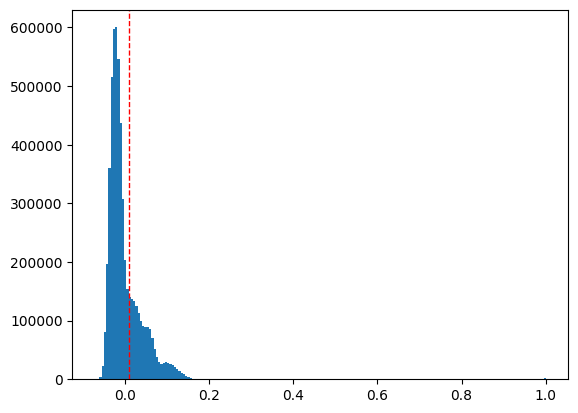

In [ ]:
plt.hist(np.array(producto_interno[producto_interno != 0]).flatten(), bins = 200)
plt.axvline(x=0.011, color='r', linestyle='--', linewidth=1)
plt.show()

In [ ]:
mask = producto_interno > 0.011
Adj = np.where(mask , producto_interno, 0)
Adj

array([[1.        , 0.02934159, 0.02556568, ..., 0.        , 0.        ,
        0.        ],
       [0.02934159, 1.        , 0.        , ..., 0.        , 0.        ,
        0.01293779],
       [0.02556568, 0.        , 1.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 1.        , 0.17300486,
        0.12747104],
       [0.        , 0.        , 0.        , ..., 0.17300486, 1.        ,
        0.14431564],
       [0.        , 0.01293779, 0.        , ..., 0.12747104, 0.14431564,
        1.        ]])

In [ ]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [ ]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

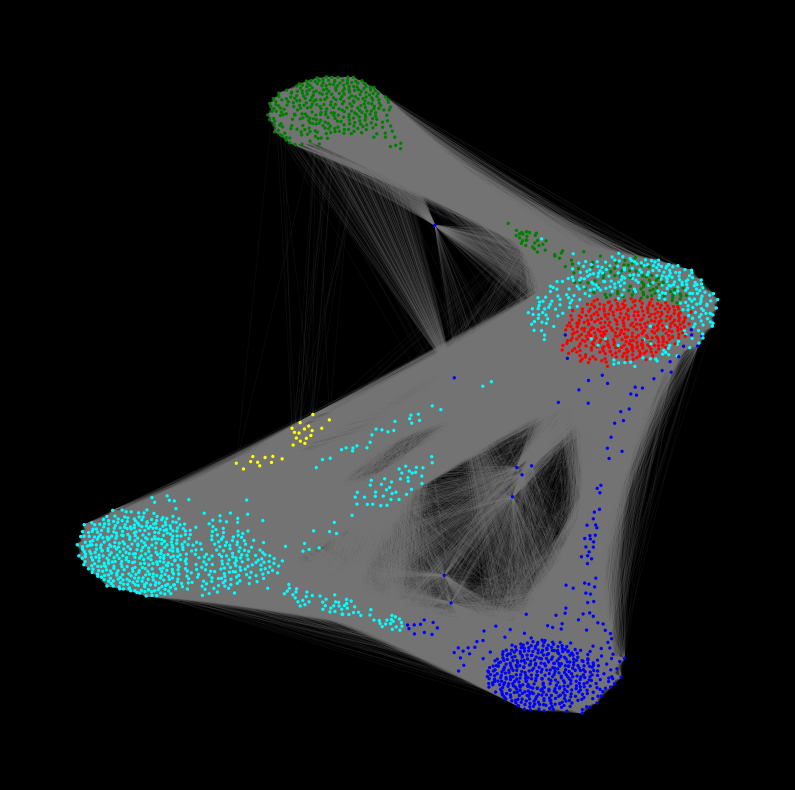

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

In [ ]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.7134, Acc:
Epoch: 02, Loss: 1.5808, Acc:
Epoch: 03, Loss: 1.5071, Acc:
Epoch: 04, Loss: 1.4644, Acc:
Epoch: 05, Loss: 1.4389, Acc:
Epoch: 06, Loss: 1.4225, Acc:
Epoch: 07, Loss: 1.4108, Acc:
Epoch: 08, Loss: 1.3985, Acc:
Epoch: 09, Loss: 1.3822, Acc:
Epoch: 10, Loss: 1.3542, Acc:
Epoch: 11, Loss: 1.3150, Acc:
Epoch: 12, Loss: 1.2768, Acc:
Epoch: 13, Loss: 1.2484, Acc:
Epoch: 14, Loss: 1.2308, Acc:
Epoch: 15, Loss: 1.2191, Acc:
Epoch: 16, Loss: 1.2082, Acc:
Epoch: 17, Loss: 1.2005, Acc:
Epoch: 18, Loss: 1.1961, Acc:
Epoch: 19, Loss: 1.1920, Acc:
Epoch: 20, Loss: 1.1875, Acc:
Epoch: 21, Loss: 1.1848, Acc:
Epoch: 22, Loss: 1.1821, Acc:
Epoch: 23, Loss: 1.1819, Acc:
Epoch: 24, Loss: 1.1792, Acc:
Epoch: 25, Loss: 1.1772, Acc:
Epoch: 26, Loss: 1.1770, Acc:
Epoch: 27, Loss: 1.1792, Acc:
Epoch: 28, Loss: 1.1772, Acc:
Epoch: 29, Loss: 1.1780, Acc:
Epoch: 30, Loss: 1.1780, Acc:
Epoch: 31, Loss: 1.1777, Acc:
Epoch: 32, Loss: 1.1764, Acc:
Epoch: 33, Loss: 1.1759, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec de grafo productos internos')

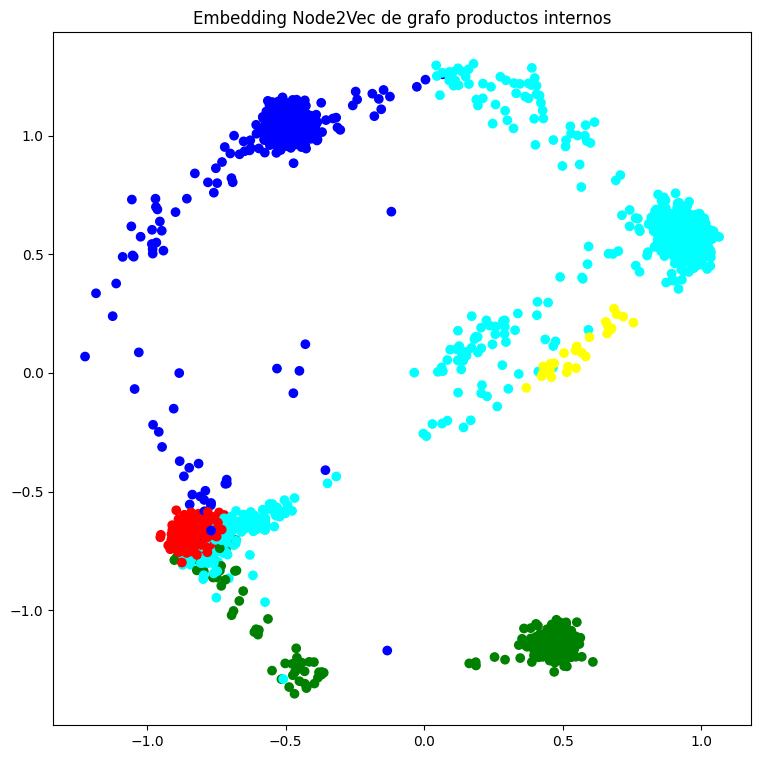

In [ ]:
# Node2vec con grafo pi
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]))
plt.title("Embedding Node2Vec de grafo productos internos")

Text(0.5, 1.0, 'Embedding Node2Vec de grafo productos internos')

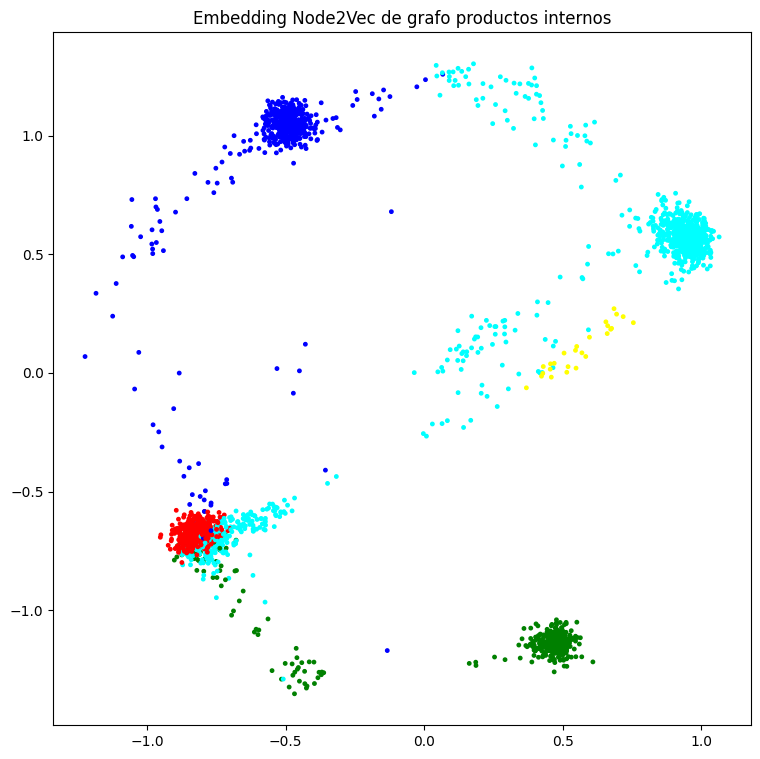

In [ ]:
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=6)
plt.title("Embedding Node2Vec de grafo productos internos")

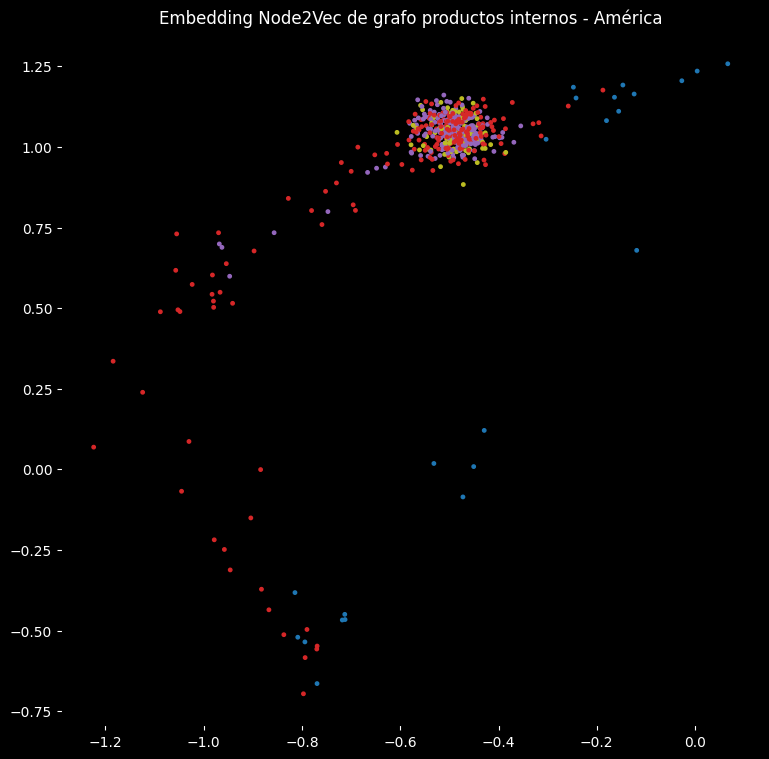

In [ ]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

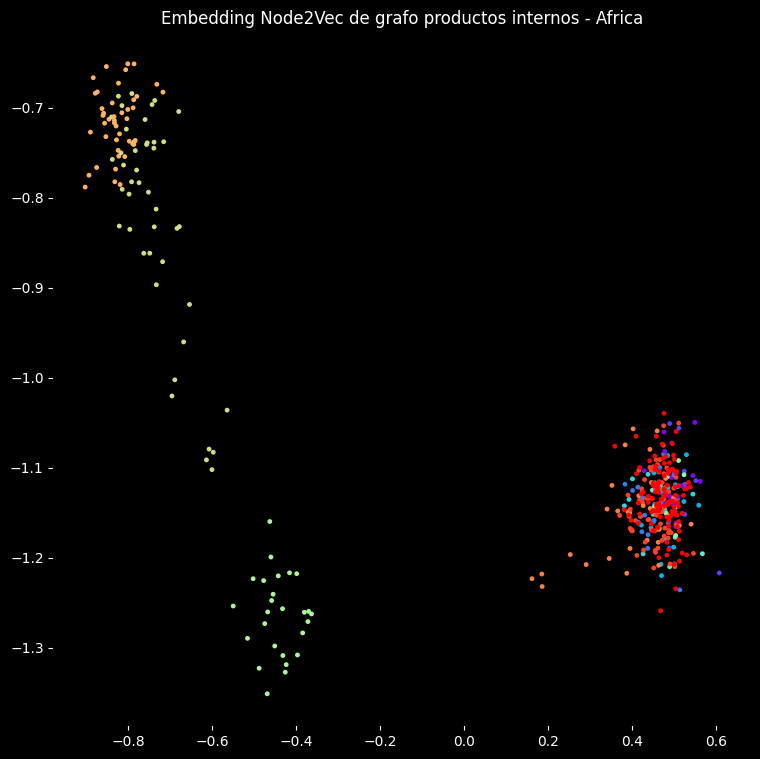

In [ ]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Africa", color='white')  # Cambiar el color del título a blanco
plt.show()

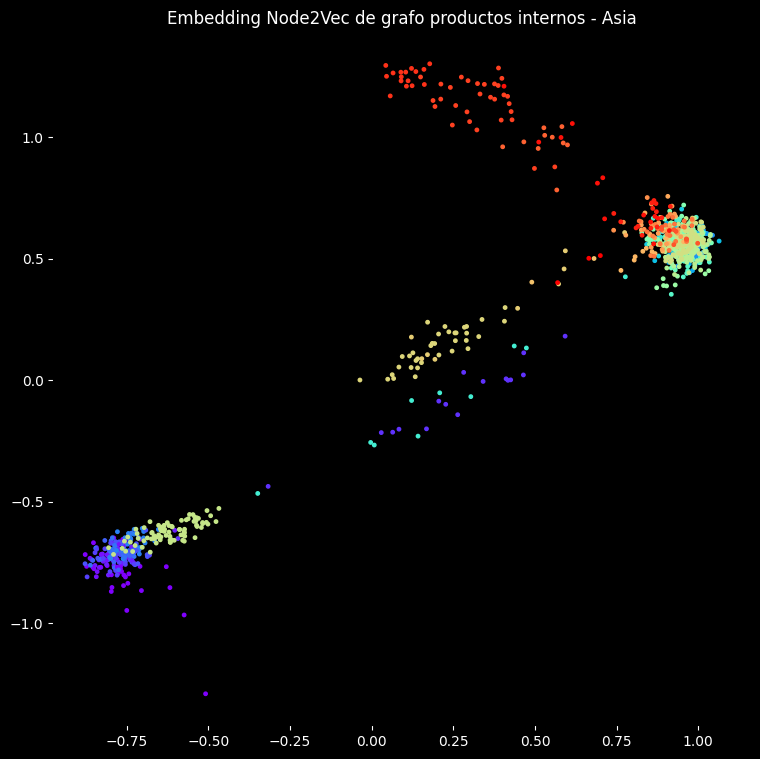

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

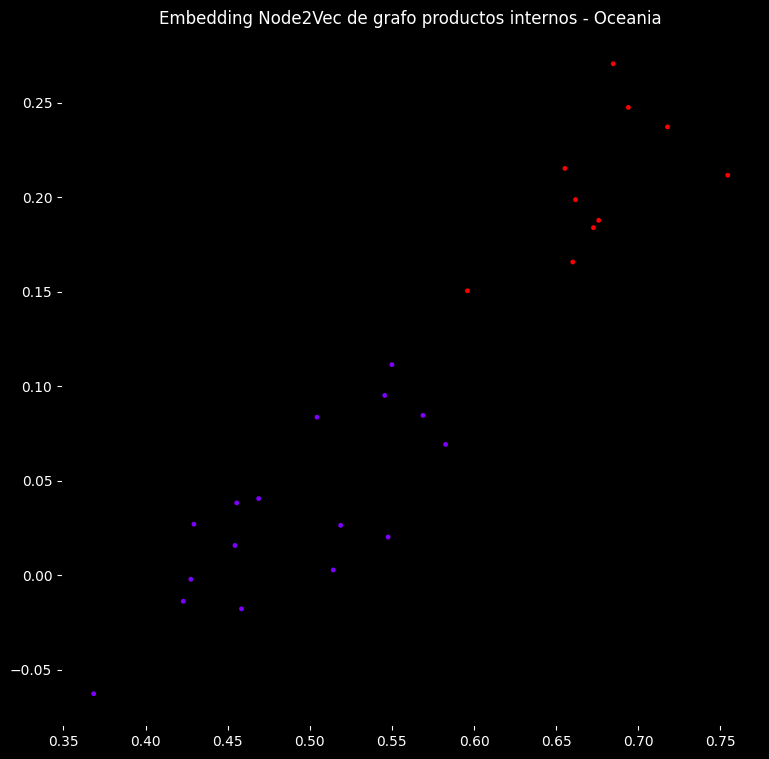

In [ ]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Oceania", color='white')  # Cambiar el color del título a blanco
plt.show()

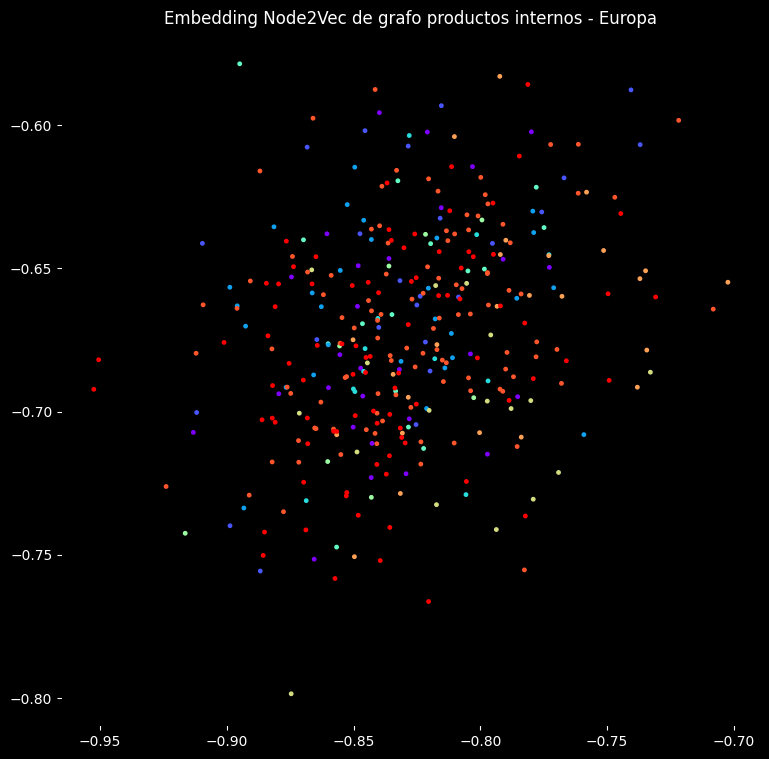

In [ ]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Europa", color='white')  # Cambiar el color del título a blanco
plt.show()

# Producto interno sacando aristas más fuertes

In [ ]:
np.max(producto_interno)

1.0000000000000042

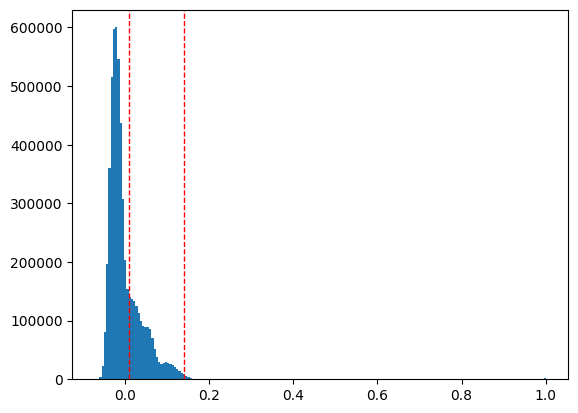

In [ ]:
plt.hist(np.array(producto_interno[producto_interno != 0]).flatten(), bins = 200)
plt.axvline(x=0.011, color='r', linestyle='--', linewidth=1)
plt.axvline(x=0.14, color='r', linestyle='--', linewidth=1)
plt.show()

In [ ]:
mask1 = producto_interno > 0.011
Adj1 = np.where(mask , producto_interno, 0)
mask2 = Adj1 < 0.14
Adj2 = np.where(mask2 , Adj1, 0)
Adj2

array([[0.        , 0.02934159, 0.02556568, ..., 0.        , 0.        ,
        0.        ],
       [0.02934159, 0.        , 0.        , ..., 0.        , 0.        ,
        0.01293779],
       [0.02556568, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.12747104],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.01293779, 0.        , ..., 0.12747104, 0.        ,
        0.        ]])

In [ ]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj2, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [ ]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

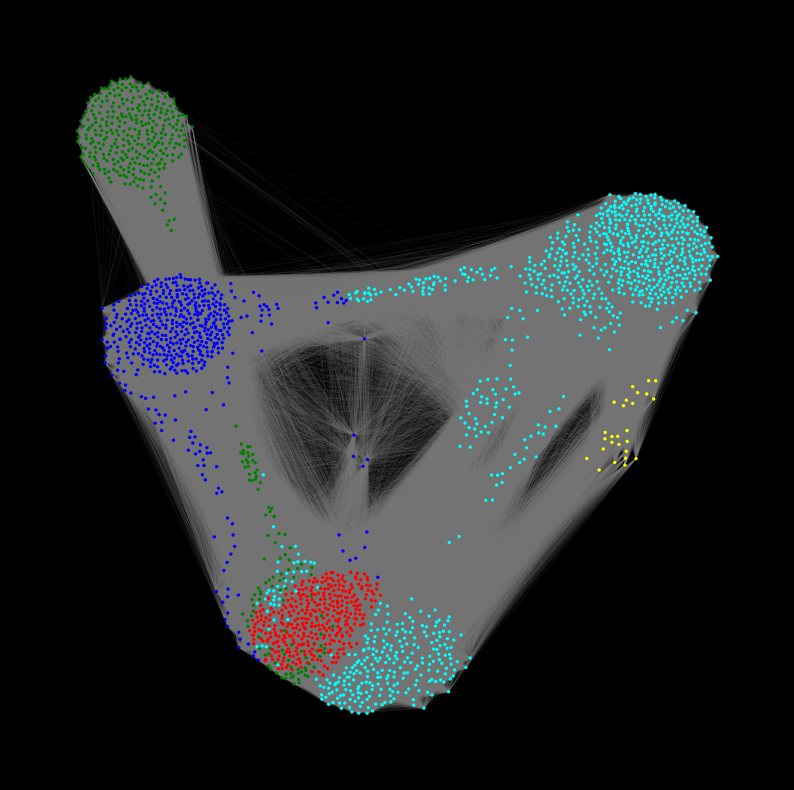

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

In [ ]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6949, Acc:
Epoch: 02, Loss: 1.5706, Acc:
Epoch: 03, Loss: 1.5001, Acc:
Epoch: 04, Loss: 1.4609, Acc:
Epoch: 05, Loss: 1.4365, Acc:
Epoch: 06, Loss: 1.4213, Acc:
Epoch: 07, Loss: 1.4088, Acc:
Epoch: 08, Loss: 1.3952, Acc:
Epoch: 09, Loss: 1.3747, Acc:
Epoch: 10, Loss: 1.3415, Acc:
Epoch: 11, Loss: 1.3013, Acc:
Epoch: 12, Loss: 1.2665, Acc:
Epoch: 13, Loss: 1.2441, Acc:
Epoch: 14, Loss: 1.2329, Acc:
Epoch: 15, Loss: 1.2262, Acc:
Epoch: 16, Loss: 1.2201, Acc:
Epoch: 17, Loss: 1.2193, Acc:
Epoch: 18, Loss: 1.2163, Acc:
Epoch: 19, Loss: 1.2094, Acc:
Epoch: 20, Loss: 1.2031, Acc:
Epoch: 21, Loss: 1.1994, Acc:
Epoch: 22, Loss: 1.1927, Acc:
Epoch: 23, Loss: 1.1890, Acc:
Epoch: 24, Loss: 1.1852, Acc:
Epoch: 25, Loss: 1.1844, Acc:
Epoch: 26, Loss: 1.1805, Acc:
Epoch: 27, Loss: 1.1792, Acc:
Epoch: 28, Loss: 1.1788, Acc:
Epoch: 29, Loss: 1.1774, Acc:
Epoch: 30, Loss: 1.1784, Acc:
Epoch: 31, Loss: 1.1790, Acc:
Epoch: 32, Loss: 1.1781, Acc:
Epoch: 33, Loss: 1.1784, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec de grafo productos internos')

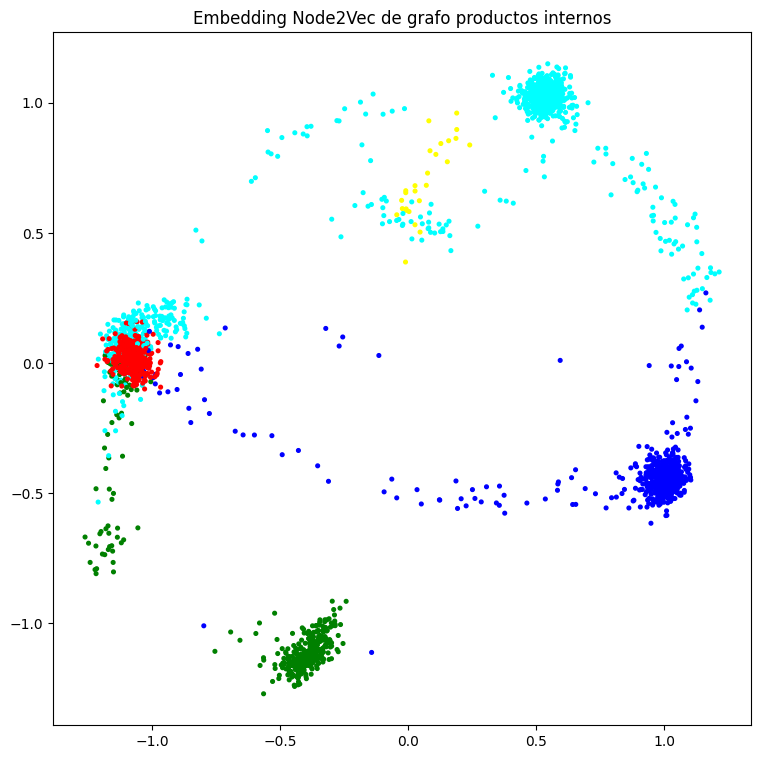

In [ ]:
# Node2vec con grafo pi
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec de grafo productos internos")

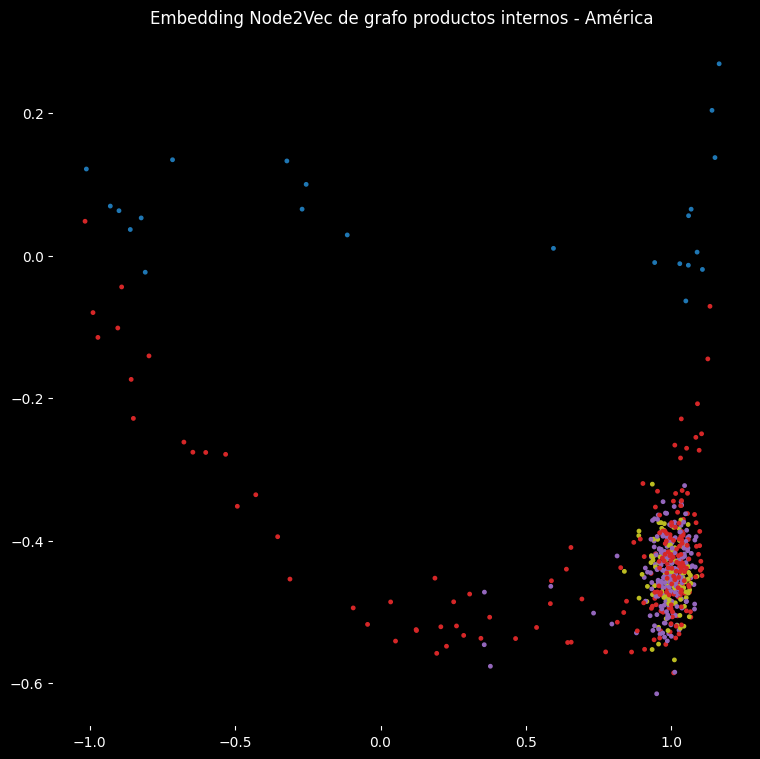

In [ ]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

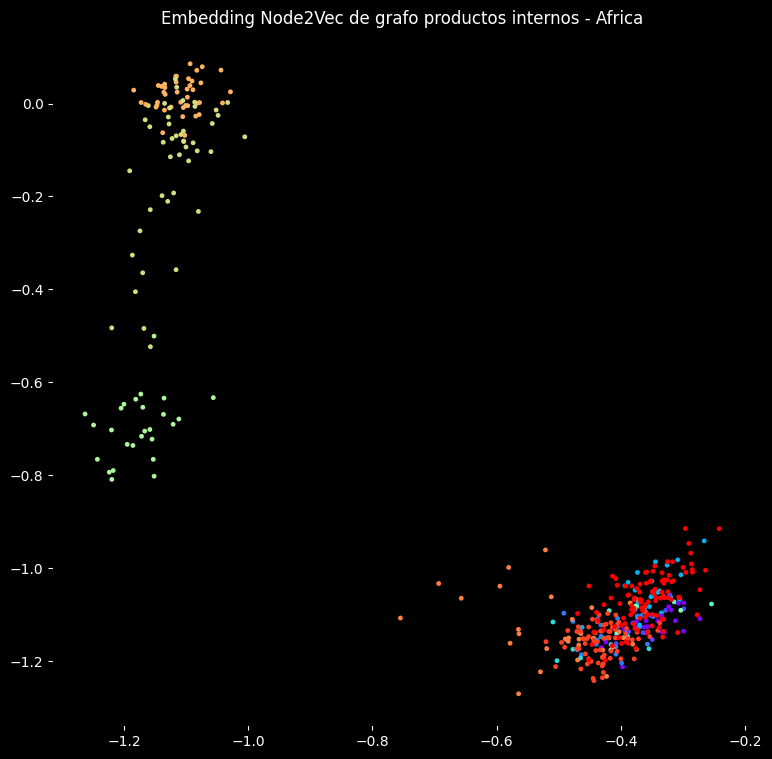

In [ ]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Africa", color='white')  # Cambiar el color del título a blanco
plt.show()

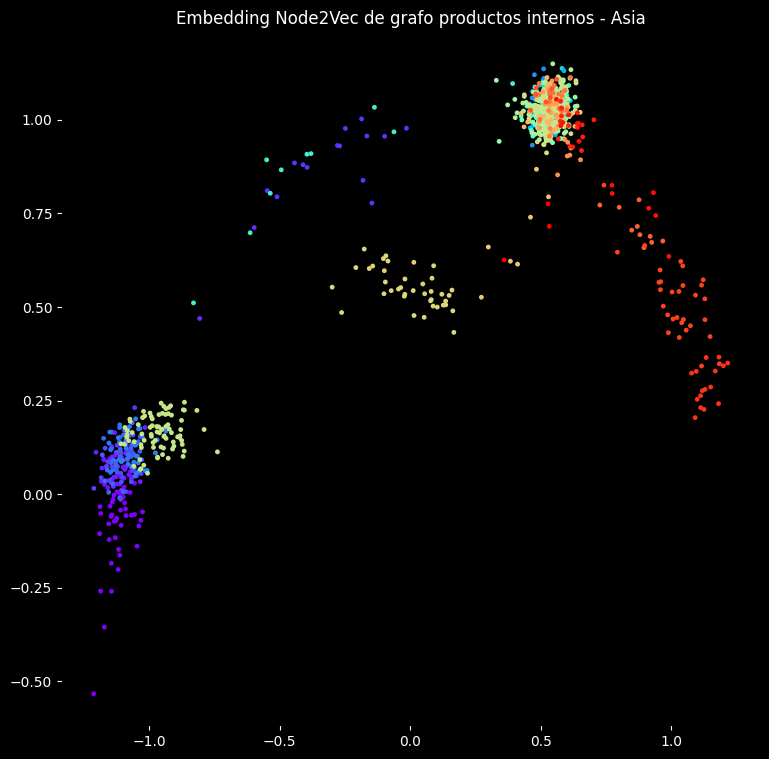

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

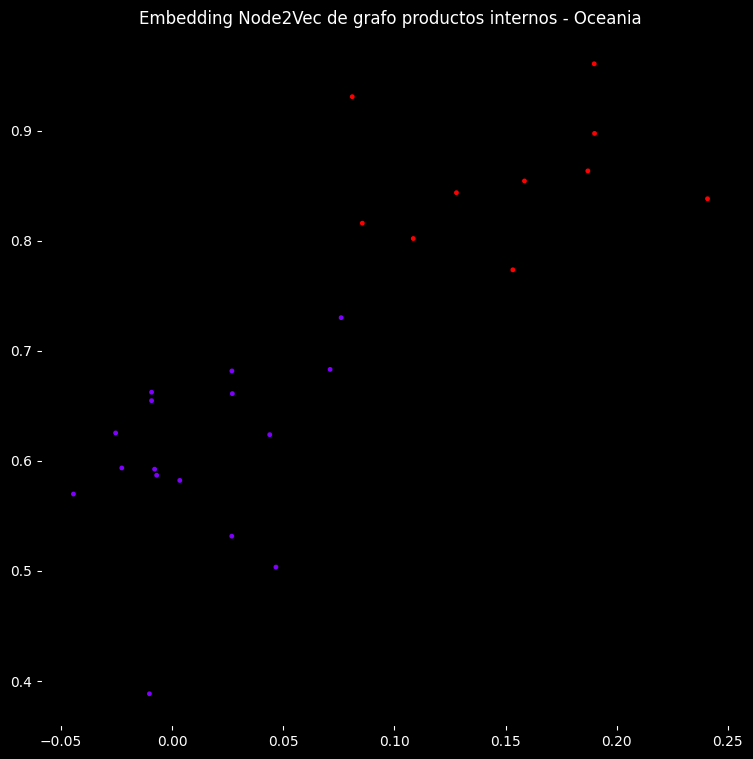

In [ ]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Oceania", color='white')  # Cambiar el color del título a blanco
plt.show()

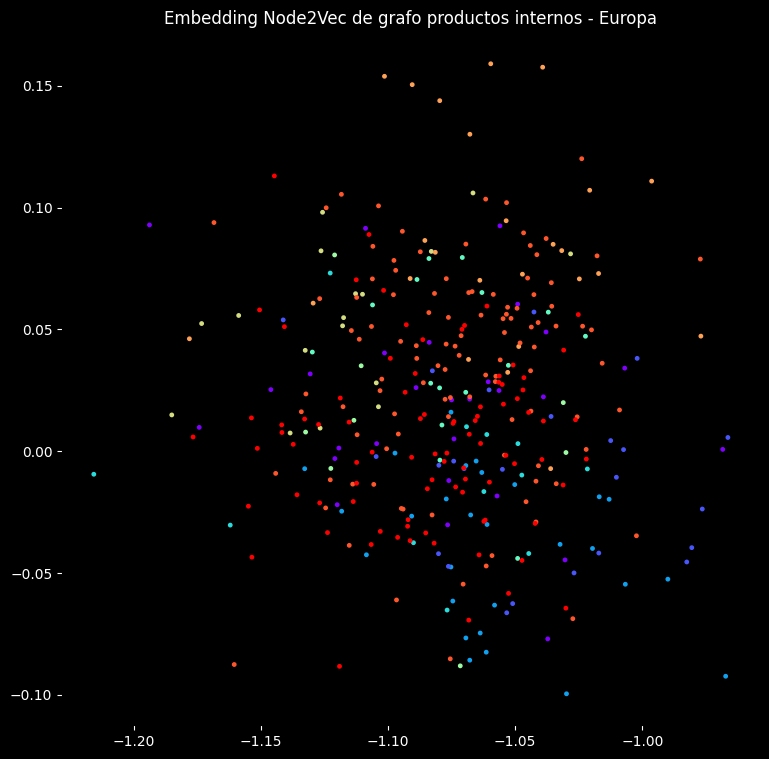

In [ ]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Europa", color='white')  # Cambiar el color del título a blanco
plt.show()

# Producto interno + función

In [ ]:
# Normalizamos por fila (individuo) para que tenga sentido el producto interno
df_norm = data_scaled.copy()
df_norm = normalize(df_norm, norm='l2', axis=1)
display(df_norm)

array([[ 0.01862001,  0.02716563,  0.00195152, ..., -0.00312865,
        -0.00388867,  0.00966709],
       [-0.00238118, -0.00341791,  0.0019554 , ..., -0.00313487,
        -0.0038964 , -0.00945094],
       [-0.00246211, -0.00353408,  0.01220892, ..., -0.00324141,
        -0.00402883,  0.00012168],
       ...,
       [-0.00246605, -0.00353974, -0.00817828, ..., -0.0032466 ,
         0.01007325, -0.0097878 ],
       [-0.00250628, -0.00359748, -0.00831169, ..., -0.00329956,
         0.01023758,  0.00012386],
       [-0.00249015, -0.00357433,  0.00204489, ..., -0.00327833,
        -0.00407472,  0.00012307]])

In [ ]:
producto_interno= np.dot(df_norm, df_norm.T)
producto_interno

array([[ 1.00000000e+00,  2.93415886e-02,  2.55656834e-02, ...,
        -2.02336095e-02, -1.65648809e-02,  8.33324055e-03],
       [ 2.93415886e-02,  1.00000000e+00,  5.75260825e-03, ...,
        -2.33642278e-02, -1.01884627e-02,  1.29377888e-02],
       [ 2.55656834e-02,  5.75260825e-03,  1.00000000e+00, ...,
        -7.94993629e-04, -4.91794956e-03,  8.43810515e-03],
       ...,
       [-2.02336095e-02, -2.33642278e-02, -7.94993629e-04, ...,
         1.00000000e+00,  1.73004863e-01,  1.27471041e-01],
       [-1.65648809e-02, -1.01884627e-02, -4.91794956e-03, ...,
         1.73004863e-01,  1.00000000e+00,  1.44315643e-01],
       [ 8.33324055e-03,  1.29377888e-02,  8.43810515e-03, ...,
         1.27471041e-01,  1.44315643e-01,  1.00000000e+00]])

In [ ]:
print(np.min(producto_interno))
print(np.max(producto_interno))
print(np.mean(producto_interno))

-0.07094845832432368
1.0000000000000042
4.7817112664624015e-05


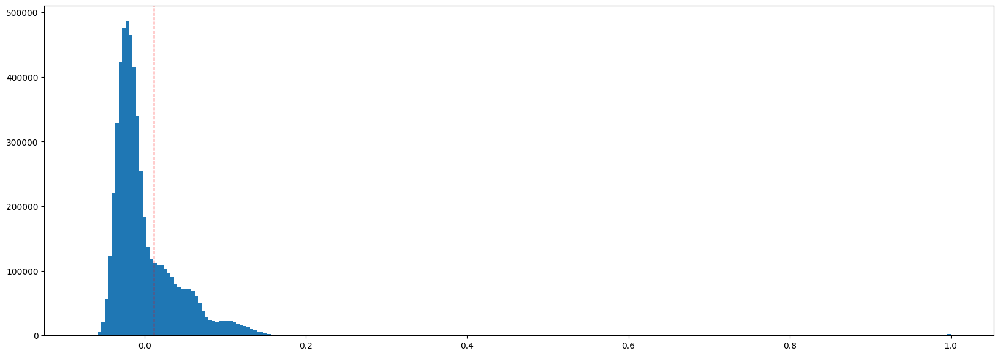

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(20,7)
plt.hist(np.array(producto_interno[producto_interno != 1]).flatten(), bins = 250)
plt.axvline(x=0.011, color='r', linestyle='--', linewidth=1)
plt.show()

In [ ]:
mdf = producto_interno.copy()
mdf += 1 - np.quantile(mdf.flatten(), .75)

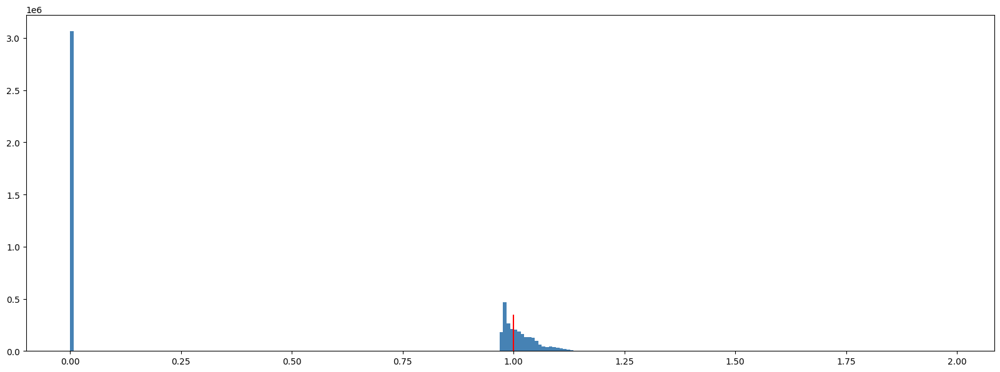

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(20,7)
#ax.set_xlim(0,1)
ax.hist(mdf.flatten(), bins = 250, color = "steelblue")
ax.vlines(1, ymin = 0, ymax = 350000, color = "red")
plt.show()

In [ ]:
mdf = producto_interno.copy()
mdf += 1 - np.quantile(mdf.flatten(), .75)
lq = np.quantile(mdf.flatten(), .55)
mdf[mdf <= lq] = 0

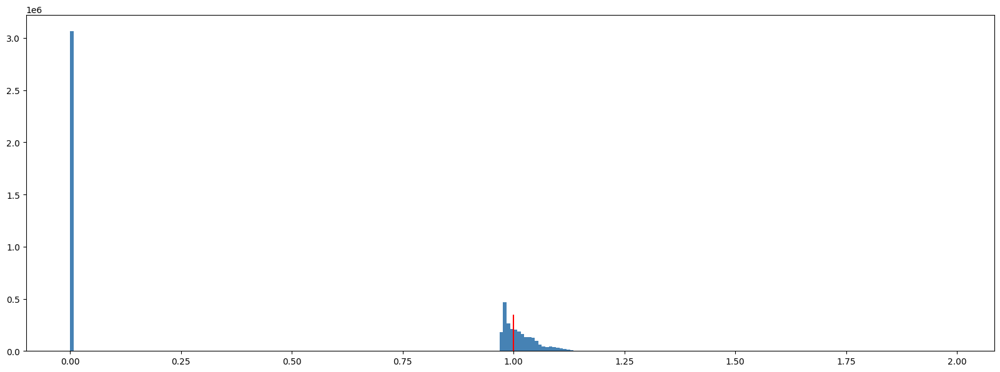

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(20,7)
#ax.set_xlim(0,1)
ax.hist(mdf.flatten(), bins = 250, color = "steelblue")
ax.vlines(1, ymin = 0, ymax = 350000, color = "red")
plt.show()

In [ ]:
mdf_exp = mdf.copy()
mdf_exp[mdf_exp != 0] = np.exp(3 * mdf_exp[mdf_exp != 0])

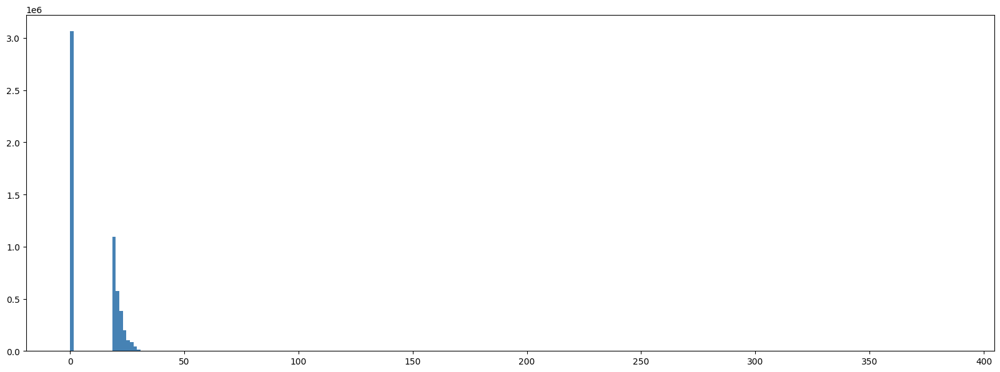

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(20,7)
#ax.set_xlim(0,1)
ax.hist(mdf_exp.flatten(), bins = 250, color = "steelblue")
plt.show()

In [ ]:
np.max(mdf_exp)

385.3109648088363

In [ ]:
np.fill_diagonal(mdf_exp, 0)

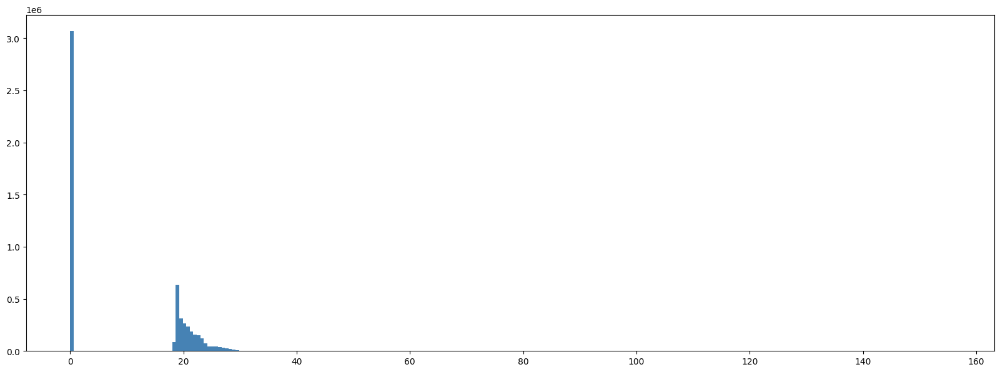

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(20,7)
#ax.set_xlim(0,1)
ax.hist(mdf_exp.flatten(), bins = 250, color = "steelblue")
plt.show()

In [ ]:
mdf_exp

array([[ 0.        , 20.9486766 , 20.71271492, ...,  0.        ,
         0.        , 19.66913057],
       [20.9486766 ,  0.        , 19.51744213, ...,  0.        ,
        18.60602254, 19.94271823],
       [20.71271492, 19.51744213,  0.        , ..., 19.13780557,
        18.90255051, 19.67531933],
       ...,
       [ 0.        ,  0.        , 19.13780557, ...,  0.        ,
        32.23540227, 28.11951537],
       [ 0.        , 18.60602254, 18.90255051, ..., 32.23540227,
         0.        , 29.57701791],
       [19.66913057, 19.94271823, 19.67531933, ..., 28.11951537,
        29.57701791,  0.        ]])

In [ ]:
mask = mdf_exp > 20
Adj = np.where(mask , mdf_exp, 0)
Adj

array([[ 0.        , 20.9486766 , 20.71271492, ...,  0.        ,
         0.        ,  0.        ],
       [20.9486766 ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [20.71271492,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
        32.23540227, 28.11951537],
       [ 0.        ,  0.        ,  0.        , ..., 32.23540227,
         0.        , 29.57701791],
       [ 0.        ,  0.        ,  0.        , ..., 28.11951537,
        29.57701791,  0.        ]])

In [ ]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [ ]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

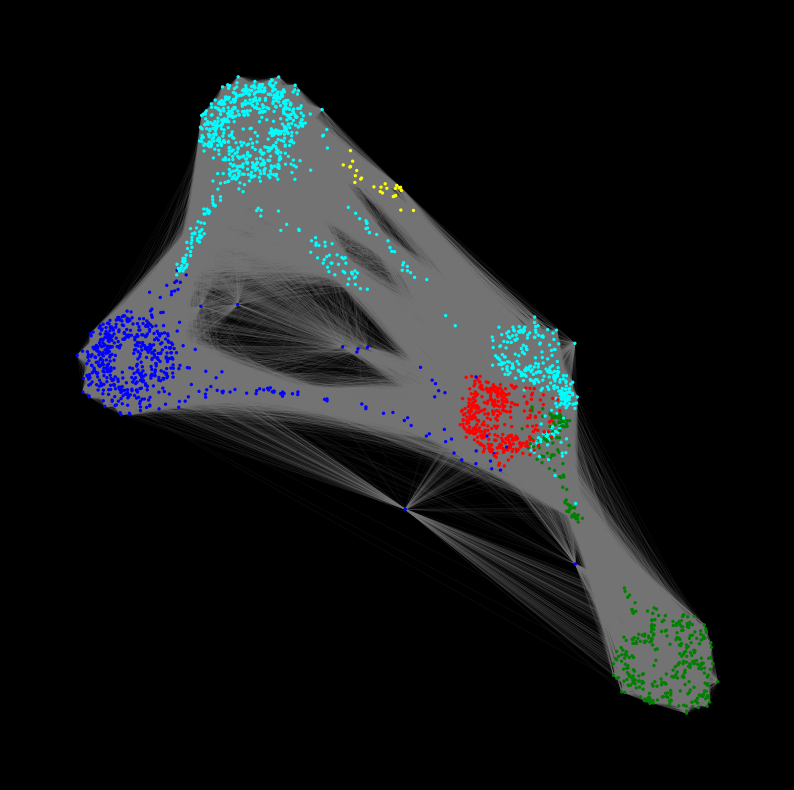

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

In [ ]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6715, Acc:
Epoch: 02, Loss: 1.5540, Acc:
Epoch: 03, Loss: 1.4874, Acc:
Epoch: 04, Loss: 1.4508, Acc:
Epoch: 05, Loss: 1.4300, Acc:
Epoch: 06, Loss: 1.4163, Acc:
Epoch: 07, Loss: 1.4066, Acc:
Epoch: 08, Loss: 1.3982, Acc:
Epoch: 09, Loss: 1.3879, Acc:
Epoch: 10, Loss: 1.3732, Acc:
Epoch: 11, Loss: 1.3502, Acc:
Epoch: 12, Loss: 1.3142, Acc:
Epoch: 13, Loss: 1.2730, Acc:
Epoch: 14, Loss: 1.2333, Acc:
Epoch: 15, Loss: 1.2035, Acc:
Epoch: 16, Loss: 1.1817, Acc:
Epoch: 17, Loss: 1.1662, Acc:
Epoch: 18, Loss: 1.1595, Acc:
Epoch: 19, Loss: 1.1545, Acc:
Epoch: 20, Loss: 1.1531, Acc:
Epoch: 21, Loss: 1.1496, Acc:
Epoch: 22, Loss: 1.1498, Acc:
Epoch: 23, Loss: 1.1461, Acc:
Epoch: 24, Loss: 1.1466, Acc:
Epoch: 25, Loss: 1.1485, Acc:
Epoch: 26, Loss: 1.1477, Acc:
Epoch: 27, Loss: 1.1466, Acc:
Epoch: 28, Loss: 1.1455, Acc:
Epoch: 29, Loss: 1.1451, Acc:
Epoch: 30, Loss: 1.1464, Acc:
Epoch: 31, Loss: 1.1469, Acc:
Epoch: 32, Loss: 1.1467, Acc:
Epoch: 33, Loss: 1.1469, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec de grafo productos internos')

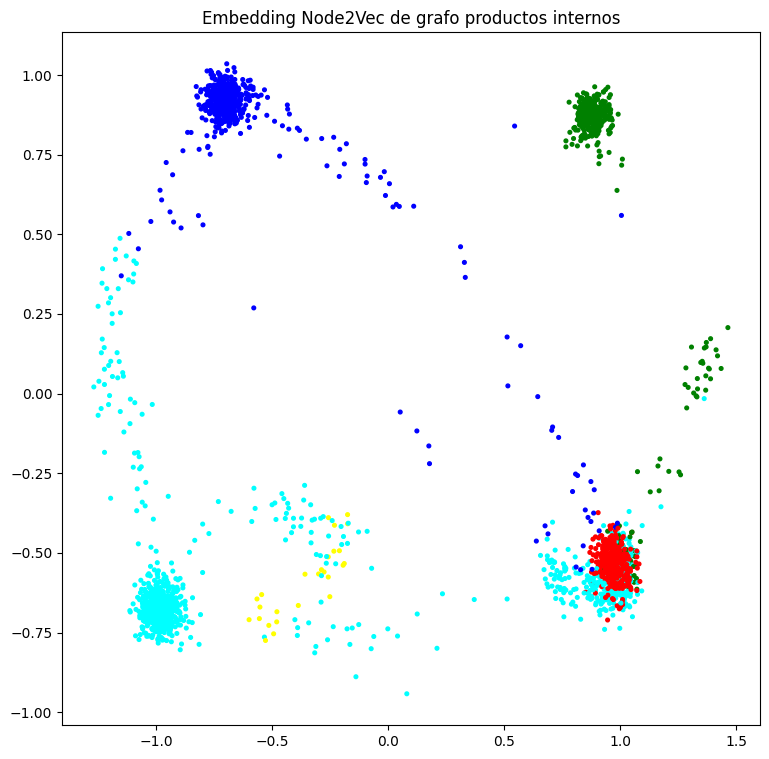

In [ ]:
# Node2vec con grafo pi
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec de grafo productos internos")

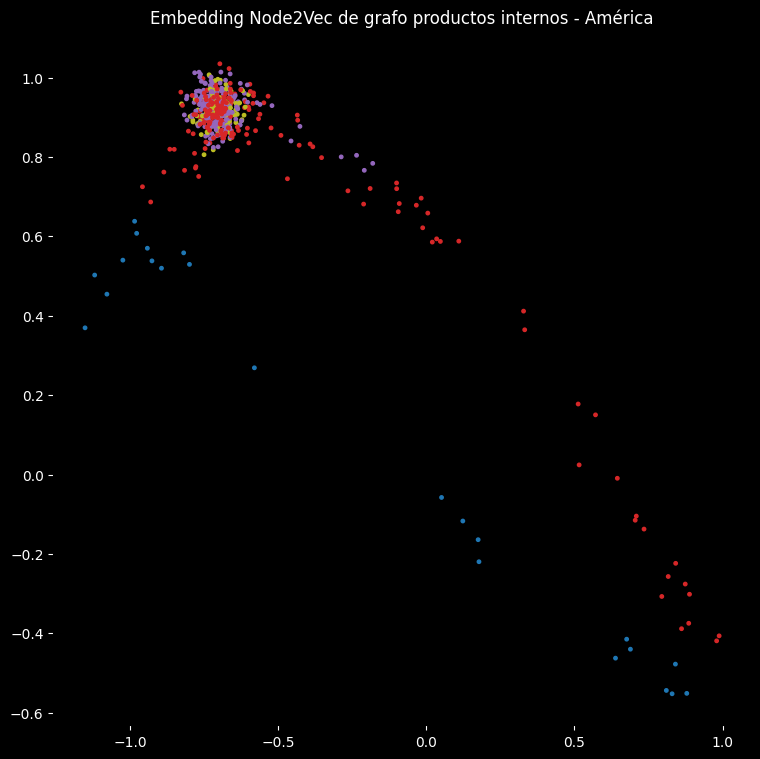

In [ ]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

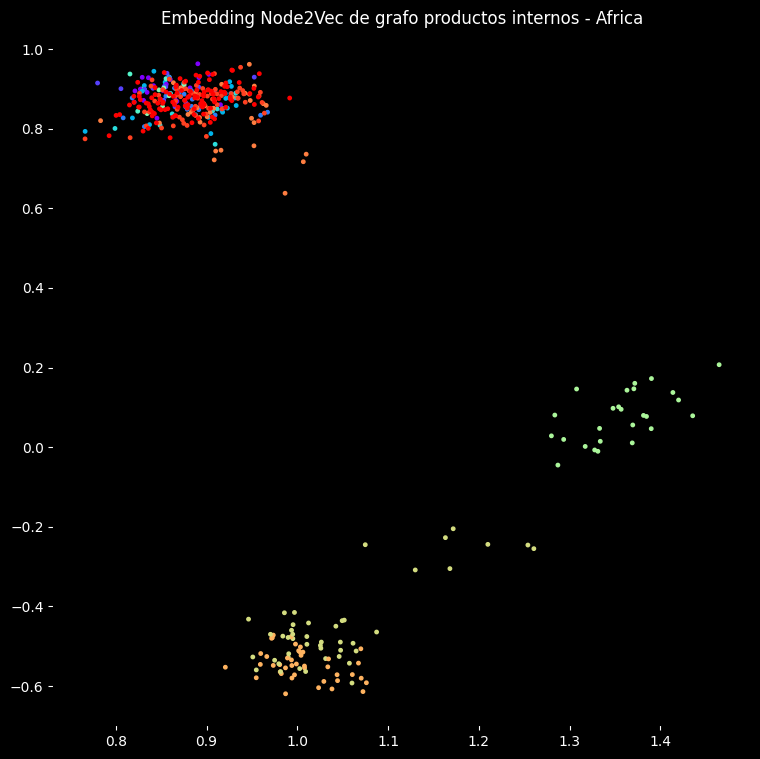

In [ ]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Africa", color='white')  # Cambiar el color del título a blanco
plt.show()

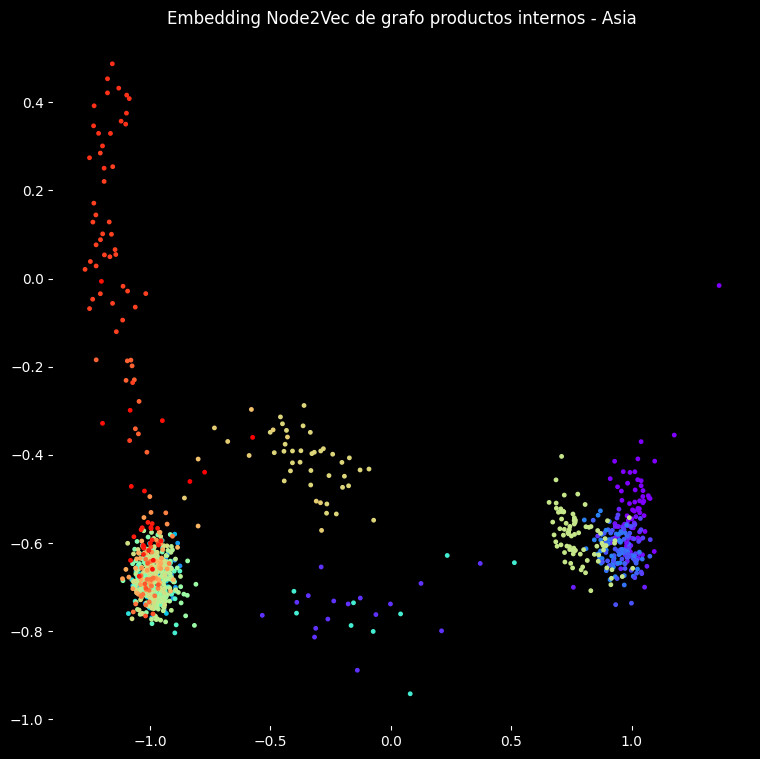

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

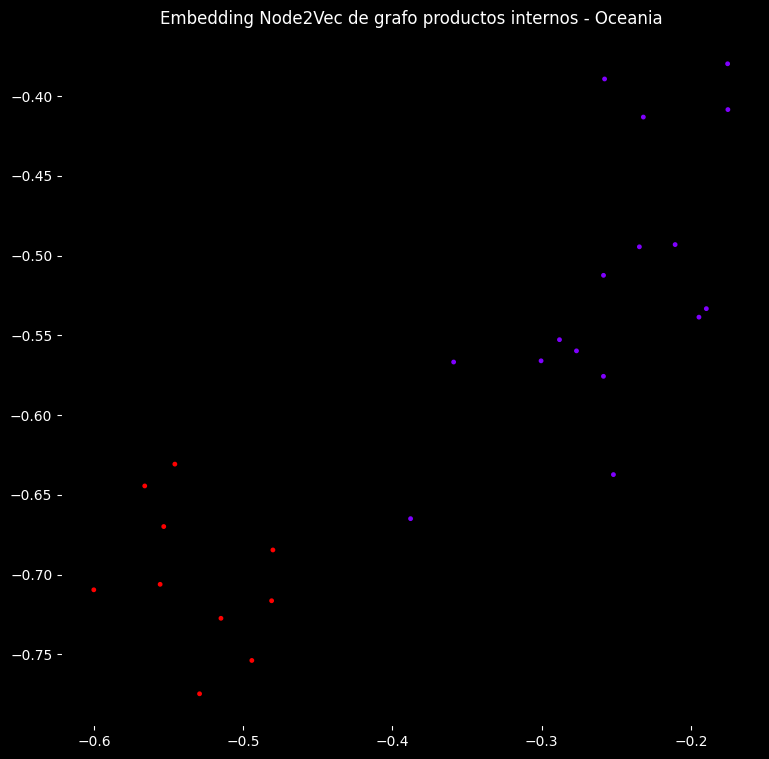

In [ ]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Oceania", color='white')  # Cambiar el color del título a blanco
plt.show()

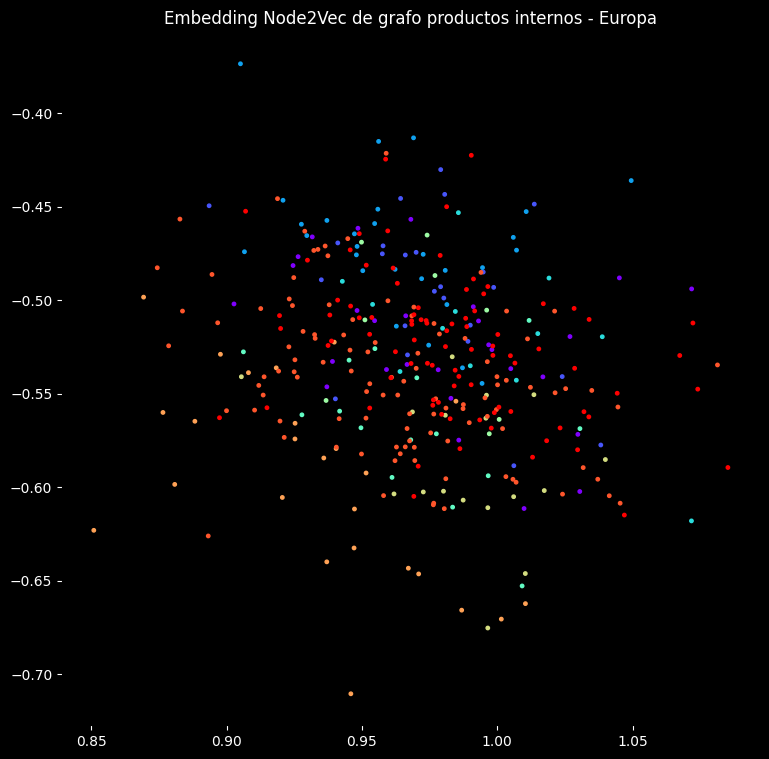

In [ ]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Europa", color='white')  # Cambiar el color del título a blanco
plt.show()

# Producto interno sin estandarizar columnas

In [ ]:
df_norm = data_imputed.copy()
df_norm = normalize(df_norm, norm='l2', axis=1)
display(df_norm)

array([[0.00904505, 0.01809011, 0.00904505, ..., 0.        , 0.        ,
        0.01809011],
       [0.        , 0.        , 0.00900317, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.01841305, ..., 0.        , 0.        ,
        0.00920653],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.00907742,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.00925025,
        0.00925025],
       [0.        , 0.        , 0.0092183 , ..., 0.        , 0.        ,
        0.0092183 ]])

In [ ]:
producto_interno = np.dot(df_norm, df_norm.T)
producto_interno

array([[1.        , 0.47223636, 0.46924626, ..., 0.44066129, 0.43967696,
        0.46009065],
       [0.47223636, 1.        , 0.46342613, ..., 0.43927441, 0.44797137,
        0.46272302],
       [0.46924626, 0.46342613, 1.        , ..., 0.45111877, 0.44922485,
        0.46261808],
       ...,
       [0.44066129, 0.43927441, 0.45111877, ..., 1.        , 0.53536234,
        0.51753566],
       [0.43967696, 0.44797137, 0.44922485, ..., 0.53536234, 1.        ,
        0.52959753],
       [0.46009065, 0.46272302, 0.46261808, ..., 0.51753566, 0.52959753,
        1.        ]])

In [ ]:
print(np.min(producto_interno))
print(np.max(producto_interno))
print(np.mean(producto_interno))

0.3680012987979431
1.0000000000000027
0.4481430439814289


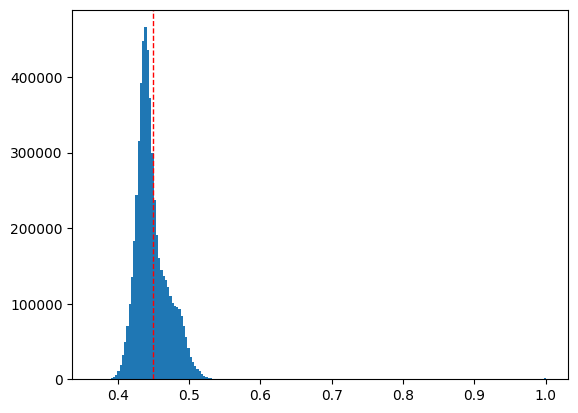

In [ ]:
plt.hist(np.array(producto_interno[producto_interno != 1]).flatten(), bins = 200)
plt.axvline(x=0.45, color='r', linestyle='--', linewidth=1)
plt.show()

In [ ]:
mask = producto_interno > 0.45
Adj = np.where(mask , producto_interno, 0)
Adj

array([[1.        , 0.47223636, 0.46924626, ..., 0.        , 0.        ,
        0.46009065],
       [0.47223636, 1.        , 0.46342613, ..., 0.        , 0.        ,
        0.46272302],
       [0.46924626, 0.46342613, 1.        , ..., 0.45111877, 0.        ,
        0.46261808],
       ...,
       [0.        , 0.        , 0.45111877, ..., 1.        , 0.53536234,
        0.51753566],
       [0.        , 0.        , 0.        , ..., 0.53536234, 1.        ,
        0.52959753],
       [0.46009065, 0.46272302, 0.46261808, ..., 0.51753566, 0.52959753,
        1.        ]])

In [ ]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [ ]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

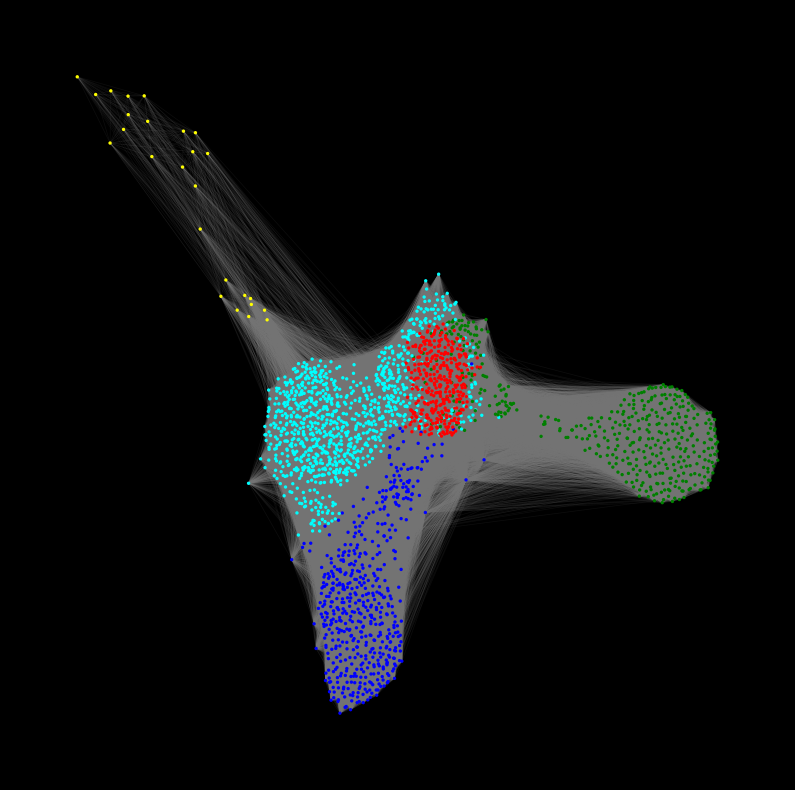

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

In [ ]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6954, Acc:
Epoch: 02, Loss: 1.5668, Acc:
Epoch: 03, Loss: 1.4956, Acc:
Epoch: 04, Loss: 1.4562, Acc:
Epoch: 05, Loss: 1.4336, Acc:
Epoch: 06, Loss: 1.4196, Acc:
Epoch: 07, Loss: 1.4103, Acc:
Epoch: 08, Loss: 1.4042, Acc:
Epoch: 09, Loss: 1.3998, Acc:
Epoch: 10, Loss: 1.3965, Acc:
Epoch: 11, Loss: 1.3937, Acc:
Epoch: 12, Loss: 1.3913, Acc:
Epoch: 13, Loss: 1.3886, Acc:
Epoch: 14, Loss: 1.3851, Acc:
Epoch: 15, Loss: 1.3805, Acc:
Epoch: 16, Loss: 1.3749, Acc:
Epoch: 17, Loss: 1.3661, Acc:
Epoch: 18, Loss: 1.3563, Acc:
Epoch: 19, Loss: 1.3439, Acc:
Epoch: 20, Loss: 1.3321, Acc:
Epoch: 21, Loss: 1.3252, Acc:
Epoch: 22, Loss: 1.3177, Acc:
Epoch: 23, Loss: 1.3143, Acc:
Epoch: 24, Loss: 1.3091, Acc:
Epoch: 25, Loss: 1.3060, Acc:
Epoch: 26, Loss: 1.3022, Acc:
Epoch: 27, Loss: 1.2998, Acc:
Epoch: 28, Loss: 1.2994, Acc:
Epoch: 29, Loss: 1.2972, Acc:
Epoch: 30, Loss: 1.2964, Acc:
Epoch: 31, Loss: 1.2957, Acc:
Epoch: 32, Loss: 1.2959, Acc:
Epoch: 33, Loss: 1.2952, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec de grafo productos internos')

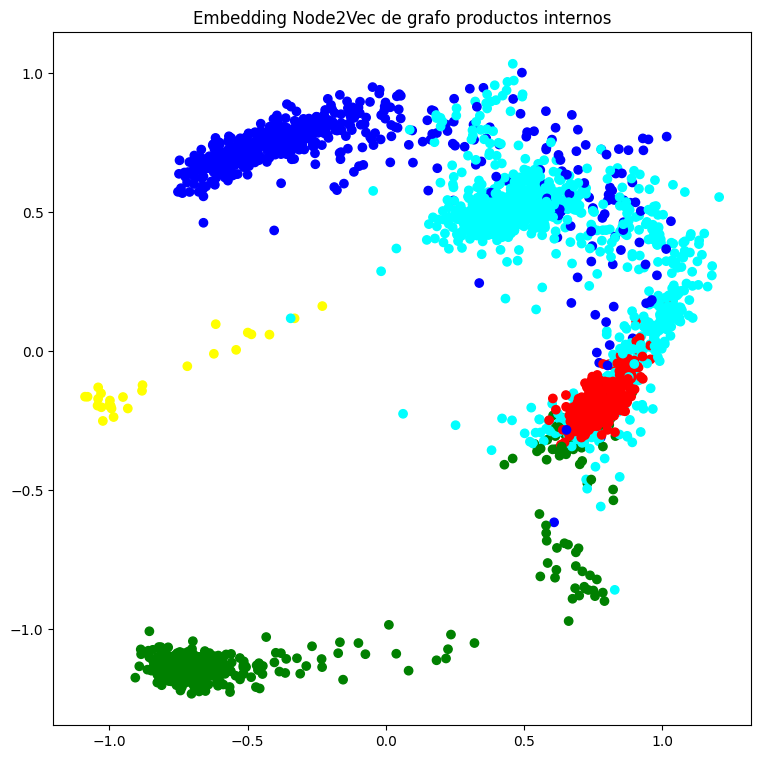

In [ ]:
# Node2vec con grafo pi
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]))
plt.title("Embedding Node2Vec de grafo productos internos")

Cuando no estandarizamos las variables, el embedding se parece más a PCA.

Text(0.5, 1.0, 'Embedding Node2Vec de grafo productos internos')

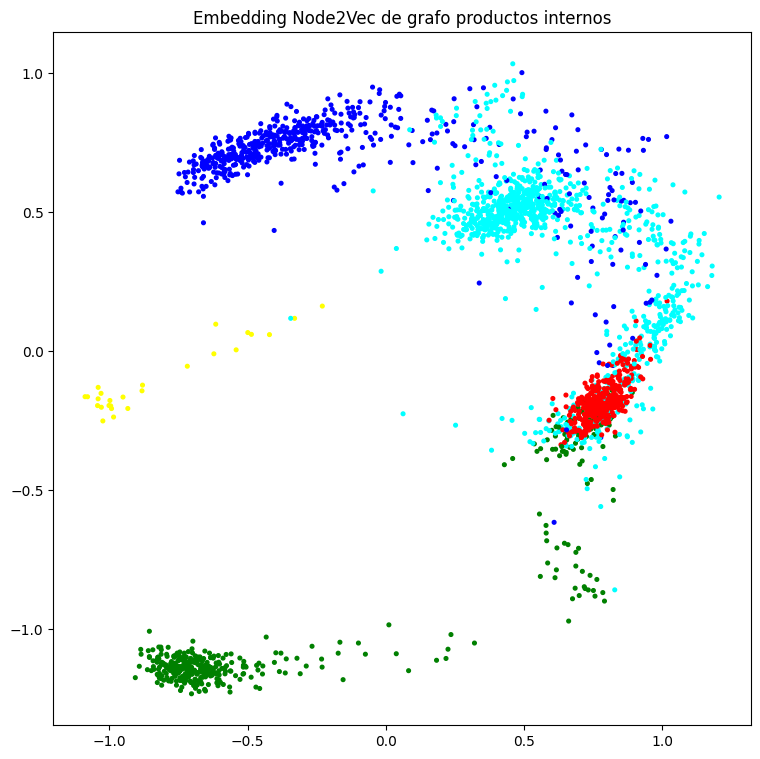

In [ ]:
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec de grafo productos internos")

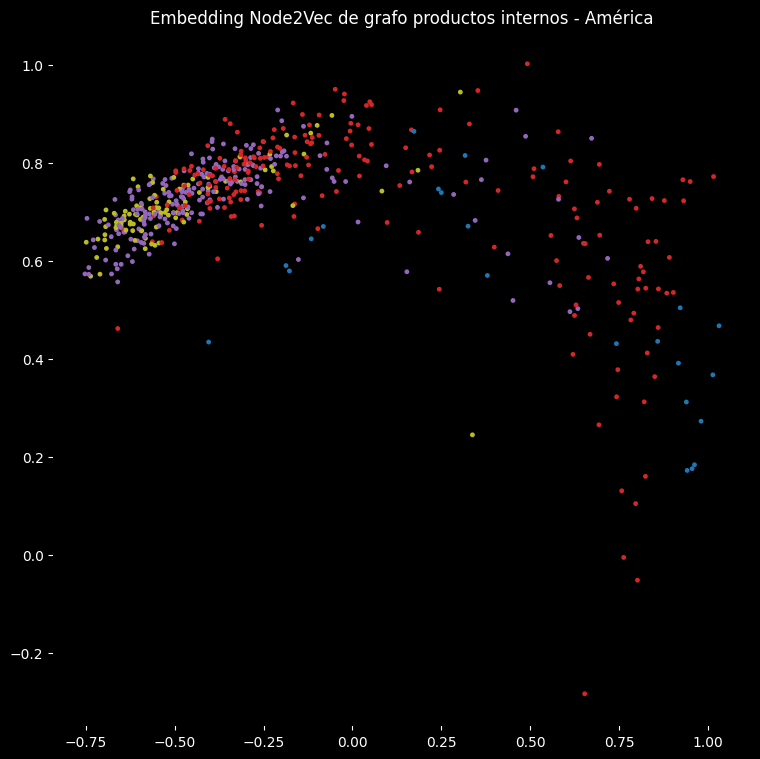

In [ ]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

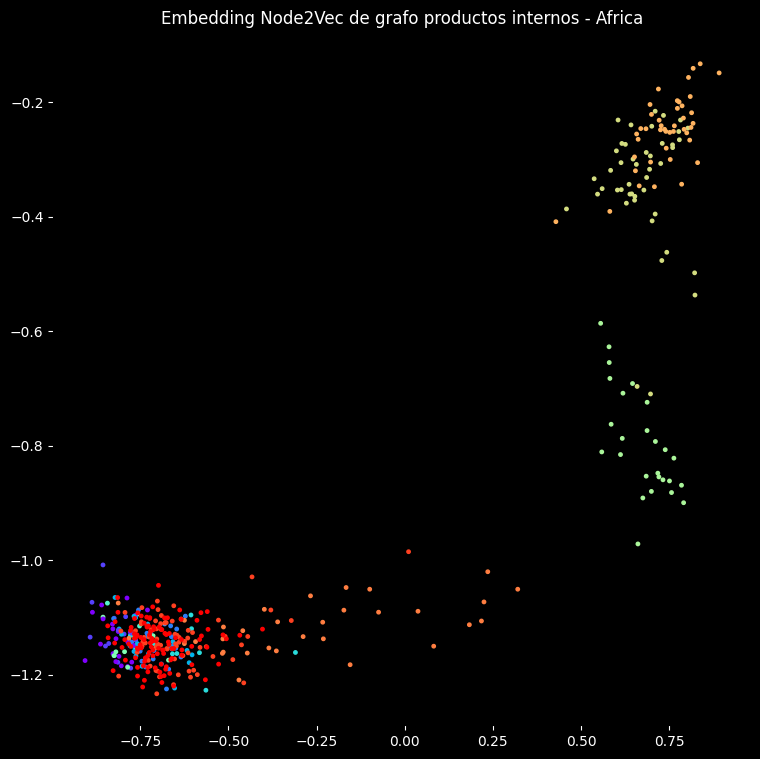

In [ ]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Africa", color='white')  # Cambiar el color del título a blanco
plt.show()

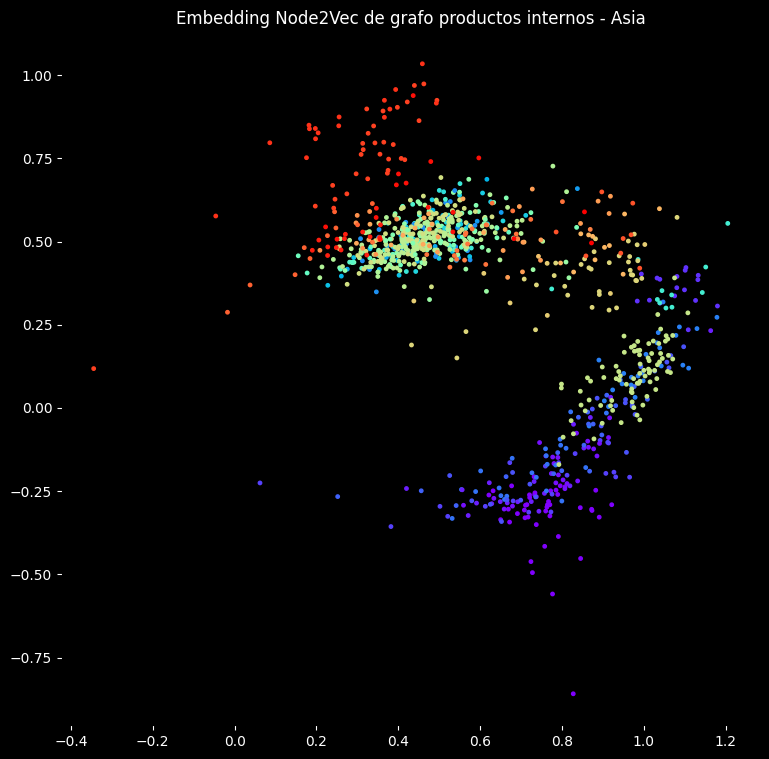

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

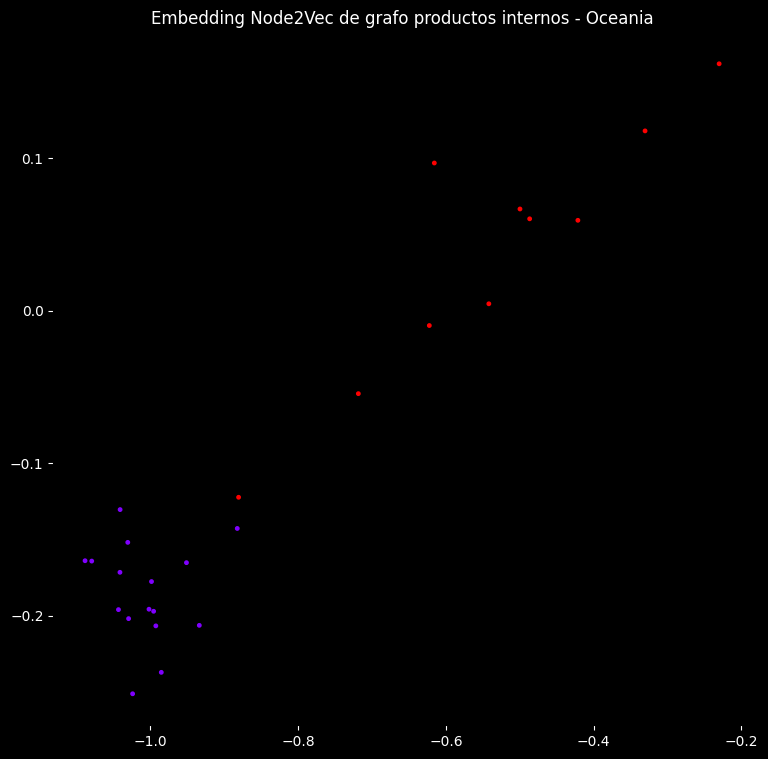

In [ ]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Oceania", color='white')  # Cambiar el color del título a blanco
plt.show()

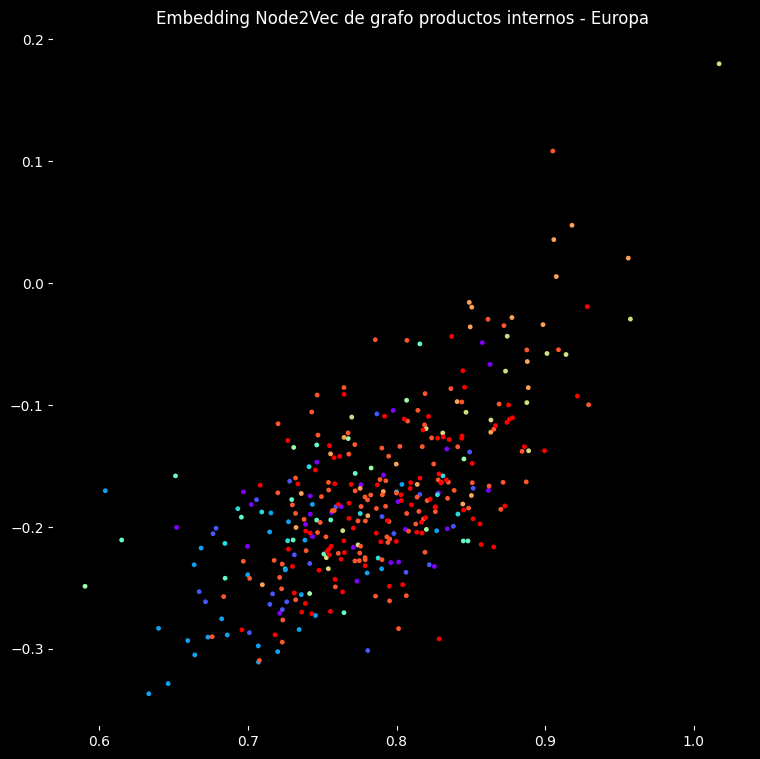

In [ ]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Europa", color='white')  # Cambiar el color del título a blanco
plt.show()

# Distancia F2

In [ ]:
from scipy.spatial.distance import pdist, squareform

In [ ]:
distances = pdist(data_imputed, metric='euclidean') #distancia euclidea

# Convierte el resultado en una matriz de distancias
distance_matrix = pd.DataFrame(squareform(distances), index=df.index, columns=df.index)

In [ ]:
distance_matrix

,1_C1_1_C1,2_C2_2_C2,3_C3_3_C3,4_C4_4_C4,5_C5_5_C5,6_C6_6_C6,7_C7_7_C7,8_C8_8_C8,9_C9_9_C9,10_C10_10_C10,...,2352_NAD15_2352_NAD15,2353_NAD54_2353_NAD54,2354_NAD55_2354_NAD55,2355_NAD56_2355_NAD56,2356_NAD57_2356_NAD57,2357_NAD59_2357_NAD59,2358_NAD64_2358_NAD64,2359_NAD93_2359_NAD93,2360_NAD96_2360_NAD96,2361_NAD98_2361_NAD98
1_C1_1_C1,0.000000,113.850780,112.920326,113.859563,112.951317,112.787411,113.754121,113.225439,112.778544,114.275982,...,114.647743,115.169564,115.779964,114.957270,114.293482,117.213480,113.914480,116.726175,115.757579,113.819570
2_C2_2_C2,113.850780,0.000000,113.811247,114.245350,113.384302,113.371072,113.736538,113.446022,112.458881,113.855171,...,115.533999,114.525231,115.260574,115.355107,114.354711,116.854611,114.223143,117.145209,115.176949,113.816141
3_C3_3_C3,112.920326,113.811247,0.000000,114.118360,112.734201,113.154761,114.109596,112.609946,111.660199,111.749720,...,112.670920,112.849583,113.789279,113.534700,113.039816,114.568757,112.915343,114.621115,113.731807,112.533970
4_C4_4_C4,113.859563,114.245350,114.118360,0.000000,113.534136,113.644182,113.393121,114.463968,113.916636,114.721402,...,116.951854,115.991502,117.085439,116.555061,115.442626,118.097417,115.193394,119.008403,116.851212,114.455241
5_C5_5_C5,112.951317,113.384302,112.734201,113.534136,0.000000,113.070774,112.667653,113.745330,113.238686,113.600176,...,114.462816,114.157910,116.185197,114.789219,114.223465,116.666190,114.335145,117.460632,115.481186,113.276620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,117.213480,116.854611,114.568757,118.097417,116.666190,117.038455,117.894020,116.982905,114.227842,114.821601,...,105.559160,104.580249,107.740429,102.265214,107.443008,0.000000,105.510290,101.054441,104.081240,108.627319
2358_NAD64_2358_NAD64,113.914480,114.223143,112.915343,115.193394,114.335145,113.773807,114.791281,114.354304,112.276724,112.513128,...,105.754375,106.195875,105.127970,103.901935,102.686314,105.510290,0.000000,104.342442,103.026792,101.344836
2359_NAD93_2359_NAD93,116.726175,117.145209,114.621115,119.008403,117.460632,116.893114,118.292012,116.726175,113.921025,115.230204,...,104.168637,104.004944,105.527248,104.757692,106.976633,101.054441,104.342442,0.000000,105.219797,107.397596
2360_NAD96_2360_NAD96,115.757579,115.176949,113.731807,116.851212,115.481186,114.948709,116.025531,115.030100,112.911047,113.353865,...,105.802251,105.734788,105.502273,100.202218,100.504223,104.081240,103.026792,105.219797,0.000000,105.038981


In [ ]:
#calculamos la matriz de estadísticos f2
# f2(P1, P2) = 1/S * sum (p1_i - p2_i)^2
S = 20216
distancias = (1 / S) * (distance_matrix)**2

In [ ]:
distancias

,1_C1_1_C1,2_C2_2_C2,3_C3_3_C3,4_C4_4_C4,5_C5_5_C5,6_C6_6_C6,7_C7_7_C7,8_C8_8_C8,9_C9_9_C9,10_C10_10_C10,...,2352_NAD15_2352_NAD15,2353_NAD54_2353_NAD54,2354_NAD55_2354_NAD55,2355_NAD56_2355_NAD56,2356_NAD57_2356_NAD57,2357_NAD59_2357_NAD59,2358_NAD64_2358_NAD64,2359_NAD93_2359_NAD93,2360_NAD96_2360_NAD96,2361_NAD98_2361_NAD98
1_C1_1_C1,0.000000,0.641175,0.630738,0.641274,0.631084,0.629254,0.640087,0.634151,0.629155,0.645973,...,0.650183,0.656115,0.663089,0.653699,0.646171,0.679610,0.641893,0.673971,0.662832,0.640824
2_C2_2_C2,0.641175,0.000000,0.640730,0.645627,0.635932,0.635784,0.639889,0.636624,0.625594,0.641225,...,0.660274,0.648794,0.657153,0.658231,0.646864,0.675455,0.645376,0.678819,0.656200,0.640785
3_C3_3_C3,0.630738,0.640730,0.000000,0.644193,0.628660,0.633360,0.644094,0.627275,0.616739,0.617729,...,0.627955,0.629948,0.640483,0.637620,0.632074,0.649288,0.630682,0.649881,0.639836,0.626429
4_C4_4_C4,0.641274,0.645627,0.644193,0.000000,0.637614,0.638850,0.636031,0.648101,0.641917,0.651019,...,0.676580,0.665514,0.678126,0.671997,0.659230,0.689899,0.656387,0.700584,0.675416,0.648002
5_C5_5_C5,0.631084,0.635932,0.628660,0.637614,0.000000,0.632420,0.627918,0.639988,0.634300,0.638356,...,0.648087,0.644639,0.667738,0.651789,0.645380,0.673279,0.646643,0.682479,0.659671,0.634725
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,0.679610,0.675455,0.649288,0.689899,0.673279,0.677582,0.687525,0.676939,0.645429,0.652157,...,0.551184,0.541009,0.574199,0.517322,0.571033,0.000000,0.550674,0.505144,0.535858,0.583691
2358_NAD64_2358_NAD64,0.641893,0.645376,0.630682,0.656387,0.646643,0.640309,0.651812,0.646859,0.623569,0.626197,...,0.553225,0.557853,0.546690,0.534013,0.521591,0.550674,0.000000,0.538551,0.525055,0.508052
2359_NAD93_2359_NAD93,0.673971,0.678819,0.649881,0.700584,0.682479,0.675900,0.692175,0.673971,0.641967,0.656806,...,0.536758,0.535073,0.550851,0.542846,0.566086,0.505144,0.538551,0.000000,0.547646,0.570550
2360_NAD96_2360_NAD96,0.662832,0.656200,0.639836,0.675416,0.659671,0.653601,0.665904,0.654527,0.630634,0.635591,...,0.553726,0.553020,0.550590,0.496660,0.499659,0.535858,0.525055,0.547646,0.000000,0.545765


In [ ]:
Adj = 1 / np.array(distancias) # para crear matriz de adyacencia invierto cada coordenada de la matriz de distancias
np.fill_diagonal(Adj, 0) # pongo 0 en diagonal
Adj = pd.DataFrame(Adj)
#Adj = Adj / 10
Adj

<ipython-input-281-24c1899b647e>:1: RuntimeWarning: divide by zero encountered in divide
  Adj = 1 / np.array(distancias) # para crear matriz de adyacencia invierto cada coordenada de la matriz de distancias


,0,1,2,3,4,5,6,7,8,9,...,2351,2352,2353,2354,2355,2356,2357,2358,2359,2360
0,0.000000,1.559636,1.585444,1.559395,1.584574,1.589183,1.562287,1.576911,1.589433,1.548051,...,1.538028,1.524122,1.508094,1.529757,1.547577,1.471432,1.557892,1.483743,1.508677,1.560491
1,1.559636,0.000000,1.560720,1.548881,1.572495,1.572862,1.562771,1.570785,1.598482,1.559516,...,1.514522,1.541320,1.521716,1.519223,1.545920,1.480483,1.549484,1.473147,1.523927,1.560585
2,1.585444,1.560720,0.000000,1.552330,1.590684,1.578882,1.552569,1.594196,1.621431,1.618834,...,1.592471,1.587433,1.561322,1.568332,1.582094,1.540149,1.585584,1.538743,1.562901,1.596349
3,1.559395,1.548881,1.552330,0.000000,1.568348,1.565312,1.572251,1.542971,1.557833,1.536053,...,1.478022,1.502598,1.474652,1.488103,1.516921,1.449487,1.523492,1.427381,1.480569,1.543206
4,1.584574,1.572495,1.590684,1.568348,0.000000,1.581228,1.592563,1.562529,1.576542,1.566525,...,1.543002,1.551255,1.497592,1.534239,1.549475,1.485269,1.546449,1.465246,1.515908,1.575486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2356,1.471432,1.480483,1.540149,1.449487,1.485269,1.475836,1.454493,1.477238,1.549356,1.533374,...,1.814276,1.848400,1.741558,1.933033,1.751213,0.000000,1.815957,1.979632,1.866166,1.713236
2357,1.557892,1.549484,1.585584,1.523492,1.546449,1.561747,1.534184,1.545931,1.603673,1.596941,...,1.807584,1.792586,1.829189,1.872613,1.917212,1.815957,0.000000,1.856835,1.904561,1.968303
2358,1.483743,1.473147,1.538743,1.427381,1.465246,1.479508,1.444722,1.483743,1.557713,1.522518,...,1.863036,1.868905,1.815374,1.842143,1.766515,1.979632,1.856835,0.000000,1.825998,1.752694
2359,1.508677,1.523927,1.562901,1.480569,1.515908,1.529985,1.501717,1.527820,1.585705,1.573340,...,1.805949,1.808254,1.816233,2.013449,2.001366,1.866166,1.904561,1.825998,0.000000,1.832290


In [ ]:
np.max(Adj)

4.79536383546165

In [ ]:
np.mean(Adj)

1.4978820599860956

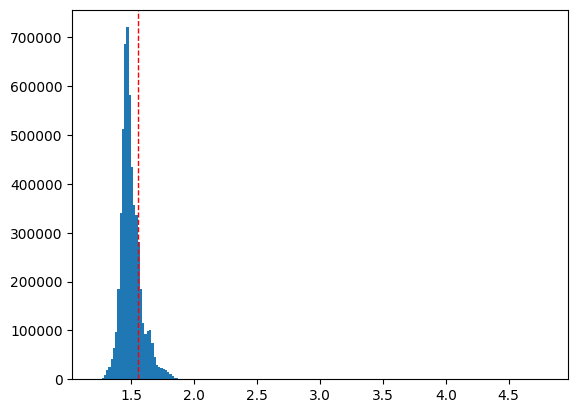

In [ ]:
plt.hist(np.array(Adj[Adj != 0]).flatten(), bins = 200)
plt.axvline(x=1.55, color='r', linestyle='--', linewidth=1)
plt.show()

In [ ]:
# Disminuimos cantidad de aristas, dejamos las que tienen un peso mayor a cierto umbral
mask = Adj> 1.55
Adj = np.where(mask , Adj, 0)
Adj

array([[0.        , 1.55963586, 1.58544428, ..., 0.        , 0.        ,
        1.5604913 ],
       [1.55963586, 0.        , 1.56071952, ..., 0.        , 0.        ,
        1.56058531],
       [1.58544428, 1.56071952, 0.        , ..., 0.        , 1.56290057,
        1.59634938],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 1.82599805,
        1.75269404],
       [0.        , 0.        , 1.56290057, ..., 1.82599805, 0.        ,
        1.83229008],
       [1.5604913 , 1.56058531, 1.59634938, ..., 1.75269404, 1.83229008,
        0.        ]])

In [ ]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [ ]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

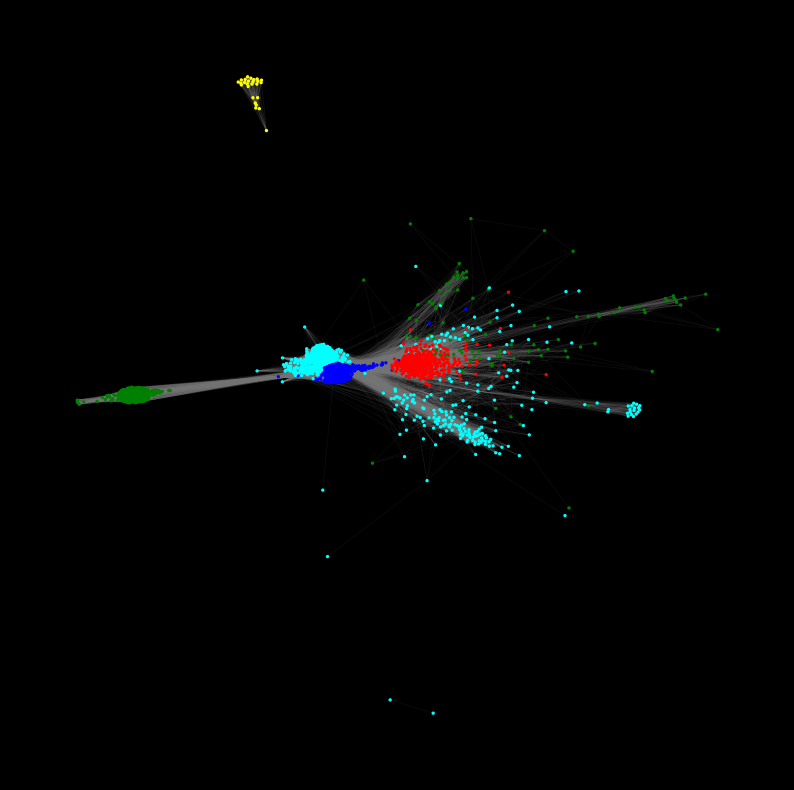

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

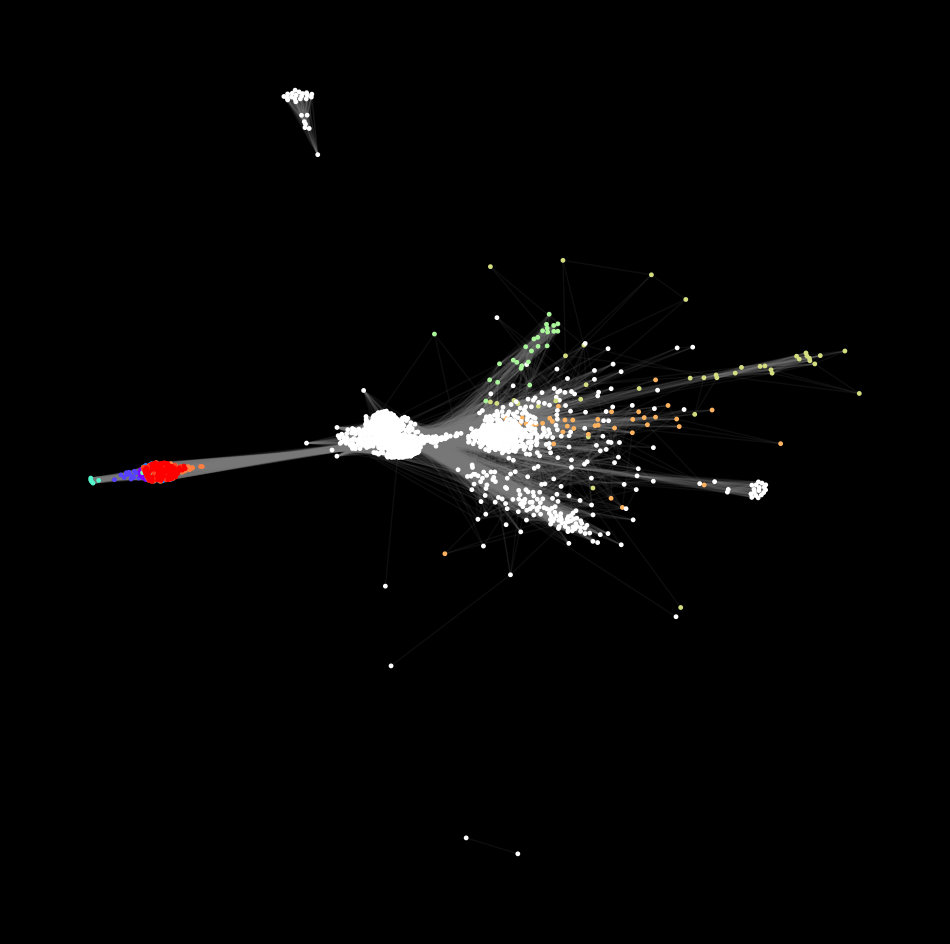

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches([12,12])
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_nodes(G, pos = pos,
                       node_size = 6,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : dict_af.get(origen[origen["id"] == x]["label"].values[0], "white")))
nx.draw_networkx_edges(G, pos = pos, edge_color = "gray", alpha = 0.1)
plt.show()

In [ ]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6898, Acc:
Epoch: 02, Loss: 1.5672, Acc:
Epoch: 03, Loss: 1.4985, Acc:
Epoch: 04, Loss: 1.4600, Acc:
Epoch: 05, Loss: 1.4375, Acc:
Epoch: 06, Loss: 1.4202, Acc:
Epoch: 07, Loss: 1.4076, Acc:
Epoch: 08, Loss: 1.3945, Acc:
Epoch: 09, Loss: 1.3748, Acc:
Epoch: 10, Loss: 1.3459, Acc:
Epoch: 11, Loss: 1.3033, Acc:
Epoch: 12, Loss: 1.2607, Acc:
Epoch: 13, Loss: 1.2241, Acc:
Epoch: 14, Loss: 1.1891, Acc:
Epoch: 15, Loss: 1.1789, Acc:
Epoch: 16, Loss: 1.1815, Acc:
Epoch: 17, Loss: 1.1692, Acc:
Epoch: 18, Loss: 1.1581, Acc:
Epoch: 19, Loss: 1.1569, Acc:
Epoch: 20, Loss: 1.1508, Acc:
Epoch: 21, Loss: 1.1494, Acc:
Epoch: 22, Loss: 1.1574, Acc:
Epoch: 23, Loss: 1.1422, Acc:
Epoch: 24, Loss: 1.1427, Acc:
Epoch: 25, Loss: 1.1496, Acc:
Epoch: 26, Loss: 1.1409, Acc:
Epoch: 27, Loss: 1.1429, Acc:
Epoch: 28, Loss: 1.1435, Acc:
Epoch: 29, Loss: 1.1431, Acc:
Epoch: 30, Loss: 1.1450, Acc:
Epoch: 31, Loss: 1.1396, Acc:
Epoch: 32, Loss: 1.1429, Acc:
Epoch: 33, Loss: 1.1358, Acc:
Epoch: 34,

ValueError: 'c' argument has 2361 elements, which is inconsistent with 'x' and 'y' with size 2306.

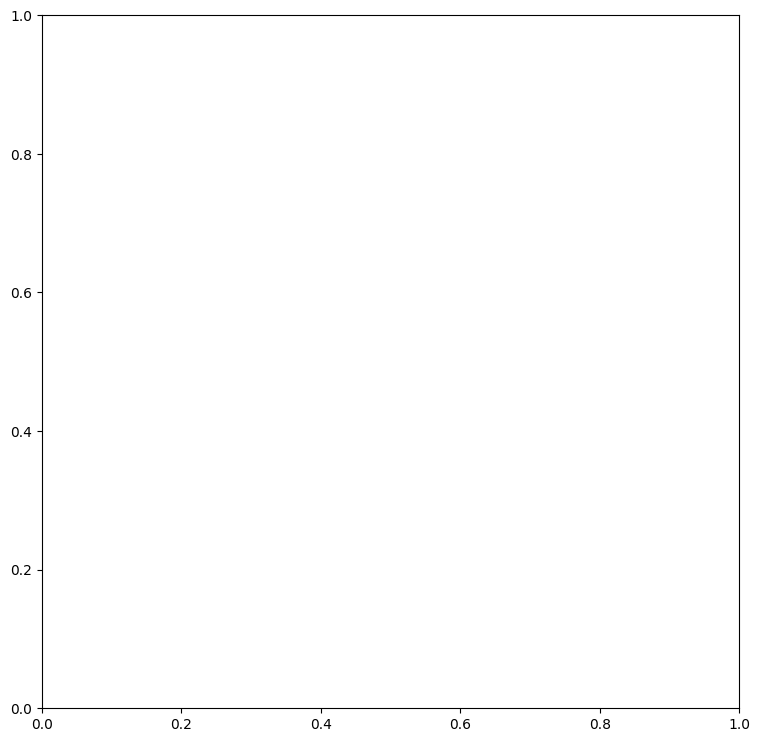

In [ ]:
# Node2vec con grafo pi
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec de grafo productos internos")

ValueError: 'c' argument has 2361 elements, which is inconsistent with 'x' and 'y' with size 2306.

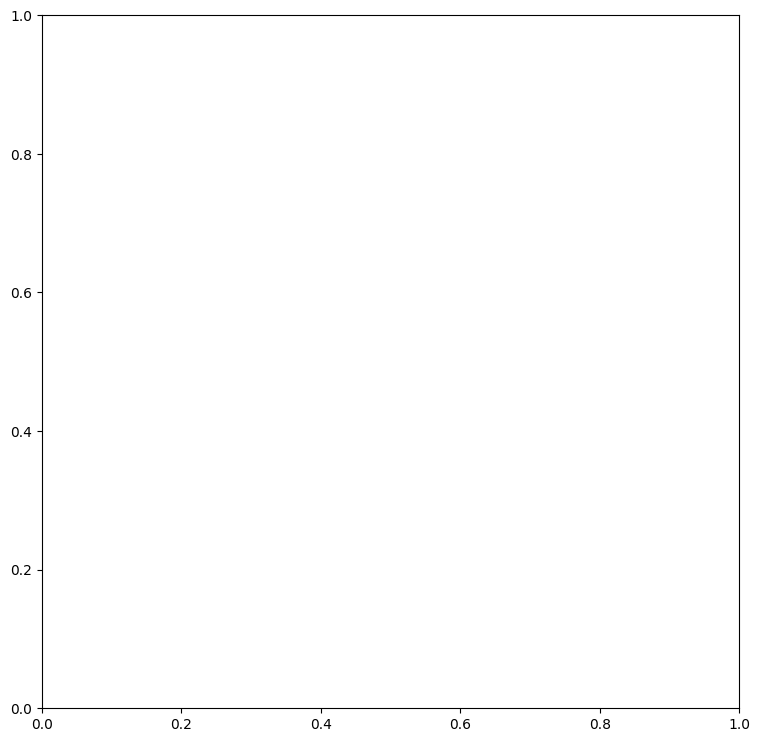

In [ ]:
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec de grafo productos internos")

In [ ]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

In [ ]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Africa", color='white')  # Cambiar el color del título a blanco
plt.show()

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

In [ ]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Oceania", color='white')  # Cambiar el color del título a blanco
plt.show()

In [ ]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Europa", color='white')  # Cambiar el color del título a blanco
plt.show()

# F2 con datos normalizados

In [ ]:
from scipy.spatial.distance import pdist, squareform

In [ ]:
# 1. Imputamos datos vacíos con la media de cada columna
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(df)

# 2. Normalizamos
df_norm = data_imputed.copy()
df_norm = normalize(df_norm, norm='l2', axis=1)
display(df_norm)

array([[0.00904505, 0.01809011, 0.00904505, ..., 0.        , 0.        ,
        0.01809011],
       [0.        , 0.        , 0.00900317, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.01841305, ..., 0.        , 0.        ,
        0.00920653],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.00907742,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.00925025,
        0.00925025],
       [0.        , 0.        , 0.0092183 , ..., 0.        , 0.        ,
        0.0092183 ]])

In [ ]:
distances = pdist(df_norm, metric='euclidean') #distancia euclidea

# Convierte el resultado en una matriz de distancias
distance_matrix = pd.DataFrame(squareform(distances), index=df.index, columns=df.index)

In [ ]:
distance_matrix

,1_C1_1_C1,2_C2_2_C2,3_C3_3_C3,4_C4_4_C4,5_C5_5_C5,6_C6_6_C6,7_C7_7_C7,8_C8_8_C8,9_C9_9_C9,10_C10_10_C10,...,2352_NAD15_2352_NAD15,2353_NAD54_2353_NAD54,2354_NAD55_2354_NAD55,2355_NAD56_2355_NAD56,2356_NAD57_2356_NAD57,2357_NAD59_2357_NAD59,2358_NAD64_2358_NAD64,2359_NAD93_2359_NAD93,2360_NAD96_2360_NAD96,2361_NAD98_2361_NAD98
1_C1_1_C1,0.000000,1.027389,1.030295,1.020064,1.021860,1.020565,1.029417,1.024968,1.028664,1.042668,...,1.045393,1.057036,1.052631,1.047852,1.039413,1.067109,1.041017,1.057675,1.058606,1.039143
2_C2_2_C2,1.027389,0.000000,1.035928,1.021223,1.023386,1.023454,1.026857,1.024567,1.023281,1.036328,...,1.050951,1.048536,1.045423,1.048961,1.037500,1.061307,1.041314,1.058986,1.050741,1.036607
3_C3_3_C3,1.030295,1.035928,0.000000,1.030998,1.028814,1.032849,1.041677,1.028332,1.027654,1.028827,...,1.036624,1.045296,1.043751,1.044196,1.037183,1.052370,1.041263,1.047742,1.049548,1.036708
4_C4_4_C4,1.020064,1.021223,1.030998,0.000000,1.017348,1.018515,1.016365,1.026290,1.028848,1.036453,...,1.055977,1.053922,1.054195,1.052036,1.039681,1.064706,1.042316,1.068045,1.058051,1.034661
5_C5_5_C5,1.021860,1.023386,1.028814,1.017348,0.000000,1.023338,1.019794,1.029886,1.033080,1.036719,...,1.043927,1.047970,1.056536,1.046540,1.038993,1.062348,1.045085,1.064550,1.056302,1.034404
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,1.067109,1.061307,1.052370,1.064706,1.062348,1.065939,1.073845,1.065902,1.048886,1.054693,...,0.968978,0.966415,0.986038,0.938407,0.983606,0.000000,0.970735,0.921662,0.958269,0.998425
2358_NAD64_2358_NAD64,1.041017,1.041314,1.041263,1.042316,1.045085,1.040151,1.049568,1.045927,1.035020,1.037553,...,0.974579,0.985309,0.965855,0.957161,0.943702,0.970735,0.000000,0.955282,0.952331,0.935163
2359_NAD93_2359_NAD93,1.057675,1.058986,1.047742,1.068045,1.064550,1.059603,1.072394,1.058547,1.040997,1.053310,...,0.951570,0.956292,0.961154,0.956618,0.974637,0.921662,0.955282,0.000000,0.963989,0.982308
2360_NAD96_2360_NAD96,1.058606,1.050741,1.049548,1.058051,1.056302,1.051631,1.061599,1.052846,1.041617,1.046060,...,0.975720,0.981755,0.969981,0.923738,0.924300,0.958269,0.952331,0.963989,0.000000,0.969951


In [ ]:
#calculamos la matriz de estadísticos f2
# f2(P1, P2) = 1/S * sum (p1_i - p2_i)^2
S = 20216
distancias = (1 / S) * (distance_matrix)**2

In [ ]:
distancias

,1_C1_1_C1,2_C2_2_C2,3_C3_3_C3,4_C4_4_C4,5_C5_5_C5,6_C6_6_C6,7_C7_7_C7,8_C8_8_C8,9_C9_9_C9,10_C10_10_C10,...,2352_NAD15_2352_NAD15,2353_NAD54_2353_NAD54,2354_NAD55_2354_NAD55,2355_NAD56_2355_NAD56,2356_NAD57_2356_NAD57,2357_NAD59_2357_NAD59,2358_NAD64_2358_NAD64,2359_NAD93_2359_NAD93,2360_NAD96_2360_NAD96,2361_NAD98_2361_NAD98
1_C1_1_C1,0.000000,0.000052,0.000053,0.000051,0.000052,0.000052,0.000052,0.000052,0.000052,0.000054,...,0.000054,0.000055,0.000055,0.000054,0.000053,0.000056,0.000054,0.000055,0.000055,0.000053
2_C2_2_C2,0.000052,0.000000,0.000053,0.000052,0.000052,0.000052,0.000052,0.000052,0.000052,0.000053,...,0.000055,0.000054,0.000054,0.000054,0.000053,0.000056,0.000054,0.000055,0.000055,0.000053
3_C3_3_C3,0.000053,0.000053,0.000000,0.000053,0.000052,0.000053,0.000054,0.000052,0.000052,0.000052,...,0.000053,0.000054,0.000054,0.000054,0.000053,0.000055,0.000054,0.000054,0.000054,0.000053
4_C4_4_C4,0.000051,0.000052,0.000053,0.000000,0.000051,0.000051,0.000051,0.000052,0.000052,0.000053,...,0.000055,0.000055,0.000055,0.000055,0.000053,0.000056,0.000054,0.000056,0.000055,0.000053
5_C5_5_C5,0.000052,0.000052,0.000052,0.000051,0.000000,0.000052,0.000051,0.000052,0.000053,0.000053,...,0.000054,0.000054,0.000055,0.000054,0.000053,0.000056,0.000054,0.000056,0.000055,0.000053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,0.000056,0.000056,0.000055,0.000056,0.000056,0.000056,0.000057,0.000056,0.000054,0.000055,...,0.000046,0.000046,0.000048,0.000044,0.000048,0.000000,0.000047,0.000042,0.000045,0.000049
2358_NAD64_2358_NAD64,0.000054,0.000054,0.000054,0.000054,0.000054,0.000054,0.000054,0.000054,0.000053,0.000053,...,0.000047,0.000048,0.000046,0.000045,0.000044,0.000047,0.000000,0.000045,0.000045,0.000043
2359_NAD93_2359_NAD93,0.000055,0.000055,0.000054,0.000056,0.000056,0.000056,0.000057,0.000055,0.000054,0.000055,...,0.000045,0.000045,0.000046,0.000045,0.000047,0.000042,0.000045,0.000000,0.000046,0.000048
2360_NAD96_2360_NAD96,0.000055,0.000055,0.000054,0.000055,0.000055,0.000055,0.000056,0.000055,0.000054,0.000054,...,0.000047,0.000048,0.000047,0.000042,0.000042,0.000045,0.000045,0.000046,0.000000,0.000047


In [ ]:
Adj = 1 / np.array(distancias) # para crear matriz de adyacencia invierto cada coordenada de la matriz de distancias
np.fill_diagonal(Adj, 0) # pongo 0 en diagonal
Adj = pd.DataFrame(Adj)
Adj

<ipython-input-110-9fe874bea876>:1: RuntimeWarning: divide by zero encountered in divide
  Adj = 1 / np.array(distancias) # para crear matriz de adyacencia invierto cada coordenada de la matriz de distancias


,0,1,2,3,4,5,6,7,8,9,...,2351,2352,2353,2354,2355,2356,2357,2358,2359,2360
0,0.000000,19152.512959,19044.613747,19428.547132,19360.331316,19409.494909,19077.100600,19243.069223,19105.063681,18595.312084,...,18498.463164,18093.209964,18244.957414,18411.773537,18711.937678,17753.246423,18654.324556,18071.340126,18039.593607,18721.661376
1,19152.512959,0.000000,18838.039817,19384.481228,19302.604183,19300.065418,19172.341198,19258.165121,19306.586915,18823.500905,...,18303.327312,18387.756570,18497.430361,18372.844693,18781.027807,17947.878634,18643.676795,18026.642885,18310.644655,18813.387358
2,19044.613747,18838.039817,0.000000,19018.654809,19099.491485,18950.529649,18630.691403,19117.403443,19142.616697,19099.004484,...,18812.754365,18501.920862,18556.730049,18540.916980,18792.481402,18254.002454,18645.529074,18415.641680,18352.316664,18809.713689
3,19428.547132,19384.481228,19018.654809,0.000000,19532.418043,19487.676601,19570.239252,19193.522163,19098.225443,18818.987125,...,18129.518210,18200.274798,18190.847930,18265.589195,18702.317135,17833.460462,18607.871783,17722.132007,18058.511195,18884.228616
4,19360.331316,19302.604183,19099.491485,19532.418043,0.000000,19304.423250,19438.832004,19059.741314,18942.071664,18809.329452,...,18550.478297,18407.625029,18110.348113,18457.964562,18727.068434,17912.725130,18509.387372,17838.706474,18118.372686,18893.615200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2356,17753.246423,17947.878634,18254.002454,17833.460462,17912.725130,17792.234790,17531.229531,17793.485745,18375.477855,18173.696636,...,21531.144423,21645.528197,20792.539505,22956.877366,20895.523489,0.000000,21453.282878,23798.628888,22015.097205,20279.827426
2357,18654.324556,18643.676795,18645.529074,18607.871783,18509.387372,18685.401955,18351.605569,18479.605624,18871.112306,18779.077743,...,21284.382228,20823.336235,21670.617070,22066.102109,22699.966928,21453.282878,0.000000,22152.978262,22290.471635,23116.402440
2358,18071.340126,18026.642885,18415.641680,17722.132007,17838.706474,18005.669656,17578.702868,18041.600904,18655.039428,18221.436728,...,22326.140289,22106.188614,21883.102775,22091.128401,21281.850664,23798.628888,22152.978262,0.000000,21754.585915,20950.771233
2359,18039.593607,18310.644655,18352.316664,18058.511195,18118.372686,18279.686763,17937.998550,18237.496834,18632.841297,18474.902973,...,21234.624130,20974.365860,21486.642594,23691.784332,23662.972398,22015.097205,22290.471635,21754.585915,0.000000,21487.982380


In [ ]:
Adj = Adj / 100000
Adj

,0,1,2,3,4,5,6,7,8,9,...,2351,2352,2353,2354,2355,2356,2357,2358,2359,2360
0,0.000000,0.191525,0.190446,0.194285,0.193603,0.194095,0.190771,0.192431,0.191051,0.185953,...,0.184985,0.180932,0.182450,0.184118,0.187119,0.177532,0.186543,0.180713,0.180396,0.187217
1,0.191525,0.000000,0.188380,0.193845,0.193026,0.193001,0.191723,0.192582,0.193066,0.188235,...,0.183033,0.183878,0.184974,0.183728,0.187810,0.179479,0.186437,0.180266,0.183106,0.188134
2,0.190446,0.188380,0.000000,0.190187,0.190995,0.189505,0.186307,0.191174,0.191426,0.190990,...,0.188128,0.185019,0.185567,0.185409,0.187925,0.182540,0.186455,0.184156,0.183523,0.188097
3,0.194285,0.193845,0.190187,0.000000,0.195324,0.194877,0.195702,0.191935,0.190982,0.188190,...,0.181295,0.182003,0.181908,0.182656,0.187023,0.178335,0.186079,0.177221,0.180585,0.188842
4,0.193603,0.193026,0.190995,0.195324,0.000000,0.193044,0.194388,0.190597,0.189421,0.188093,...,0.185505,0.184076,0.181103,0.184580,0.187271,0.179127,0.185094,0.178387,0.181184,0.188936
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2356,0.177532,0.179479,0.182540,0.178335,0.179127,0.177922,0.175312,0.177935,0.183755,0.181737,...,0.215311,0.216455,0.207925,0.229569,0.208955,0.000000,0.214533,0.237986,0.220151,0.202798
2357,0.186543,0.186437,0.186455,0.186079,0.185094,0.186854,0.183516,0.184796,0.188711,0.187791,...,0.212844,0.208233,0.216706,0.220661,0.227000,0.214533,0.000000,0.221530,0.222905,0.231164
2358,0.180713,0.180266,0.184156,0.177221,0.178387,0.180057,0.175787,0.180416,0.186550,0.182214,...,0.223261,0.221062,0.218831,0.220911,0.212819,0.237986,0.221530,0.000000,0.217546,0.209508
2359,0.180396,0.183106,0.183523,0.180585,0.181184,0.182797,0.179380,0.182375,0.186328,0.184749,...,0.212346,0.209744,0.214866,0.236918,0.236630,0.220151,0.222905,0.217546,0.000000,0.214880


In [ ]:
np.max(Adj)

0.5651154034637704

In [ ]:
np.mean(Adj)

0.18332655304745174

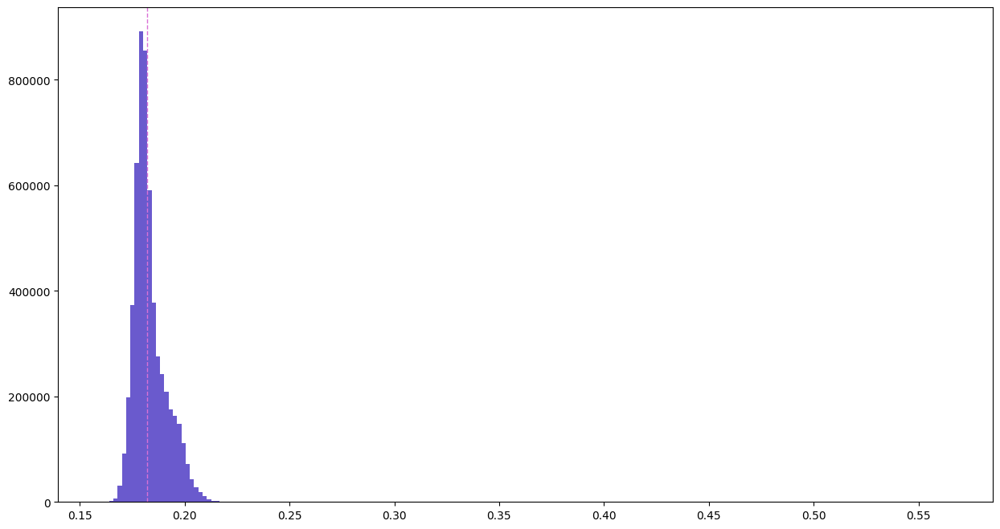

In [ ]:
plt.figure(figsize=(15, 8))
plt.hist(np.array(Adj[Adj != 0]).flatten(), bins = 200, color = "slateblue")
plt.axvline(x=0.182, color='orchid', linestyle='--', linewidth=1)
plt.show()

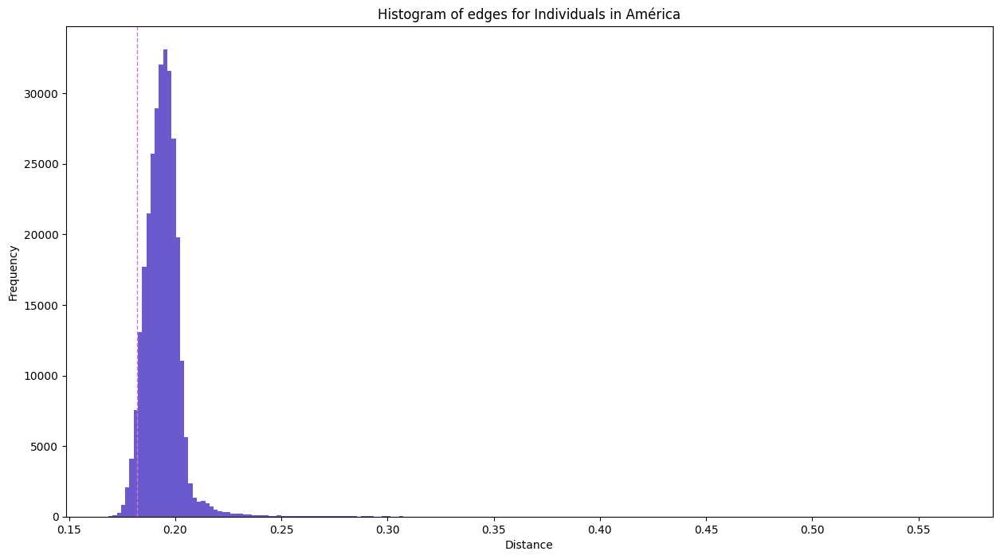

In [ ]:
Adj_array = Adj.to_numpy()

Adj_america = Adj_array[np.ix_(indices_america, indices_america)]

distances_america = np.array(Adj_america[Adj_america != 0]).flatten()

plt.figure(figsize=(15, 8))
plt.hist(distances_america, bins=200, color ="slateblue")
plt.axvline(x=0.182, color='orchid', linestyle='--', linewidth=1)
plt.title('Histogram of edges for Individuals in América')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

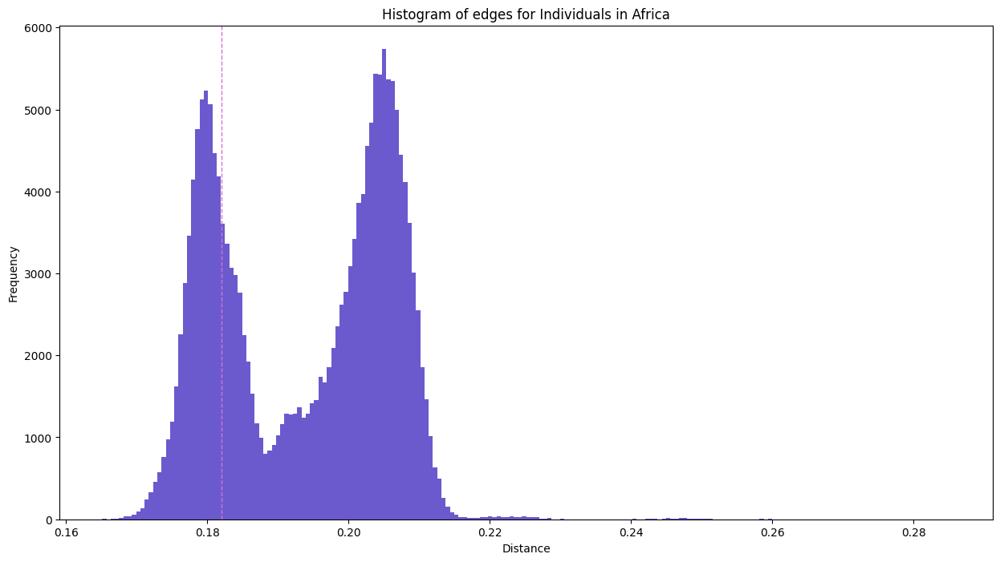

In [ ]:
Adj_array = Adj.to_numpy()

Adj_africa = Adj_array[np.ix_(indices_africa, indices_africa)]

distances_africa = np.array(Adj_africa[Adj_africa != 0]).flatten()

plt.figure(figsize=(15, 8))
plt.hist(distances_africa, bins=200, color ="slateblue")
plt.axvline(x=0.182, color='orchid', linestyle='--', linewidth=1)
plt.title('Histogram of edges for Individuals in Africa')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

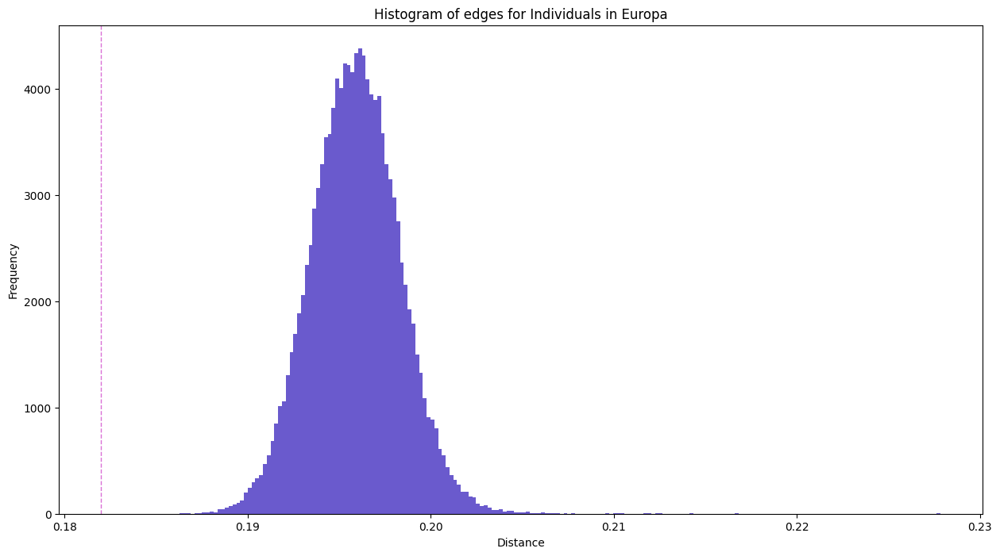

In [ ]:
Adj_array = Adj.to_numpy()

Adj_europa = Adj_array[np.ix_(indices_europa, indices_europa)]

distances_europa = np.array(Adj_europa[Adj_europa != 0]).flatten()
plt.figure(figsize=(15, 8))
plt.hist(distances_europa, bins=200, color ="slateblue")
plt.axvline(x=0.182, color='orchid', linestyle='--', linewidth=1)
plt.title('Histogram of edges for Individuals in Europa')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

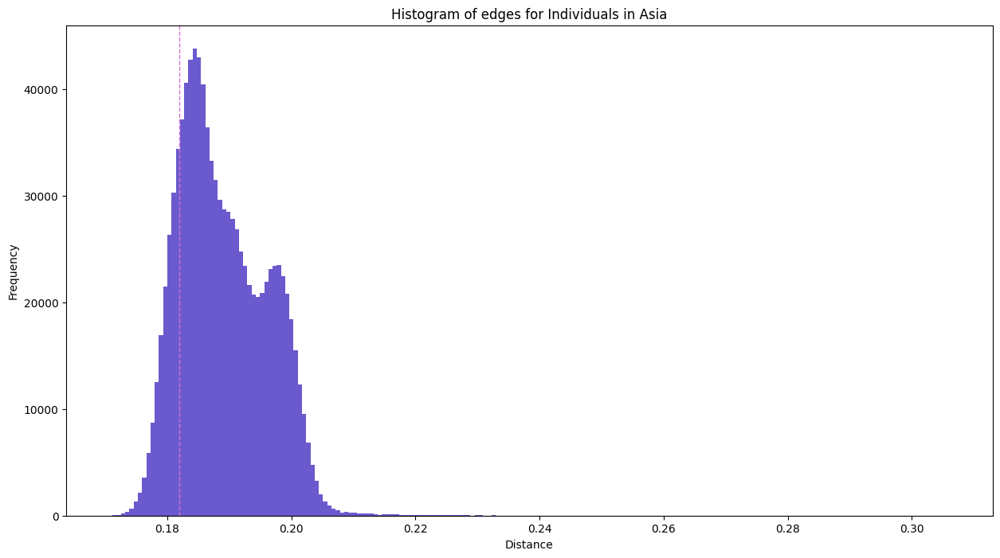

In [ ]:
Adj_array = Adj.to_numpy()

Adj_asia = Adj_array[np.ix_(indices_asia, indices_asia)]

distances_asia = np.array(Adj_asia[Adj_asia != 0]).flatten()
plt.figure(figsize=(15, 8))
plt.hist(distances_asia, bins=200, color ="slateblue")
plt.axvline(x=0.182, color='orchid', linestyle='--', linewidth=1)
plt.title('Histogram of edges for Individuals in Asia')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

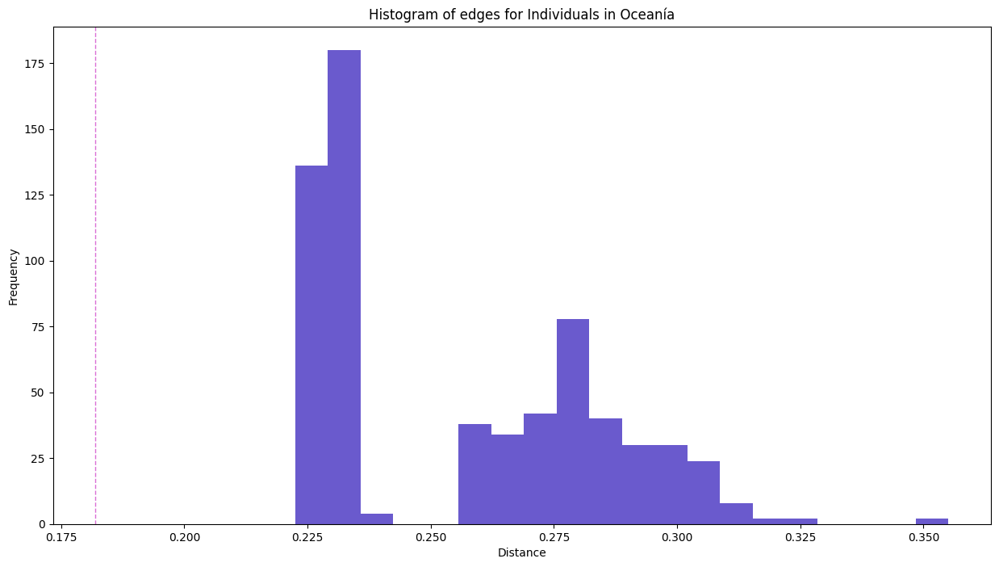

In [ ]:
Adj_array = Adj.to_numpy()

Adj_oceania = Adj_array[np.ix_(indices_oceania, indices_oceania)]

distances_oceania = np.array(Adj_oceania[Adj_oceania != 0]).flatten()
plt.figure(figsize=(15, 8))
plt.hist(distances_oceania, bins=20, color ="slateblue")
plt.axvline(x=0.182, color='orchid', linestyle='--', linewidth=1)
plt.title('Histogram of edges for Individuals in Oceanía')
plt.xlabel('Distance')
plt.ylabel('Frequency')
plt.show()

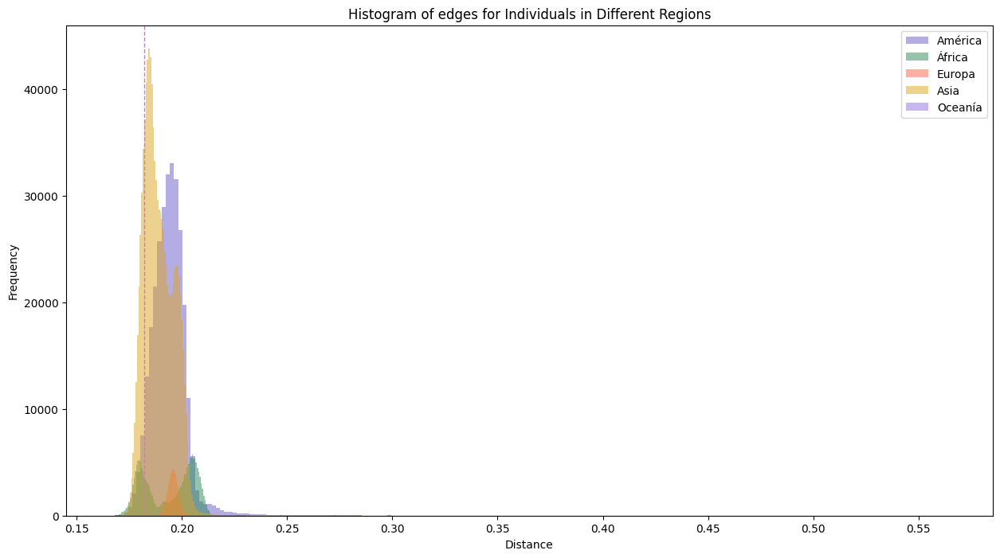

In [ ]:
# Definir los índices y los colores para cada región
indices_regiones = {
    'América': indices_america,
    'África': indices_africa,
    'Europa': indices_europa,
    'Asia': indices_asia,
    'Oceanía': indices_oceania
}

colors = {
    'América': 'slateblue',
    'África': 'seagreen',
    'Europa': 'tomato',
    'Asia': 'goldenrod',
    'Oceanía': 'mediumpurple'
}

# Crear una figura
plt.figure(figsize=(15, 8))

# Plotear los histogramas en la misma figura
for region, indices in indices_regiones.items():
    Adj_region = Adj_array[np.ix_(indices, indices)]
    distances_region = np.array(Adj_region[Adj_region != 0]).flatten()
    plt.hist(distances_region, bins=200, color=colors[region], alpha=0.5, label=region)

# Añadir la línea vertical
plt.axvline(x=0.182, color='orchid', linestyle='--', linewidth=1)

# Añadir título y etiquetas
plt.title('Histogram of edges for Individuals in Different Regions')
plt.xlabel('Distance')
plt.ylabel('Frequency')

# Añadir la leyenda
plt.legend()

# Mostrar el gráfico
plt.show()

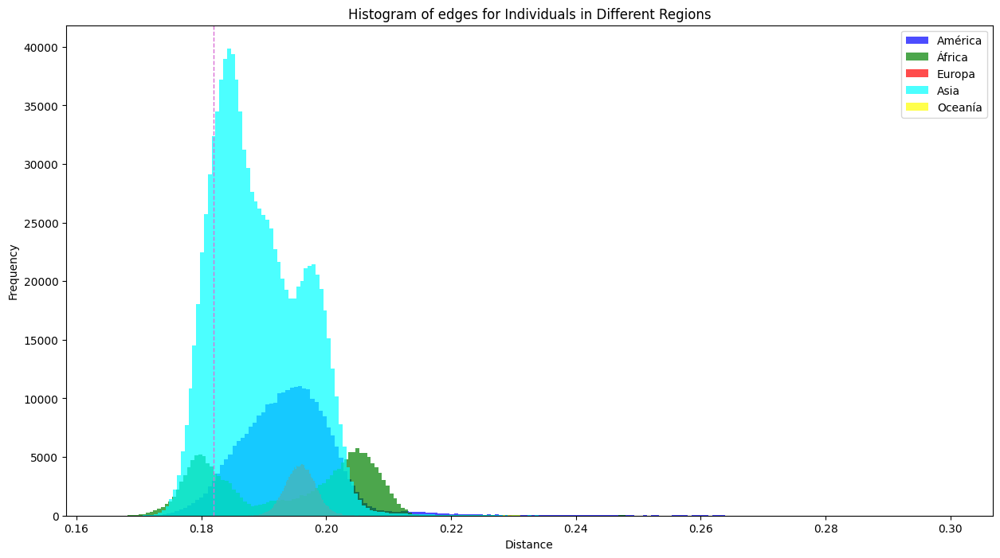

In [ ]:
# Definir los índices y los colores para cada región
indices_regiones = {
    'América': indices_america,
    'África': indices_africa,
    'Europa': indices_europa,
    'Asia': indices_asia,
    'Oceanía': indices_oceania
}

colors = {
    'América': 'blue',
    'África': 'green',
    'Europa': 'red',
    'Asia': 'cyan',
    'Oceanía': 'yellow'
}

# Crear una figura
plt.figure(figsize=(15, 8))

# Plotear los histogramas en la misma figura
for region, indices in indices_regiones.items():
    Adj_region = Adj_array[np.ix_(indices, indices)]
    distances_region = np.array(Adj_region[Adj_region != 0]).flatten()
    # Filtrar las distancias mayores a 0.3
    distances_region = distances_region[distances_region <= 0.3]
    plt.hist(distances_region, bins=200, color=colors[region], alpha=0.7, label=region)

# Añadir la línea vertical
plt.axvline(x=0.182, color='orchid', linestyle='--', linewidth=1)

# Añadir título y etiquetas
plt.title('Histogram of edges for Individuals in Different Regions')
plt.xlabel('Distance')
plt.ylabel('Frequency')

# Añadir la leyenda
plt.legend()

# Mostrar el gráfico
plt.show()

In [ ]:
continent_counts = origen.groupby('Continente').size()

# Mostrar los resultados
print(continent_counts)

Continente
Africa      428
America     552
Asia       1002
Europa      353
Oceania      26
dtype: int64


Submuestreo?

In [ ]:
labels_origen = origen['label'].unique().tolist()
labels_origen
# Mostrar la lista de labels
#print(labels_origen)

['CHARRUA',
 'BiakaPygmy',
 'MbutiPygmy',
 'Mandenka',
 'Yoruba',
 'BantuKenya',
 'San',
 'BantuSouthAfrica',
 'Mozabite',
 'Bedouin',
 'Druze',
 'Palestinian',
 'Brahui',
 'Balochi',
 'Hazara',
 'Makrani',
 'Sindhi',
 'Pathan',
 'Kalash',
 'Burusho',
 'Han',
 'Han-NChina',
 'Tujia',
 'Yi',
 'Miao',
 'Daur',
 'Mongola',
 'Hezhen',
 'Xibo',
 'Uygur',
 'Oroqen',
 'Dai',
 'Lahu',
 'She',
 'Tu',
 'Yakut',
 'Japanese',
 'Cambodian',
 'Papuan',
 'Melanesian',
 'French',
 'Basque',
 'Sardinian',
 'Italian',
 'Orcadian',
 'Naxi',
 'Tuscan',
 'Adygei',
 'Russian',
 'Maya1',
 'Piapoco',
 'Karitiana',
 'Surui',
 'Pima',
 'Zapotec1',
 'Mixe',
 'Cree',
 'Cabecar',
 'Kaqchikel',
 'Mixtec',
 'Chono',
 'Chipewyan',
 'Quechua',
 'Chilote',
 'Aymara',
 'Diaguita',
 'Hulliche',
 'Ojibwa',
 'Inga',
 'Wayuu',
 'Jamamadi',
 'Parakana',
 'Guaymi',
 'Guarani',
 'Kaingang',
 'Bribri',
 'Ticuna',
 'Maleku',
 'Huetar',
 'Yaghan',
 'Teribe',
 'Arhuaco',
 'Waunana',
 'Kogi',
 'Yaqui',
 'Palikur',
 'Embera',
 'Chor

In [ ]:
# Disminuimos cantidad de aristas, dejamos las que tienen un peso mayor a cierto umbral
mask = Adj> 0.182
Adj = np.where(mask , Adj, 0)
Adj

array([[0.        , 0.19152513, 0.19044614, ..., 0.        , 0.        ,
        0.18721661],
       [0.19152513, 0.        , 0.1883804 , ..., 0.        , 0.18310645,
        0.18813387],
       [0.19044614, 0.1883804 , 0.        , ..., 0.18415642, 0.18352317,
        0.18809714],
       ...,
       [0.        , 0.        , 0.18415642, ..., 0.        , 0.21754586,
        0.20950771],
       [0.        , 0.18310645, 0.18352317, ..., 0.21754586, 0.        ,
        0.21487982],
       [0.18721661, 0.18813387, 0.18809714, ..., 0.20950771, 0.21487982,
        0.        ]])

In [ ]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [ ]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

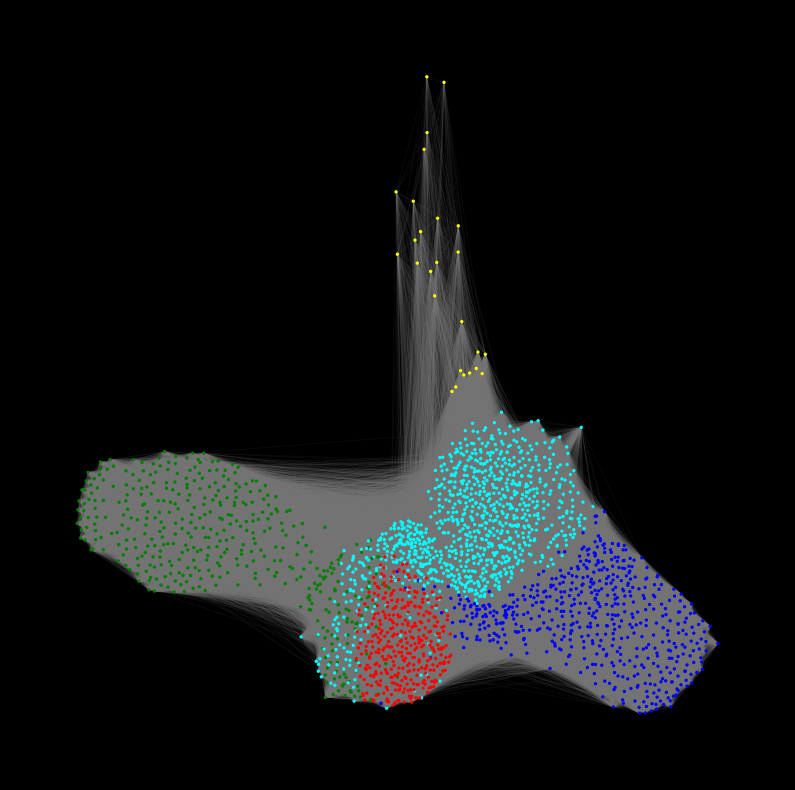

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

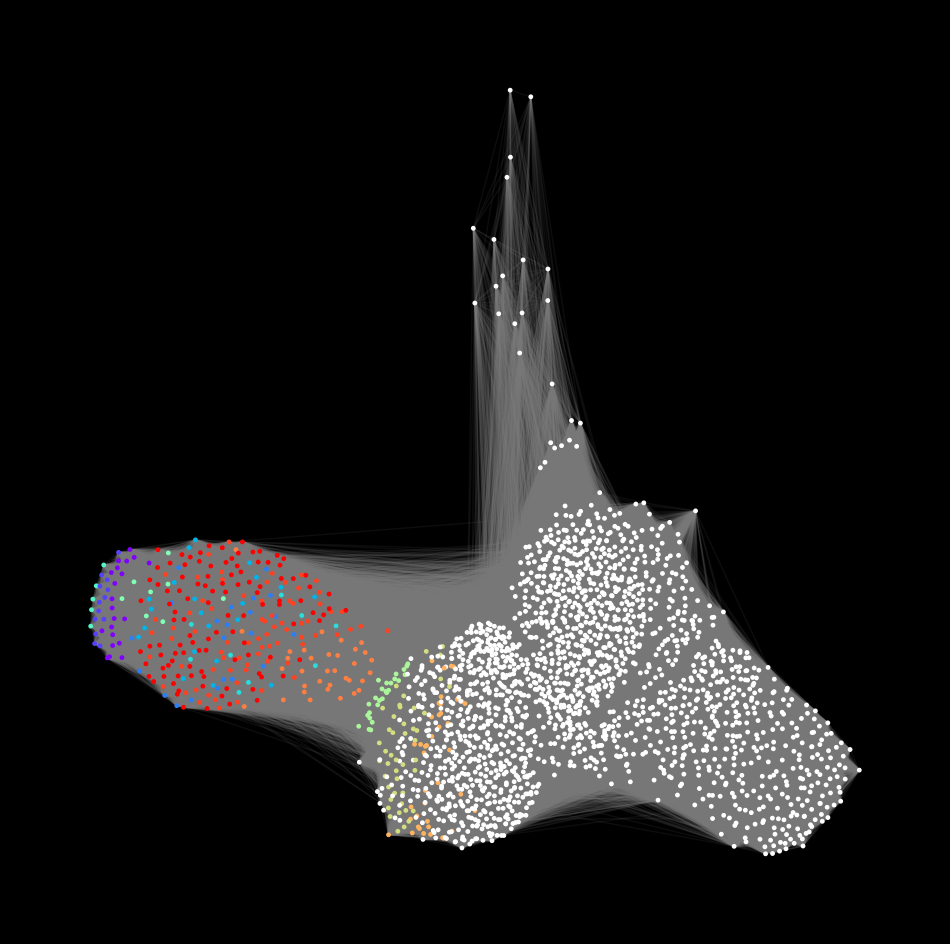

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches([12,12])
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_nodes(G, pos = pos,
                       node_size = 6,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : dict_af.get(origen[origen["id"] == x]["label"].values[0], "white")))
nx.draw_networkx_edges(G, pos = pos, edge_color = "gray", alpha = 0.1)
plt.show()

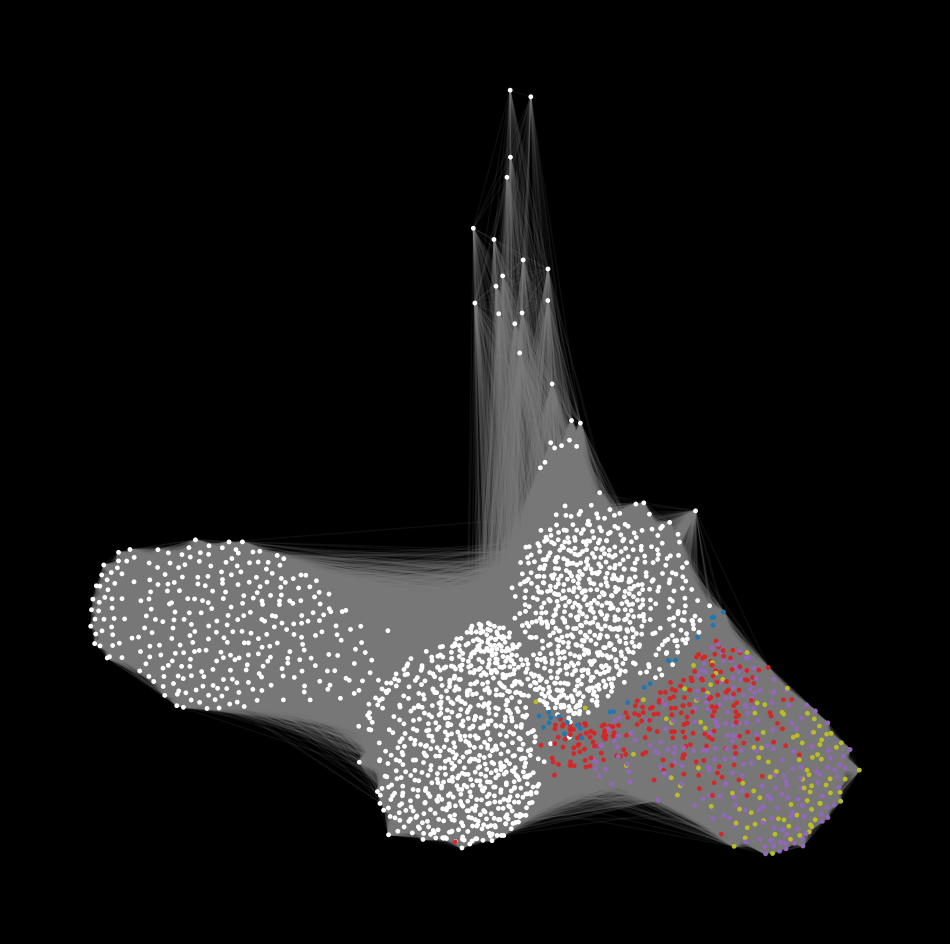

In [ ]:
origen['Region'] = origen['label'].map(region_dict)
fig, ax = plt.subplots(1, 1)
fig.set_size_inches([12, 12])
fig.set_facecolor("black")
ax.set_facecolor("black")

# Obtener los colores para los nodos, usando 'white' si no se encuentra la región
node_colors = origen['Region'].map(region_paint).fillna('white').tolist()

# Dibujar los nodos y aristas
nx.draw_networkx_nodes(G, pos=pos, node_size=6, node_color=node_colors)
nx.draw_networkx_edges(G, pos=pos, edge_color="gray", alpha=0.1)

plt.show()

In [ ]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6937, Acc:
Epoch: 02, Loss: 1.5662, Acc:
Epoch: 03, Loss: 1.4971, Acc:
Epoch: 04, Loss: 1.4587, Acc:
Epoch: 05, Loss: 1.4355, Acc:
Epoch: 06, Loss: 1.4214, Acc:
Epoch: 07, Loss: 1.4117, Acc:
Epoch: 08, Loss: 1.4053, Acc:
Epoch: 09, Loss: 1.4006, Acc:
Epoch: 10, Loss: 1.3965, Acc:
Epoch: 11, Loss: 1.3924, Acc:
Epoch: 12, Loss: 1.3863, Acc:
Epoch: 13, Loss: 1.3767, Acc:
Epoch: 14, Loss: 1.3623, Acc:
Epoch: 15, Loss: 1.3469, Acc:
Epoch: 16, Loss: 1.3350, Acc:
Epoch: 17, Loss: 1.3246, Acc:
Epoch: 18, Loss: 1.3182, Acc:
Epoch: 19, Loss: 1.3130, Acc:
Epoch: 20, Loss: 1.3072, Acc:
Epoch: 21, Loss: 1.3031, Acc:
Epoch: 22, Loss: 1.2991, Acc:
Epoch: 23, Loss: 1.2968, Acc:
Epoch: 24, Loss: 1.2948, Acc:
Epoch: 25, Loss: 1.2925, Acc:
Epoch: 26, Loss: 1.2916, Acc:
Epoch: 27, Loss: 1.2904, Acc:
Epoch: 28, Loss: 1.2900, Acc:
Epoch: 29, Loss: 1.2904, Acc:
Epoch: 30, Loss: 1.2894, Acc:
Epoch: 31, Loss: 1.2893, Acc:
Epoch: 32, Loss: 1.2889, Acc:
Epoch: 33, Loss: 1.2890, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec de grafo productos internos')

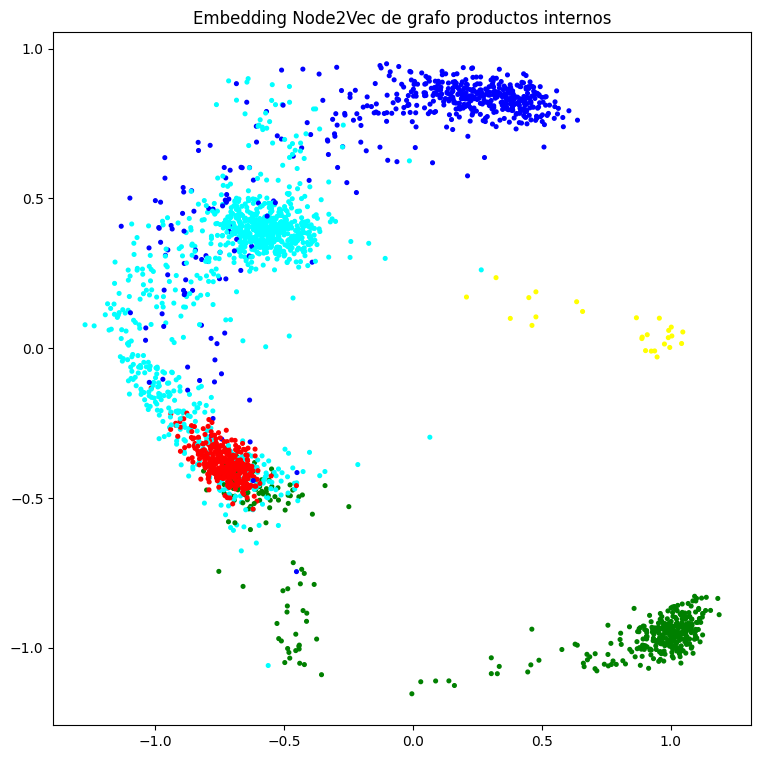

In [ ]:
# Node2vec con grafo pi
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec de grafo productos internos")

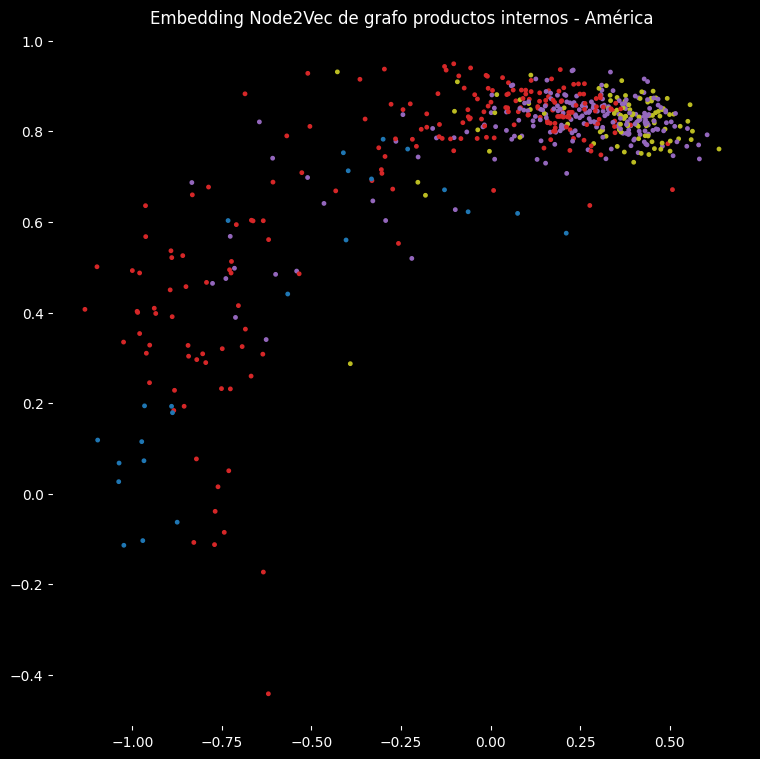

In [ ]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

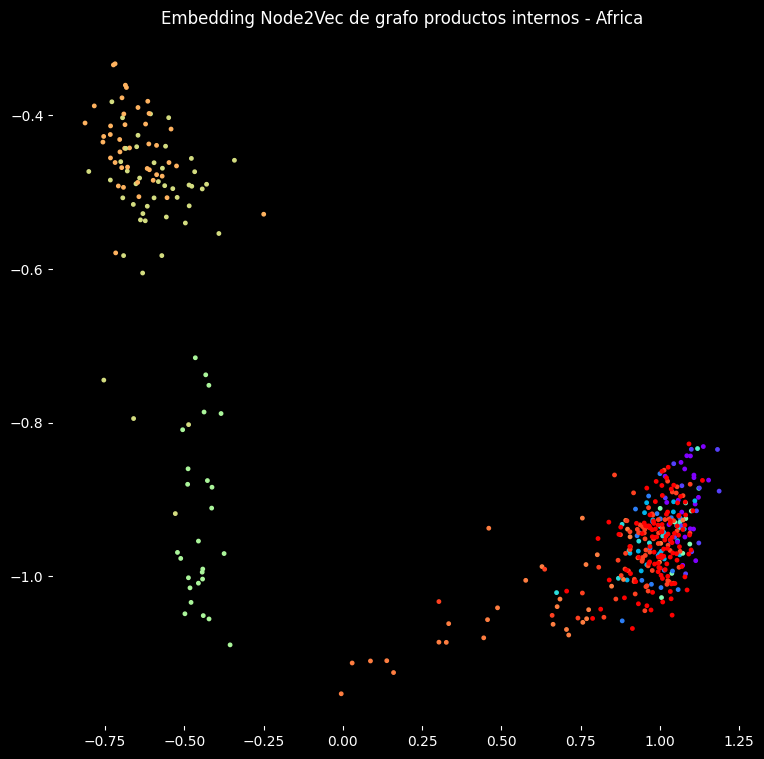

In [ ]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Africa", color='white')  # Cambiar el color del título a blanco
plt.show()

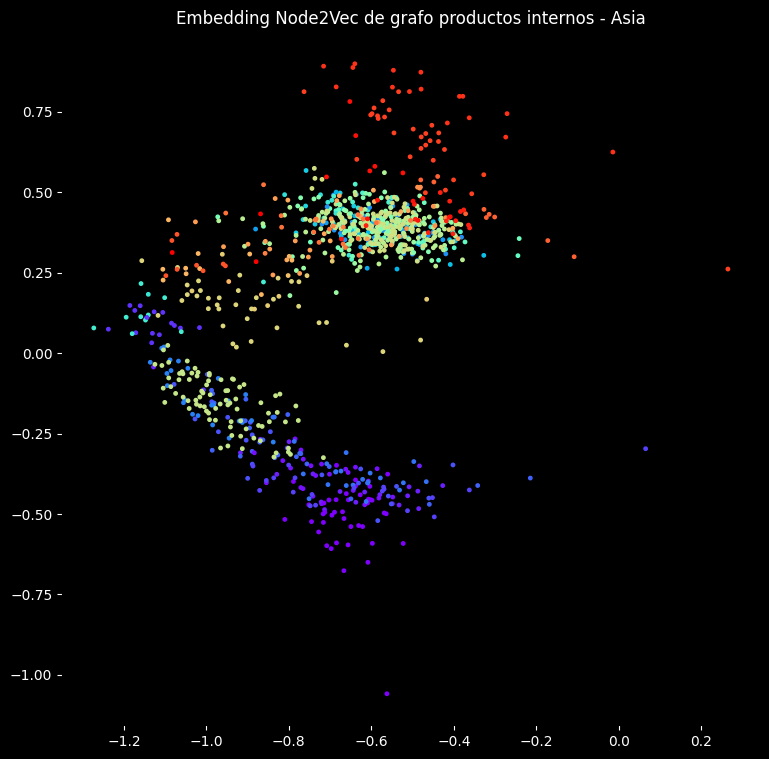

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

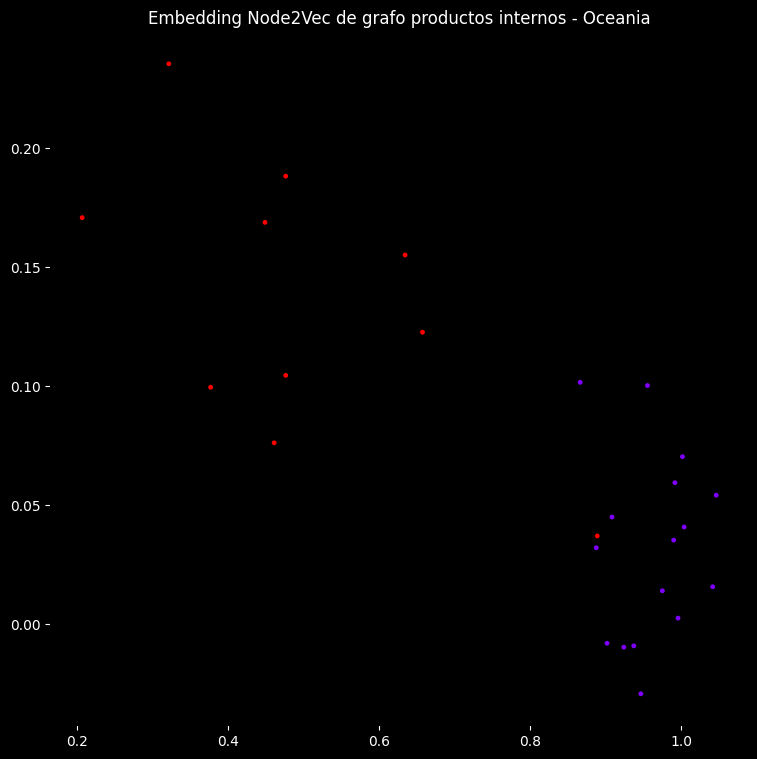

In [ ]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Oceania", color='white')  # Cambiar el color del título a blanco
plt.show()

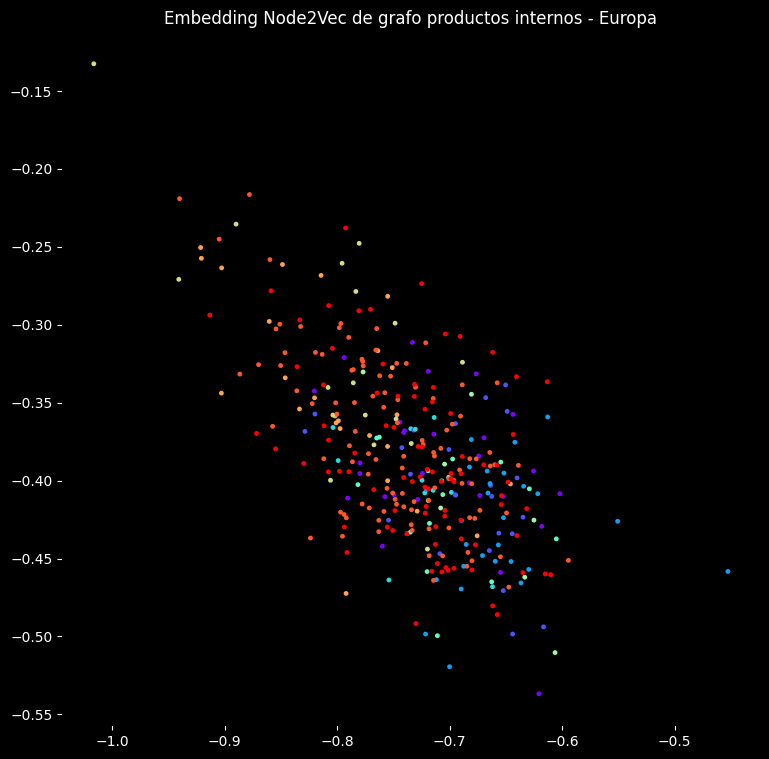

In [ ]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Europa", color='white')  # Cambiar el color del título a blanco
plt.show()

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6826
Epoch: 02, Loss: 1.5591
Epoch: 03, Loss: 1.4919
Epoch: 04, Loss: 1.4538
Epoch: 05, Loss: 1.4310
Epoch: 06, Loss: 1.4171
Epoch: 07, Loss: 1.4074
Epoch: 08, Loss: 1.3987
Epoch: 09, Loss: 1.3895
Epoch: 10, Loss: 1.3776
Epoch: 11, Loss: 1.3618
Epoch: 12, Loss: 1.3455
Epoch: 13, Loss: 1.3283
Epoch: 14, Loss: 1.3142
Epoch: 15, Loss: 1.3010
Epoch: 16, Loss: 1.2938
Epoch: 17, Loss: 1.2860
Epoch: 18, Loss: 1.2785
Epoch: 19, Loss: 1.2745
Epoch: 20, Loss: 1.2689
Epoch: 21, Loss: 1.2649
Epoch: 22, Loss: 1.2632
Epoch: 23, Loss: 1.2600
Epoch: 24, Loss: 1.2580
Epoch: 25, Loss: 1.2592
Epoch: 26, Loss: 1.2589
Epoch: 27, Loss: 1.2566
Epoch: 28, Loss: 1.2568
Epoch: 29, Loss: 1.2577
Epoch: 30, Loss: 1.2568
Epoch: 31, Loss: 1.2566
Epoch: 32, Loss: 1.2566
Epoch: 33, Loss: 1.2563
Epoch: 34, Loss: 1.2575
Epoch: 35, Loss: 1.2547
Epoch: 36, Loss: 1.2560
Epoch: 37, Loss: 1.2564
Epoch: 38, Loss: 1.2566
Epoch: 39, Loss: 1.2570
Epoch: 40, Loss: 1.2562
Epoch: 41, Loss: 1.2561
Epoch: 42, Loss:

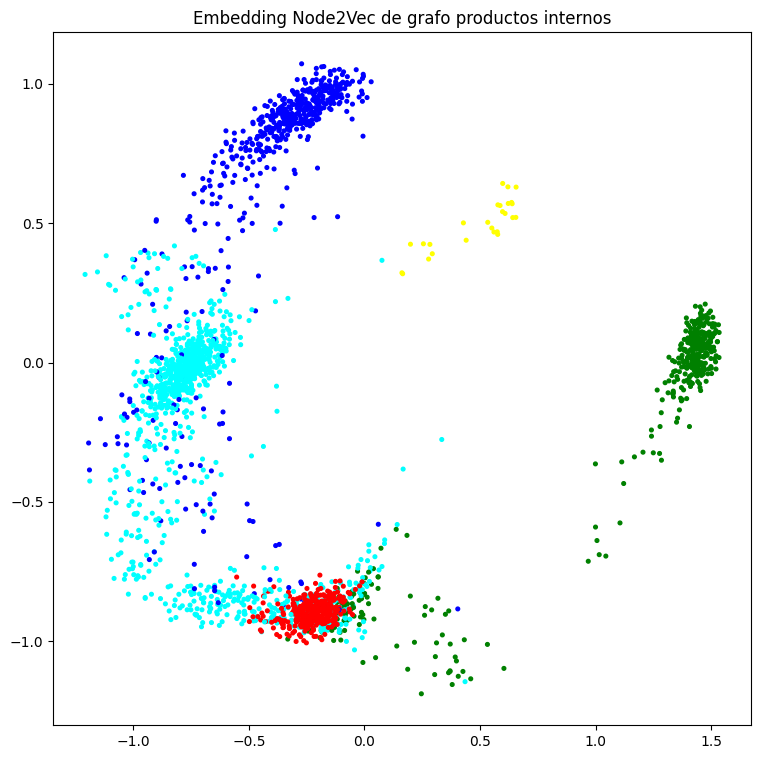

In [ ]:
# Define los hiperparámetros
embedding_dim = 2
walk_length = 25
context_size = 10
walks_per_node = 10
num_negative_samples = 1
p = 0.5
q = 2.0
sparse = True
lr = 0.01
epochs = 100

# Crear el modelo Node2Vec
model = Node2Vec(pyg_graph.edge_index, embedding_dim=embedding_dim, walk_length=walk_length,
                 context_size=context_size, walks_per_node=walks_per_node,
                 num_negative_samples=num_negative_samples, p=p, q=q, sparse=sparse)

optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=lr)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True, num_workers=num_workers)

data = pyg_graph

def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, epochs + 1):
    loss = train()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint.get(x)), s=7)

plt.title("Embedding Node2Vec de grafo productos internos")
plt.show()

In [ ]:
model2 = Node2Vec(pyg_graph.edge_index, embedding_dim=10, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer2 = torch.optim.SparseAdam(list(model2.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader2 = model2.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train2():
    model2.train()
    total_loss = 0
    for pos_rw, neg_rw in loader2:
        optimizer2.zero_grad()
        loss = model2.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer2.step()
        total_loss += loss.item()
    return total_loss / len(loader2)

for epoch in range(1, 101):
    loss = train2()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 2.6047, Acc:
Epoch: 02, Loss: 2.1598, Acc:
Epoch: 03, Loss: 1.8719, Acc:
Epoch: 04, Loss: 1.6987, Acc:
Epoch: 05, Loss: 1.5943, Acc:
Epoch: 06, Loss: 1.5279, Acc:
Epoch: 07, Loss: 1.4865, Acc:
Epoch: 08, Loss: 1.4575, Acc:
Epoch: 09, Loss: 1.4358, Acc:
Epoch: 10, Loss: 1.4182, Acc:
Epoch: 11, Loss: 1.4017, Acc:
Epoch: 12, Loss: 1.3856, Acc:
Epoch: 13, Loss: 1.3733, Acc:
Epoch: 14, Loss: 1.3641, Acc:
Epoch: 15, Loss: 1.3596, Acc:
Epoch: 16, Loss: 1.3561, Acc:
Epoch: 17, Loss: 1.3532, Acc:
Epoch: 18, Loss: 1.3511, Acc:
Epoch: 19, Loss: 1.3485, Acc:
Epoch: 20, Loss: 1.3481, Acc:
Epoch: 21, Loss: 1.3460, Acc:
Epoch: 22, Loss: 1.3447, Acc:
Epoch: 23, Loss: 1.3433, Acc:
Epoch: 24, Loss: 1.3417, Acc:
Epoch: 25, Loss: 1.3399, Acc:
Epoch: 26, Loss: 1.3396, Acc:
Epoch: 27, Loss: 1.3379, Acc:
Epoch: 28, Loss: 1.3375, Acc:
Epoch: 29, Loss: 1.3366, Acc:
Epoch: 30, Loss: 1.3361, Acc:
Epoch: 31, Loss: 1.3359, Acc:
Epoch: 32, Loss: 1.3359, Acc:
Epoch: 33, Loss: 1.3353, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec dim=100 + Tsne de grafo F2')

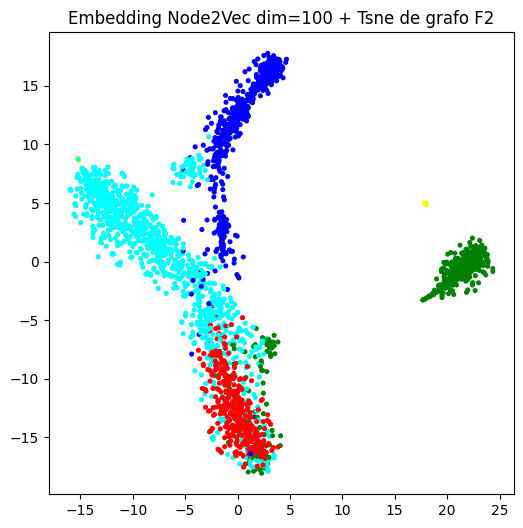

In [ ]:
model2.eval()
z2 = model2(torch.arange(data.num_nodes, device=device)).detach().numpy()

tsne = openTSNE.TSNE(
    perplexity=200,
    metric="euclidean",
    n_jobs=8,
    random_state=42,
    verbose=False,
)
tsne_nod2vec = tsne.fit(z2)
fig,ax1 = plt.subplots(1,1,figsize=(6, 6))
ax1.scatter(tsne_nod2vec[:,0],tsne_nod2vec[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec dim=100 + Tsne de grafo F2")

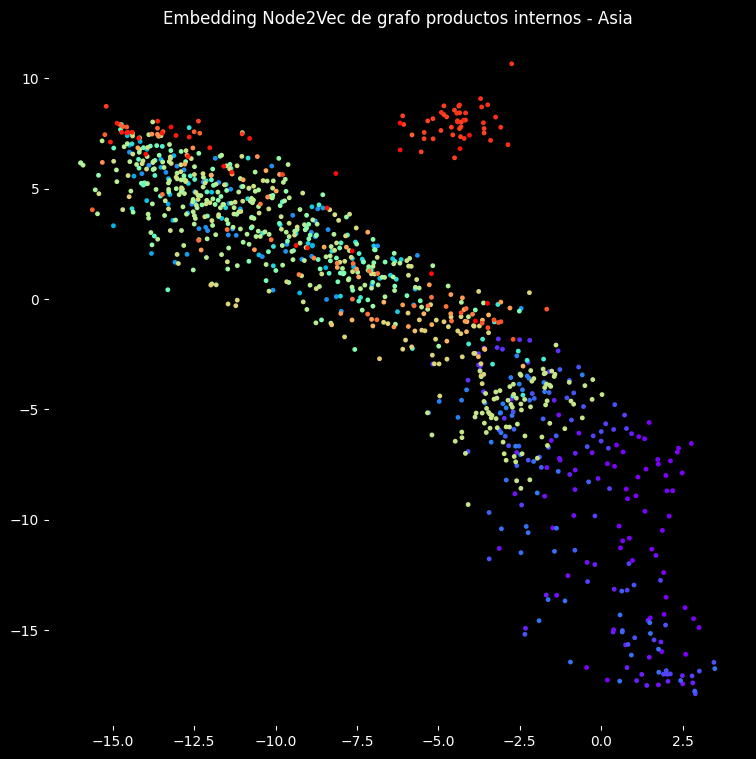

In [ ]:
tsne_asia = tsne_nod2vec[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(tsne_asia[:, 0], tsne_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

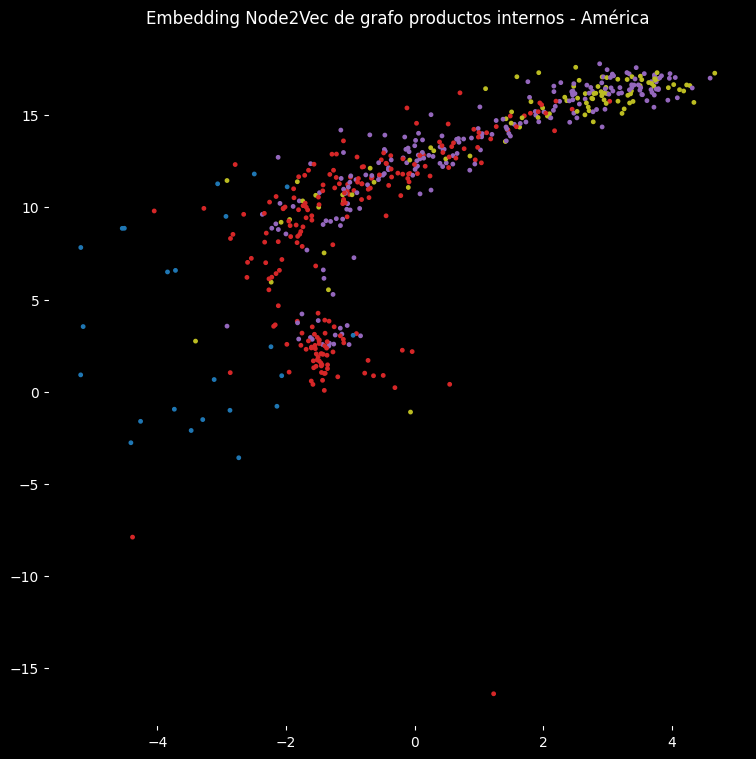

In [ ]:
tsne_america = tsne_nod2vec[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(tsne_america[:, 0], tsne_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

# F2 con datos estandarizados y normalizados

In [ ]:
# 1. Imputamos datos vacíos con la media de cada columna
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(df)

# 2. Estandarizamos los datos
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_imputed)

# 3. Normalizamos
df_norm = data_scaled.copy()
df_norm = normalize(df_norm, norm='l2', axis=1)
display(df_norm)

array([[ 0.01862001,  0.02716563,  0.00195152, ..., -0.00312865,
        -0.00388867,  0.00966709],
       [-0.00238118, -0.00341791,  0.0019554 , ..., -0.00313487,
        -0.0038964 , -0.00945094],
       [-0.00246211, -0.00353408,  0.01220892, ..., -0.00324141,
        -0.00402883,  0.00012168],
       ...,
       [-0.00246605, -0.00353974, -0.00817828, ..., -0.0032466 ,
         0.01007325, -0.0097878 ],
       [-0.00250628, -0.00359748, -0.00831169, ..., -0.00329956,
         0.01023758,  0.00012386],
       [-0.00249015, -0.00357433,  0.00204489, ..., -0.00327833,
        -0.00407472,  0.00012307]])

In [ ]:
from scipy.spatial.distance import pdist, squareform

In [ ]:
distances = pdist(df_norm, metric='euclidean') #distancia euclidea

# Convierte el resultado en una matriz de distancias
distance_matrix = pd.DataFrame(squareform(distances), index=df.index, columns=df.index)

In [ ]:
distance_matrix

,1_C1_1_C1,2_C2_2_C2,3_C3_3_C3,4_C4_4_C4,5_C5_5_C5,6_C6_6_C6,7_C7_7_C7,8_C8_8_C8,9_C9_9_C9,10_C10_10_C10,...,2352_NAD15_2352_NAD15,2353_NAD54_2353_NAD54,2354_NAD55_2354_NAD55,2355_NAD56_2355_NAD56,2356_NAD57_2356_NAD57,2357_NAD59_2357_NAD59,2358_NAD64_2358_NAD64,2359_NAD93_2359_NAD93,2360_NAD96_2360_NAD96,2361_NAD98_2361_NAD98
1_C1_1_C1,0.000000,1.393311,1.396019,1.388974,1.388249,1.384349,1.392283,1.388631,1.399883,1.416064,...,1.415157,1.424912,1.417253,1.419309,1.412415,1.433868,1.410997,1.428449,1.425879,1.408309
2_C2_2_C2,1.393311,0.000000,1.410140,1.387515,1.388866,1.391069,1.392372,1.393027,1.392969,1.404642,...,1.421999,1.418934,1.411063,1.423040,1.405964,1.425151,1.413950,1.430639,1.421400,1.405035
3_C3_3_C3,1.396019,1.410140,0.000000,1.405026,1.398817,1.406441,1.412445,1.401103,1.403191,1.395860,...,1.404611,1.412835,1.409688,1.419525,1.409309,1.413341,1.414148,1.414776,1.417687,1.408234
4_C4_4_C4,1.388974,1.387515,1.405026,0.000000,1.387260,1.388507,1.379031,1.392216,1.402638,1.405496,...,1.434837,1.425009,1.421806,1.429105,1.414416,1.432956,1.420488,1.444742,1.431846,1.408845
5_C5_5_C5,1.388249,1.388866,1.398817,1.387260,0.000000,1.389457,1.384702,1.402479,1.404565,1.406776,...,1.414483,1.416561,1.424899,1.420592,1.409172,1.426006,1.418315,1.438603,1.425119,1.405101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,1.433868,1.425151,1.413341,1.432956,1.426006,1.435512,1.437619,1.429045,1.408165,1.416101,...,1.286499,1.282203,1.308805,1.249040,1.316048,0.000000,1.298261,1.219148,1.270449,1.337089
2358_NAD64_2358_NAD64,1.410997,1.413950,1.414148,1.420488,1.418315,1.417709,1.419861,1.418667,1.406547,1.409558,...,1.318459,1.325974,1.296612,1.294336,1.276817,1.298261,0.000000,1.287027,1.280445,1.270231
2359_NAD93_2359_NAD93,1.428449,1.430639,1.414776,1.444742,1.438603,1.435156,1.440677,1.424792,1.406303,1.419628,...,1.279185,1.279069,1.283757,1.286015,1.310758,1.219148,1.287027,0.000000,1.286076,1.321006
2360_NAD96_2360_NAD96,1.425879,1.421400,1.417687,1.431846,1.425119,1.424192,1.431176,1.416321,1.408874,1.409713,...,1.305166,1.311485,1.300051,1.237141,1.244932,1.270449,1.280445,1.286076,0.000000,1.308193


In [ ]:
#calculamos la matriz de estadísticos f2
# f2(P1, P2) = 1/S * sum (p1_i - p2_i)^2
S = 20216
distancias = (1 / S) * (distance_matrix)**2

In [ ]:
distancias

,1_C1_1_C1,2_C2_2_C2,3_C3_3_C3,4_C4_4_C4,5_C5_5_C5,6_C6_6_C6,7_C7_7_C7,8_C8_8_C8,9_C9_9_C9,10_C10_10_C10,...,2352_NAD15_2352_NAD15,2353_NAD54_2353_NAD54,2354_NAD55_2354_NAD55,2355_NAD56_2355_NAD56,2356_NAD57_2356_NAD57,2357_NAD59_2357_NAD59,2358_NAD64_2358_NAD64,2359_NAD93_2359_NAD93,2360_NAD96_2360_NAD96,2361_NAD98_2361_NAD98
1_C1_1_C1,0.000000,0.000096,0.000096,0.000095,0.000095,0.000095,0.000096,0.000095,0.000097,0.000099,...,0.000099,0.000100,0.000099,0.000100,0.000099,0.000102,0.000098,0.000101,0.000101,0.000098
2_C2_2_C2,0.000096,0.000000,0.000098,0.000095,0.000095,0.000096,0.000096,0.000096,0.000096,0.000098,...,0.000100,0.000100,0.000098,0.000100,0.000098,0.000100,0.000099,0.000101,0.000100,0.000098
3_C3_3_C3,0.000096,0.000098,0.000000,0.000098,0.000097,0.000098,0.000099,0.000097,0.000097,0.000096,...,0.000098,0.000099,0.000098,0.000100,0.000098,0.000099,0.000099,0.000099,0.000099,0.000098
4_C4_4_C4,0.000095,0.000095,0.000098,0.000000,0.000095,0.000095,0.000094,0.000096,0.000097,0.000098,...,0.000102,0.000100,0.000100,0.000101,0.000099,0.000102,0.000100,0.000103,0.000101,0.000098
5_C5_5_C5,0.000095,0.000095,0.000097,0.000095,0.000000,0.000095,0.000095,0.000097,0.000098,0.000098,...,0.000099,0.000099,0.000100,0.000100,0.000098,0.000101,0.000100,0.000102,0.000100,0.000098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,0.000102,0.000100,0.000099,0.000102,0.000101,0.000102,0.000102,0.000101,0.000098,0.000099,...,0.000082,0.000081,0.000085,0.000077,0.000086,0.000000,0.000083,0.000074,0.000080,0.000088
2358_NAD64_2358_NAD64,0.000098,0.000099,0.000099,0.000100,0.000100,0.000099,0.000100,0.000100,0.000098,0.000098,...,0.000086,0.000087,0.000083,0.000083,0.000081,0.000083,0.000000,0.000082,0.000081,0.000080
2359_NAD93_2359_NAD93,0.000101,0.000101,0.000099,0.000103,0.000102,0.000102,0.000103,0.000100,0.000098,0.000100,...,0.000081,0.000081,0.000082,0.000082,0.000085,0.000074,0.000082,0.000000,0.000082,0.000086
2360_NAD96_2360_NAD96,0.000101,0.000100,0.000099,0.000101,0.000100,0.000100,0.000101,0.000099,0.000098,0.000098,...,0.000084,0.000085,0.000084,0.000076,0.000077,0.000080,0.000081,0.000082,0.000000,0.000085


In [ ]:
Adj = 1 / np.array(distancias) # para crear matriz de adyacencia invierto cada coordenada de la matriz de distancias
np.fill_diagonal(Adj, 0) # pongo 0 en diagonal
Adj = pd.DataFrame(Adj)
Adj

<ipython-input-22-9fe874bea876>:1: RuntimeWarning: divide by zero encountered in divide
  Adj = 1 / np.array(distancias) # para crear matriz de adyacencia invierto cada coordenada de la matriz de distancias


,0,1,2,3,4,5,6,7,8,9,...,2351,2352,2353,2354,2355,2356,2357,2358,2359,2360
0,0.000000,10413.550103,10373.197893,10478.696015,10489.637764,10548.829959,10428.938141,10483.872607,10316.012959,10081.595784,...,10094.528213,9956.788314,10064.693365,10035.559212,10133.753518,9832.798374,10154.132336,9907.534809,9943.290576,10192.940223
1,10413.550103,0.000000,10166.483799,10500.733153,10480.312588,10447.158039,10427.610890,10417.804170,10418.674491,10246.223410,...,9997.622501,10040.856731,10153.183379,9982.993899,10226.967931,9953.442396,10111.764242,9877.226237,10006.053695,10240.489288
2,10373.197893,10166.483799,0.000000,10240.620479,10331.732603,10220.036414,10133.335951,10298.047411,10267.433956,10375.560925,...,10246.672858,10127.733860,10172.998456,10032.499274,10178.474168,10120.490051,10108.930411,10099.970588,10058.532644,10194.018197
3,10478.696015,10500.733153,10240.620479,0.000000,10504.600890,10485.738543,10630.344747,10429.950011,10275.532481,10233.783435,...,9819.517016,9955.431966,10000.334516,9898.438581,10105.109924,9845.310307,10018.899014,9685.330297,9860.580984,10185.181789
4,10489.637764,10480.312588,10331.732603,10504.600890,0.000000,10471.412457,10543.452561,10277.857795,10247.343356,10215.164643,...,10104.151612,10074.521701,9956.972645,10017.428892,10180.451746,9941.509919,10049.630357,9768.169080,9953.891934,10239.533743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2356,9832.798374,9953.442396,10120.490051,9845.310307,9941.509919,9810.277696,9781.548891,9899.276108,10195.027244,10081.079431,...,12214.521532,12296.510467,11801.718180,12958.131998,11672.169004,0.000000,11994.195669,13601.351471,12525.081697,11307.711728
2357,10154.132336,10111.764242,10108.930411,10018.899014,10049.630357,10058.214193,10027.746890,10044.645023,10218.490898,10174.883782,...,11629.516337,11498.071865,12024.731934,12067.055864,12400.459099,11994.195669,0.000000,12204.489734,12330.285201,12529.380982
2358,9907.534809,9877.226237,10099.970588,9685.330297,9768.169080,9815.155467,9740.066682,9958.459834,10222.030063,10031.044750,...,12354.590200,12356.826678,12266.751220,12223.710904,11766.581080,13601.351471,12204.489734,0.000000,12222.562803,11584.715782
2359,9943.290576,10006.053695,10058.532644,9860.580984,9953.891934,9966.859172,9869.822957,10077.947430,10184.762293,10172.638597,...,11867.622458,11753.529102,11961.189200,13208.600571,13043.801465,12525.081697,12330.285201,12222.562803,0.000000,11812.767076


In [ ]:
Adj = Adj / 100000
Adj

,0,1,2,3,4,5,6,7,8,9,...,2351,2352,2353,2354,2355,2356,2357,2358,2359,2360
0,0.000000,0.104136,0.103732,0.104787,0.104896,0.105488,0.104289,0.104839,0.103160,0.100816,...,0.100945,0.099568,0.100647,0.100356,0.101338,0.098328,0.101541,0.099075,0.099433,0.101929
1,0.104136,0.000000,0.101665,0.105007,0.104803,0.104472,0.104276,0.104178,0.104187,0.102462,...,0.099976,0.100409,0.101532,0.099830,0.102270,0.099534,0.101118,0.098772,0.100061,0.102405
2,0.103732,0.101665,0.000000,0.102406,0.103317,0.102200,0.101333,0.102980,0.102674,0.103756,...,0.102467,0.101277,0.101730,0.100325,0.101785,0.101205,0.101089,0.101000,0.100585,0.101940
3,0.104787,0.105007,0.102406,0.000000,0.105046,0.104857,0.106303,0.104300,0.102755,0.102338,...,0.098195,0.099554,0.100003,0.098984,0.101051,0.098453,0.100189,0.096853,0.098606,0.101852
4,0.104896,0.104803,0.103317,0.105046,0.000000,0.104714,0.105435,0.102779,0.102473,0.102152,...,0.101042,0.100745,0.099570,0.100174,0.101805,0.099415,0.100496,0.097682,0.099539,0.102395
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2356,0.098328,0.099534,0.101205,0.098453,0.099415,0.098103,0.097815,0.098993,0.101950,0.100811,...,0.122145,0.122965,0.118017,0.129581,0.116722,0.000000,0.119942,0.136014,0.125251,0.113077
2357,0.101541,0.101118,0.101089,0.100189,0.100496,0.100582,0.100277,0.100446,0.102185,0.101749,...,0.116295,0.114981,0.120247,0.120671,0.124005,0.119942,0.000000,0.122045,0.123303,0.125294
2358,0.099075,0.098772,0.101000,0.096853,0.097682,0.098152,0.097401,0.099585,0.102220,0.100310,...,0.123546,0.123568,0.122668,0.122237,0.117666,0.136014,0.122045,0.000000,0.122226,0.115847
2359,0.099433,0.100061,0.100585,0.098606,0.099539,0.099669,0.098698,0.100779,0.101848,0.101726,...,0.118676,0.117535,0.119612,0.132086,0.130438,0.125251,0.123303,0.122226,0.000000,0.118128


In [ ]:
np.max(Adj)

0.33395511051518756

In [ ]:
np.mean(Adj)

0.10116424619798119

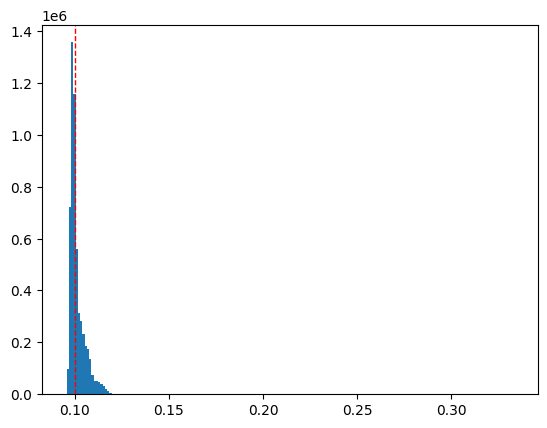

In [ ]:
plt.hist(np.array(Adj[Adj != 0]).flatten(), bins = 200)
plt.axvline(x=0.1, color='r', linestyle='--', linewidth=1)
plt.show()

In [ ]:
# Disminuimos cantidad de aristas, dejamos las que tienen un peso mayor a cierto umbral
mask1 = Adj> 0.102
Adj1 = np.where(mask1, Adj, 0)
mask2 = Adj1 < 0.15
Adj2 = np.where(mask2 , Adj1, 0)
Adj2

array([[0.        , 0.1041355 , 0.10373198, ..., 0.        , 0.        ,
        0.        ],
       [0.1041355 , 0.        , 0.        , ..., 0.        , 0.        ,
        0.10240489],
       [0.10373198, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.12222563,
        0.11584716],
       [0.        , 0.        , 0.        , ..., 0.12222563, 0.        ,
        0.11812767],
       [0.        , 0.10240489, 0.        , ..., 0.11584716, 0.11812767,
        0.        ]])

In [ ]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj2, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [ ]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

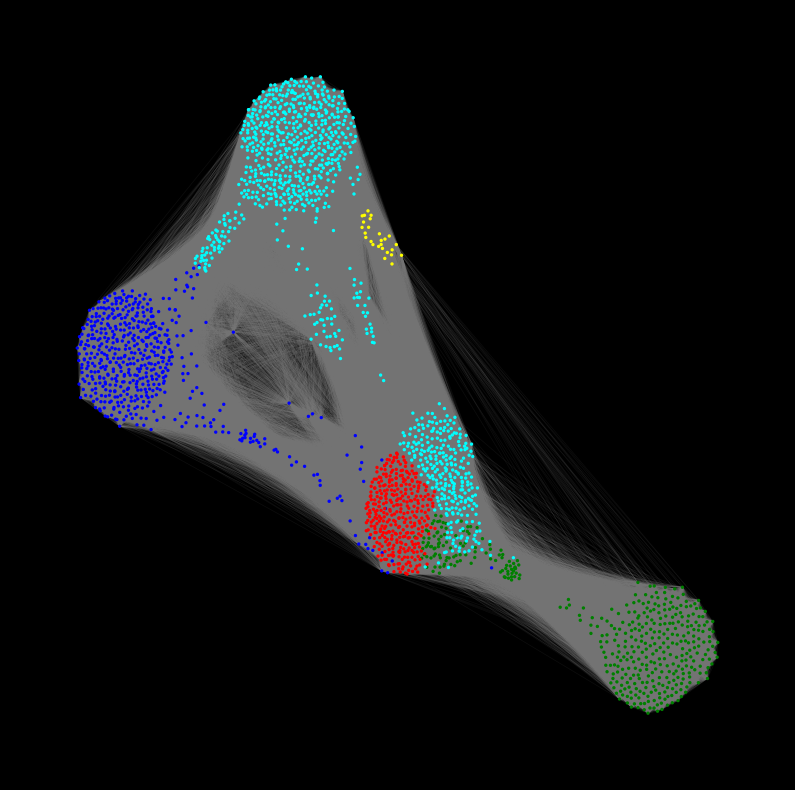

In [ ]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

In [ ]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6946, Acc:
Epoch: 02, Loss: 1.5680, Acc:
Epoch: 03, Loss: 1.4985, Acc:
Epoch: 04, Loss: 1.4587, Acc:
Epoch: 05, Loss: 1.4356, Acc:
Epoch: 06, Loss: 1.4210, Acc:
Epoch: 07, Loss: 1.4110, Acc:
Epoch: 08, Loss: 1.4029, Acc:
Epoch: 09, Loss: 1.3952, Acc:
Epoch: 10, Loss: 1.3838, Acc:
Epoch: 11, Loss: 1.3647, Acc:
Epoch: 12, Loss: 1.3347, Acc:
Epoch: 13, Loss: 1.2976, Acc:
Epoch: 14, Loss: 1.2667, Acc:
Epoch: 15, Loss: 1.2459, Acc:
Epoch: 16, Loss: 1.2307, Acc:
Epoch: 17, Loss: 1.2229, Acc:
Epoch: 18, Loss: 1.2182, Acc:
Epoch: 19, Loss: 1.2123, Acc:
Epoch: 20, Loss: 1.2075, Acc:
Epoch: 21, Loss: 1.2061, Acc:
Epoch: 22, Loss: 1.2039, Acc:
Epoch: 23, Loss: 1.2026, Acc:
Epoch: 24, Loss: 1.2015, Acc:
Epoch: 25, Loss: 1.2002, Acc:
Epoch: 26, Loss: 1.2003, Acc:
Epoch: 27, Loss: 1.1992, Acc:
Epoch: 28, Loss: 1.1987, Acc:
Epoch: 29, Loss: 1.1976, Acc:
Epoch: 30, Loss: 1.1973, Acc:
Epoch: 31, Loss: 1.1959, Acc:
Epoch: 32, Loss: 1.1959, Acc:
Epoch: 33, Loss: 1.1958, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec de grafo productos internos')

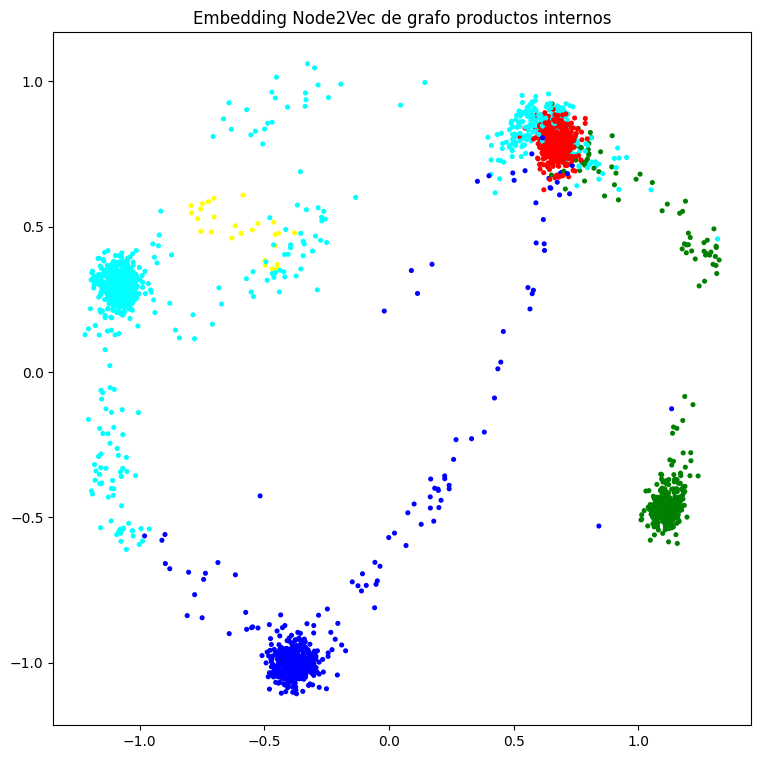

In [ ]:
# Node2vec con grafo pi
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec de grafo productos internos")

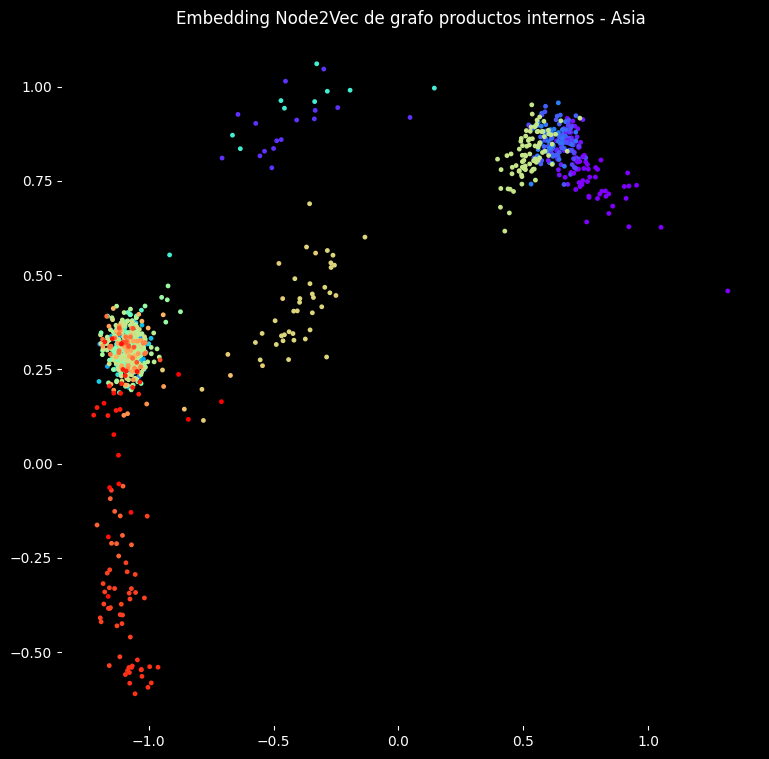

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

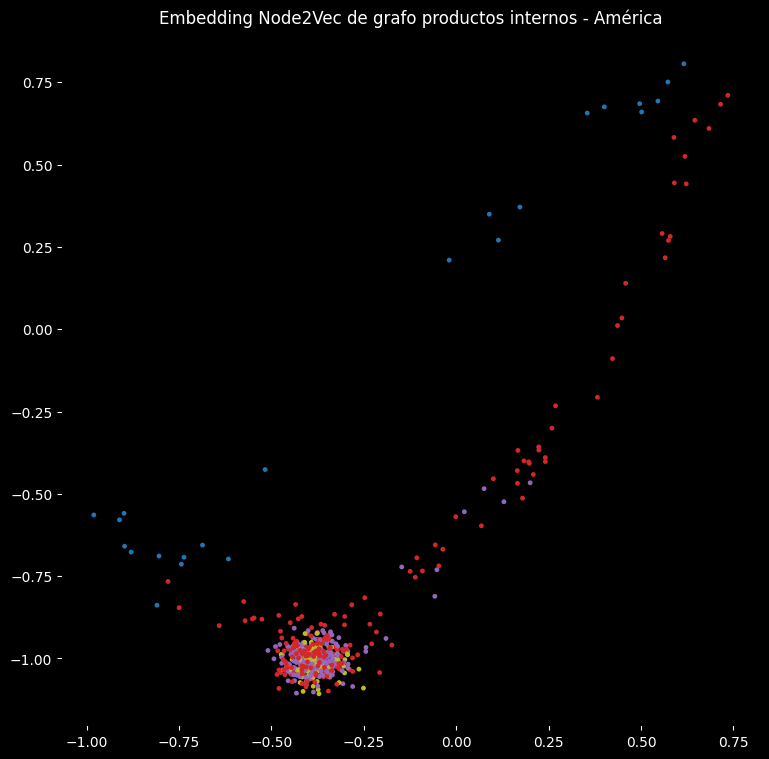

In [ ]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6830
Epoch: 02, Loss: 1.5588
Epoch: 03, Loss: 1.4915
Epoch: 04, Loss: 1.4532
Epoch: 05, Loss: 1.4316
Epoch: 06, Loss: 1.4181
Epoch: 07, Loss: 1.4090
Epoch: 08, Loss: 1.4030
Epoch: 09, Loss: 1.3978
Epoch: 10, Loss: 1.3926
Epoch: 11, Loss: 1.3849
Epoch: 12, Loss: 1.3710
Epoch: 13, Loss: 1.3457
Epoch: 14, Loss: 1.3091
Epoch: 15, Loss: 1.2689
Epoch: 16, Loss: 1.2408
Epoch: 17, Loss: 1.2234
Epoch: 18, Loss: 1.2155
Epoch: 19, Loss: 1.2098
Epoch: 20, Loss: 1.2097
Epoch: 21, Loss: 1.2051
Epoch: 22, Loss: 1.2038
Epoch: 23, Loss: 1.2019
Epoch: 24, Loss: 1.2026
Epoch: 25, Loss: 1.2008
Epoch: 26, Loss: 1.2018
Epoch: 27, Loss: 1.1988
Epoch: 28, Loss: 1.1998
Epoch: 29, Loss: 1.1997
Epoch: 30, Loss: 1.1992
Epoch: 31, Loss: 1.1983
Epoch: 32, Loss: 1.1993
Epoch: 33, Loss: 1.1993
Epoch: 34, Loss: 1.1989
Epoch: 35, Loss: 1.1991
Epoch: 36, Loss: 1.1984
Epoch: 37, Loss: 1.1964
Epoch: 38, Loss: 1.1978
Epoch: 39, Loss: 1.1987
Epoch: 40, Loss: 1.1999
Epoch: 41, Loss: 1.1987
Epoch: 42, Loss:

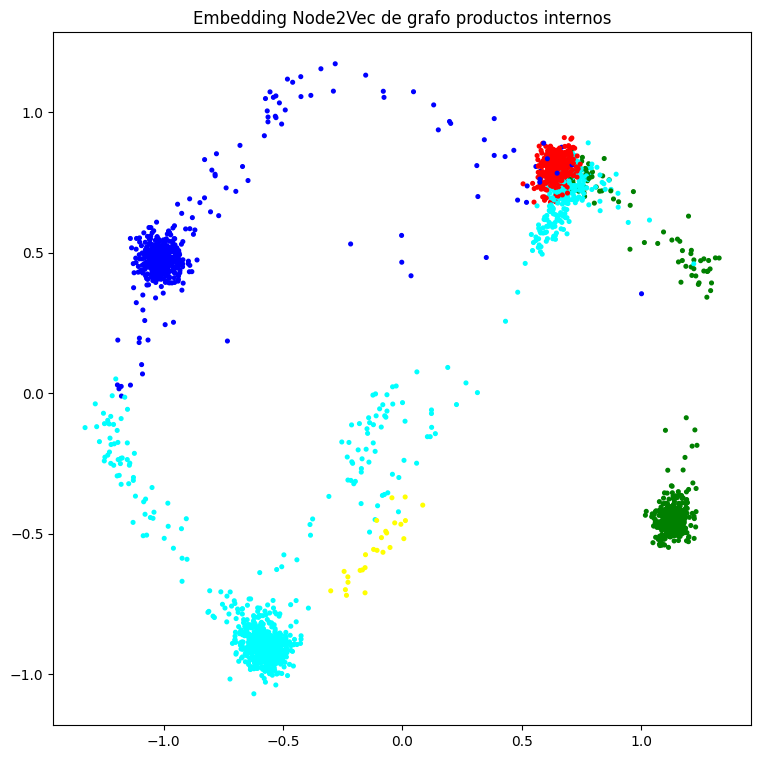

In [ ]:
# Define los hiperparámetros
embedding_dim = 2
walk_length = 25
context_size = 10
walks_per_node = 10
num_negative_samples = 1
p = 2
q = 0.5
sparse = True
lr = 0.01
epochs = 100

# Crear el modelo Node2Vec
model = Node2Vec(pyg_graph.edge_index, embedding_dim=embedding_dim, walk_length=walk_length,
                 context_size=context_size, walks_per_node=walks_per_node,
                 num_negative_samples=num_negative_samples, p=p, q=q, sparse=sparse)

optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=lr)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True, num_workers=num_workers)

data = pyg_graph

def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, epochs + 1):
    loss = train()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig,ax1 = plt.subplots(1,1,figsize=(9, 9))
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint.get(x)), s=7)

plt.title("Embedding Node2Vec de grafo productos internos")
plt.show()

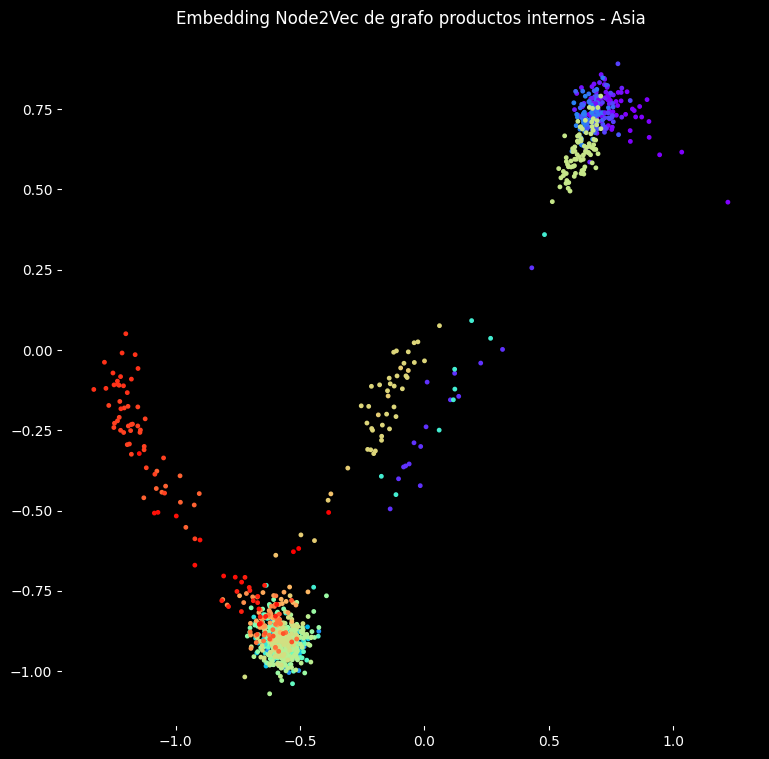

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

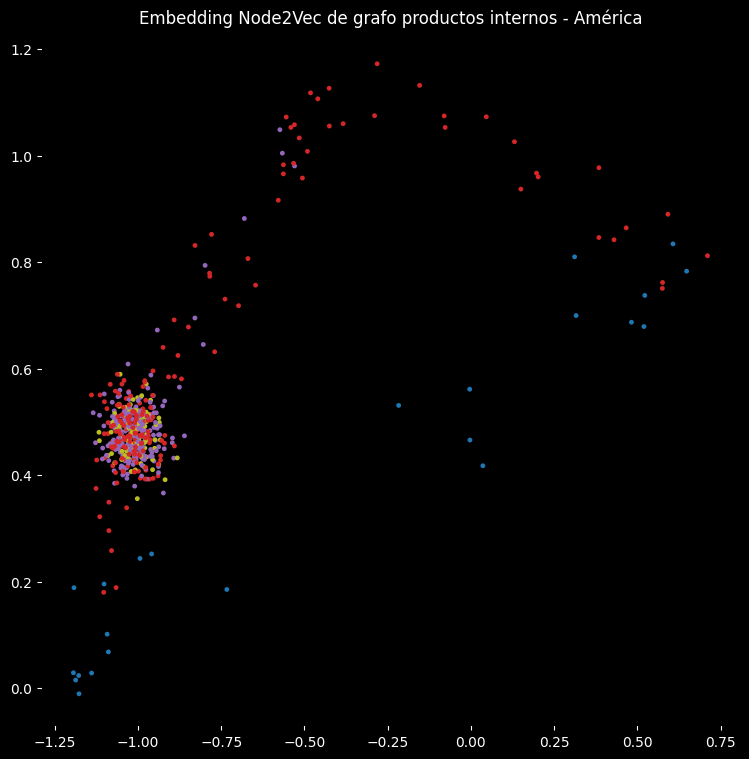

In [ ]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

Embedding Node2vec + tsne


In [ ]:
model2 = Node2Vec(pyg_graph.edge_index, embedding_dim=10, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer2 = torch.optim.SparseAdam(list(model2.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader2 = model2.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train2():
    model2.train()
    total_loss = 0
    for pos_rw, neg_rw in loader2:
        optimizer2.zero_grad()
        loss = model2.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer2.step()
        total_loss += loss.item()
    return total_loss / len(loader2)

for epoch in range(1, 101):
    loss = train2()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 2.5890, Acc:
Epoch: 02, Loss: 2.1462, Acc:
Epoch: 03, Loss: 1.8650, Acc:
Epoch: 04, Loss: 1.6902, Acc:
Epoch: 05, Loss: 1.5825, Acc:
Epoch: 06, Loss: 1.5086, Acc:
Epoch: 07, Loss: 1.4461, Acc:
Epoch: 08, Loss: 1.3788, Acc:
Epoch: 09, Loss: 1.3152, Acc:
Epoch: 10, Loss: 1.2708, Acc:
Epoch: 11, Loss: 1.2466, Acc:
Epoch: 12, Loss: 1.2291, Acc:
Epoch: 13, Loss: 1.2174, Acc:
Epoch: 14, Loss: 1.2081, Acc:
Epoch: 15, Loss: 1.2010, Acc:
Epoch: 16, Loss: 1.1953, Acc:
Epoch: 17, Loss: 1.1930, Acc:
Epoch: 18, Loss: 1.1901, Acc:
Epoch: 19, Loss: 1.1885, Acc:
Epoch: 20, Loss: 1.1858, Acc:
Epoch: 21, Loss: 1.1852, Acc:
Epoch: 22, Loss: 1.1842, Acc:
Epoch: 23, Loss: 1.1832, Acc:
Epoch: 24, Loss: 1.1824, Acc:
Epoch: 25, Loss: 1.1822, Acc:
Epoch: 26, Loss: 1.1796, Acc:
Epoch: 27, Loss: 1.1816, Acc:
Epoch: 28, Loss: 1.1815, Acc:
Epoch: 29, Loss: 1.1804, Acc:
Epoch: 30, Loss: 1.1793, Acc:
Epoch: 31, Loss: 1.1804, Acc:
Epoch: 32, Loss: 1.1782, Acc:
Epoch: 33, Loss: 1.1779, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec dim=100 + Tsne de grafo F2')

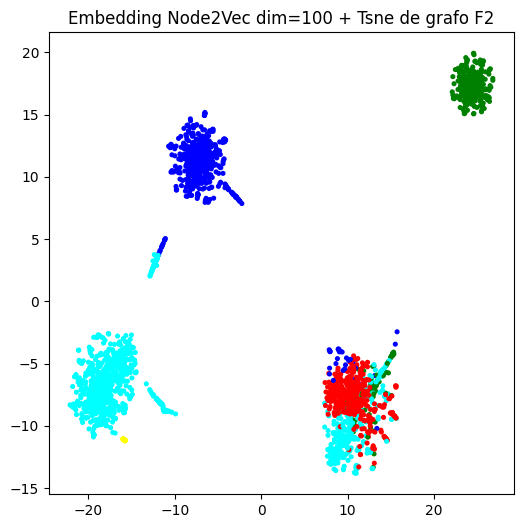

In [ ]:
model2.eval()
z2 = model2(torch.arange(data.num_nodes, device=device)).detach().numpy()

tsne = openTSNE.TSNE(
    perplexity=200,
    metric="euclidean",
    n_jobs=8,
    random_state=42,
    verbose=False,
)
tsne_nod2vec = tsne.fit(z2)
fig,ax1 = plt.subplots(1,1,figsize=(6, 6))
ax1.scatter(tsne_nod2vec[:,0],tsne_nod2vec[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec dim=100 + Tsne de grafo F2")

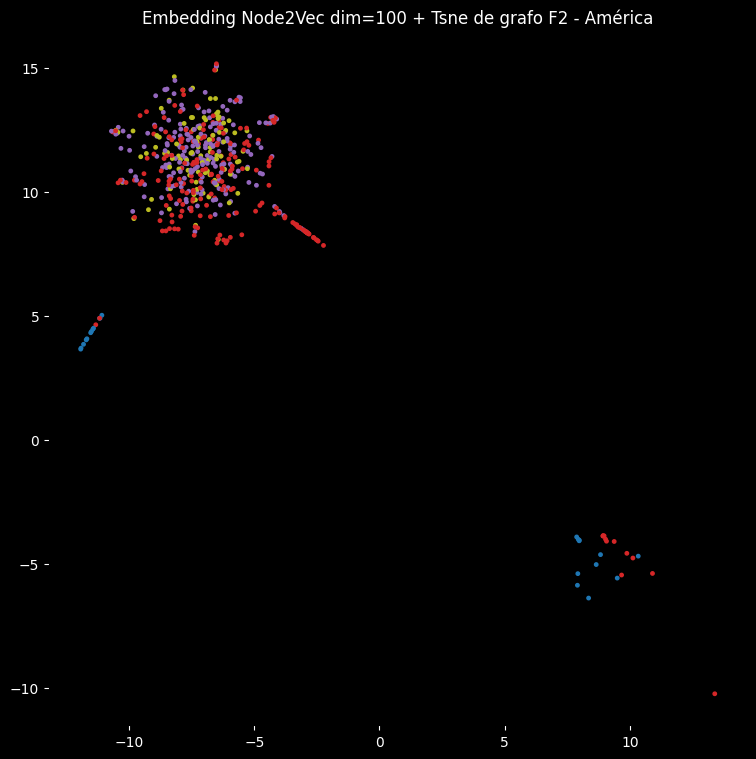

In [ ]:
tsne_america = tsne_nod2vec[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(tsne_america[:, 0], tsne_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec dim=100 + Tsne de grafo F2 - América", color='white')  # Cambiar el color del título a blanco
plt.show()

# Distancia Euclidea

In [ ]:
from scipy.spatial.distance import pdist, squareform

In [ ]:
# 1. Imputamos datos vacíos con la media de cada columna
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(df)

# 2. Normalizamos
df_norm = data_imputed.copy()
df_norm = normalize(df_norm, norm='l2', axis=1)
display(df_norm)

array([[0.00904505, 0.01809011, 0.00904505, ..., 0.        , 0.        ,
        0.01809011],
       [0.        , 0.        , 0.00900317, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.01841305, ..., 0.        , 0.        ,
        0.00920653],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.00907742,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.00925025,
        0.00925025],
       [0.        , 0.        , 0.0092183 , ..., 0.        , 0.        ,
        0.0092183 ]])

In [ ]:
distances = pdist(df_norm, metric='euclidean') #distancia euclidea

# Convierte el resultado en una matriz de distancias
distance_matrix = pd.DataFrame(squareform(distances), index=df.index, columns=df.index)

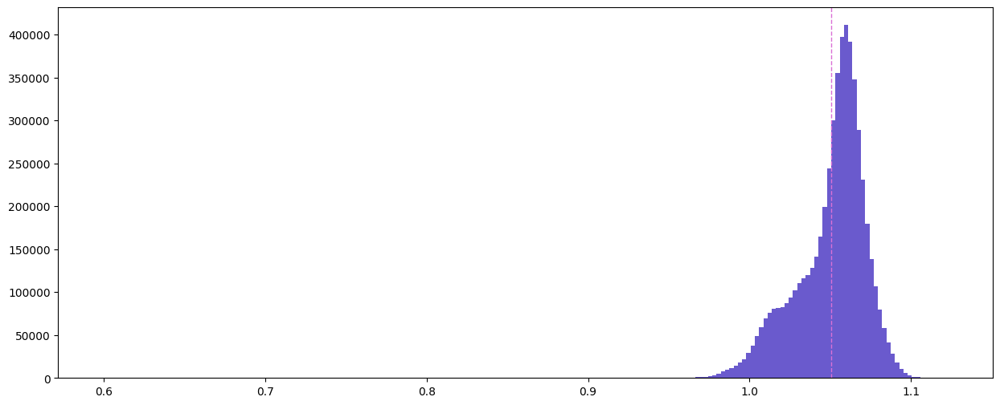

In [16]:
plt.figure(figsize=(15, 6))
plt.hist(np.array(distance_matrix [distance_matrix  != 0]).flatten(), bins = 200, color = "slateblue")
plt.axvline(x=np.mean(distance_matrix [distance_matrix  != 0]), color='orchid', linestyle='--', linewidth=1)
plt.show()

In [19]:
Adj_euclidea = 1 / distance_matrix
np.fill_diagonal(Adj_euclidea.values, 0)
#Adj_fermat[Adj_fermat != 1] = 10000 * Adj_fermat[Adj_fermat != 1]

In [20]:
Adj_euclidea

,1_C1_1_C1,2_C2_2_C2,3_C3_3_C3,4_C4_4_C4,5_C5_5_C5,6_C6_6_C6,7_C7_7_C7,8_C8_8_C8,9_C9_9_C9,10_C10_10_C10,...,2352_NAD15_2352_NAD15,2353_NAD54_2353_NAD54,2354_NAD55_2354_NAD55,2355_NAD56_2355_NAD56,2356_NAD57_2356_NAD57,2357_NAD59_2357_NAD59,2358_NAD64_2358_NAD64,2359_NAD93_2359_NAD93,2360_NAD96_2360_NAD96,2361_NAD98_2361_NAD98
1_C1_1_C1,0.000000,0.973342,0.970596,0.980331,0.978608,0.979850,0.971423,0.975640,0.972135,0.959078,...,0.956578,0.946042,0.950000,0.954334,0.962081,0.937112,0.960599,0.945470,0.944639,0.962331
2_C2_2_C2,0.973342,0.000000,0.965318,0.979218,0.977148,0.977084,0.973845,0.976023,0.977249,0.964945,...,0.951519,0.953711,0.956551,0.953324,0.963856,0.942234,0.960325,0.944300,0.951709,0.964686
3_C3_3_C3,0.970596,0.965318,0.000000,0.969934,0.971993,0.968196,0.959990,0.972449,0.973090,0.971981,...,0.964670,0.956667,0.958083,0.957675,0.964150,0.950236,0.960373,0.954434,0.952791,0.964592
4_C4_4_C4,0.980331,0.979218,0.969934,0.000000,0.982948,0.981821,0.983899,0.974383,0.971961,0.964829,...,0.946990,0.948836,0.948591,0.950537,0.961834,0.939226,0.959402,0.936290,0.945134,0.966500
5_C5_5_C5,0.978608,0.977148,0.971993,0.982948,0.000000,0.977194,0.980590,0.970981,0.967979,0.964582,...,0.957922,0.954226,0.946489,0.955530,0.962470,0.941311,0.956860,0.939364,0.946699,0.966741
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,0.937112,0.942234,0.950236,0.939226,0.941311,0.938140,0.931233,0.938173,0.953392,0.948143,...,1.032015,1.034752,1.014159,1.065636,1.016668,0.000000,1.030147,1.084997,1.043549,1.001577
2358_NAD64_2358_NAD64,0.960599,0.960325,0.960373,0.959402,0.956860,0.961399,0.952773,0.956090,0.966165,0.963806,...,1.026084,1.014910,1.035352,1.044757,1.059656,1.030147,0.000000,1.046811,1.050055,1.069332
2359_NAD93_2359_NAD93,0.945470,0.944300,0.954434,0.936290,0.939364,0.943750,0.932493,0.944691,0.960617,0.949388,...,1.050895,1.045705,1.040416,1.045349,1.026023,1.084997,1.046811,0.000000,1.037356,1.018011
2360_NAD96_2360_NAD96,0.944639,0.951709,0.952791,0.945134,0.946699,0.950904,0.941975,0.949806,0.960046,0.955968,...,1.024884,1.018584,1.030948,1.082558,1.081900,1.043549,1.050055,1.037356,0.000000,1.030980


In [22]:
np.mean(Adj_euclidea)

0.9518668768164678

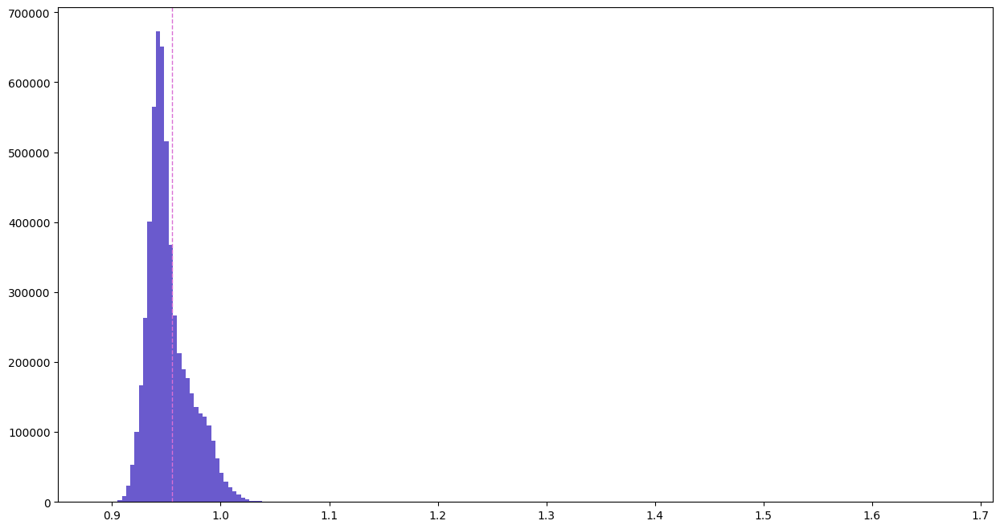

In [61]:
plt.figure(figsize=(15, 8))
plt.hist(np.array(Adj_euclidea[Adj_euclidea !=0]).flatten(), bins = 200, color = "slateblue")
plt.axvline(x=0.955, color='orchid', linestyle='--', linewidth=1)
plt.show()

In [62]:
mask = Adj_euclidea> 0.955
Adj = np.where(mask , Adj_euclidea, 0)
Adj

array([[0.        , 0.97334156, 0.97059594, ..., 0.        , 0.        ,
        0.96233123],
       [0.97334156, 0.        , 0.96531764, ..., 0.        , 0.        ,
        0.9646858 ],
       [0.97059594, 0.96531764, 0.        , ..., 0.        , 0.        ,
        0.96459161],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 1.03735594,
        1.01801082],
       [0.        , 0.        , 0.        , ..., 1.03735594, 0.        ,
        1.03097992],
       [0.96233123, 0.9646858 , 0.96459161, ..., 1.01801082, 1.03097992,
        0.        ]])

In [63]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [64]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

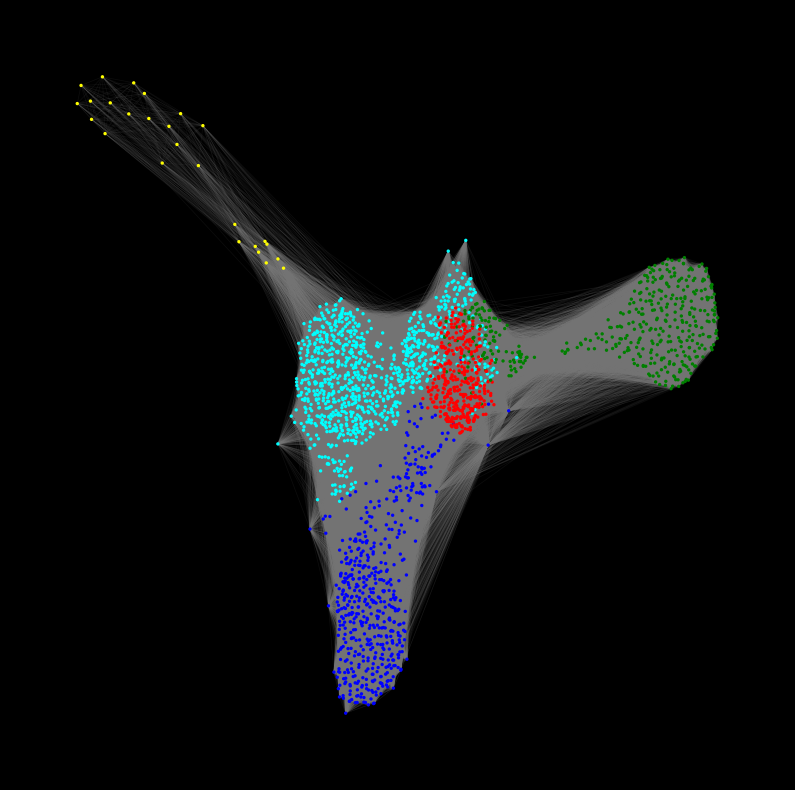

In [65]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

In [66]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6842, Acc:
Epoch: 02, Loss: 1.5607, Acc:
Epoch: 03, Loss: 1.4919, Acc:
Epoch: 04, Loss: 1.4547, Acc:
Epoch: 05, Loss: 1.4321, Acc:
Epoch: 06, Loss: 1.4175, Acc:
Epoch: 07, Loss: 1.4076, Acc:
Epoch: 08, Loss: 1.3988, Acc:
Epoch: 09, Loss: 1.3904, Acc:
Epoch: 10, Loss: 1.3803, Acc:
Epoch: 11, Loss: 1.3695, Acc:
Epoch: 12, Loss: 1.3569, Acc:
Epoch: 13, Loss: 1.3435, Acc:
Epoch: 14, Loss: 1.3320, Acc:
Epoch: 15, Loss: 1.3241, Acc:
Epoch: 16, Loss: 1.3162, Acc:
Epoch: 17, Loss: 1.3125, Acc:
Epoch: 18, Loss: 1.3067, Acc:
Epoch: 19, Loss: 1.3017, Acc:
Epoch: 20, Loss: 1.2946, Acc:
Epoch: 21, Loss: 1.2909, Acc:
Epoch: 22, Loss: 1.2867, Acc:
Epoch: 23, Loss: 1.2835, Acc:
Epoch: 24, Loss: 1.2812, Acc:
Epoch: 25, Loss: 1.2805, Acc:
Epoch: 26, Loss: 1.2806, Acc:
Epoch: 27, Loss: 1.2778, Acc:
Epoch: 28, Loss: 1.2785, Acc:
Epoch: 29, Loss: 1.2777, Acc:
Epoch: 30, Loss: 1.2774, Acc:
Epoch: 31, Loss: 1.2776, Acc:
Epoch: 32, Loss: 1.2772, Acc:
Epoch: 33, Loss: 1.2779, Acc:
Epoch: 34,

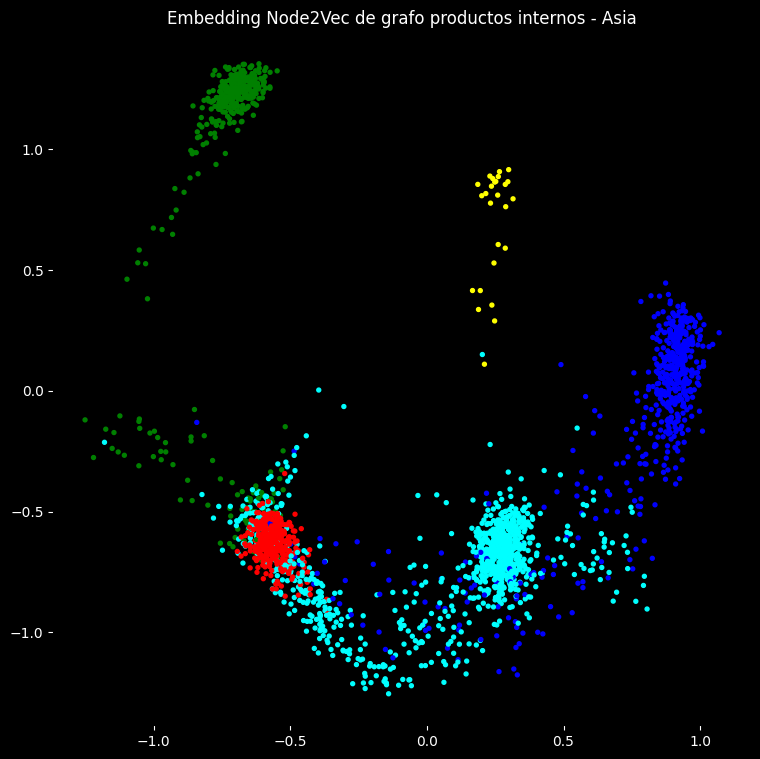

In [67]:
# Node2vec
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')  # Establecer el color de fondo negro
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=8)
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

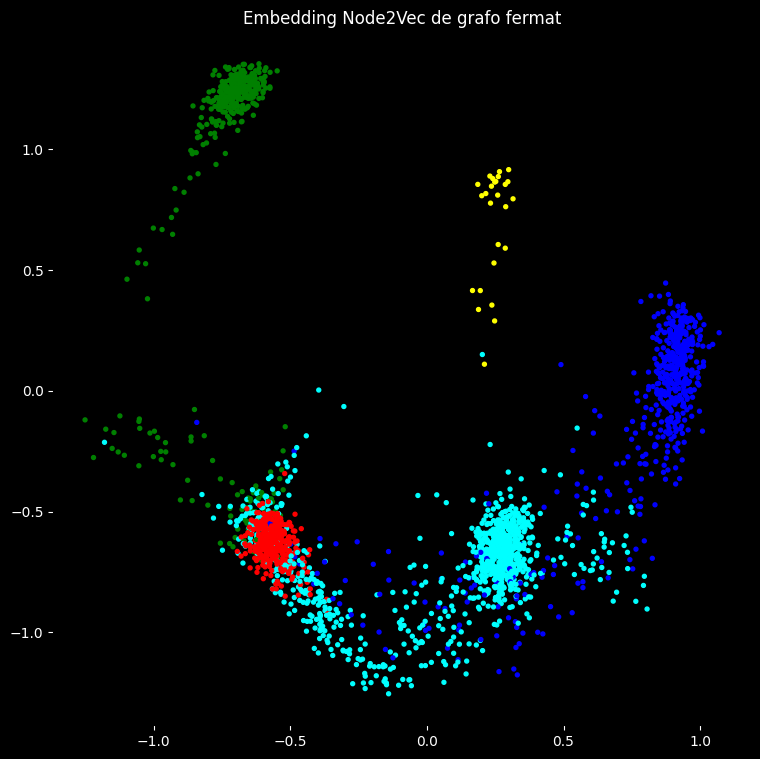

In [68]:
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')  # Establecer el color de fondo negro
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=8)
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo fermat", color='white')  # Cambiar el color del título a blanco
plt.show()

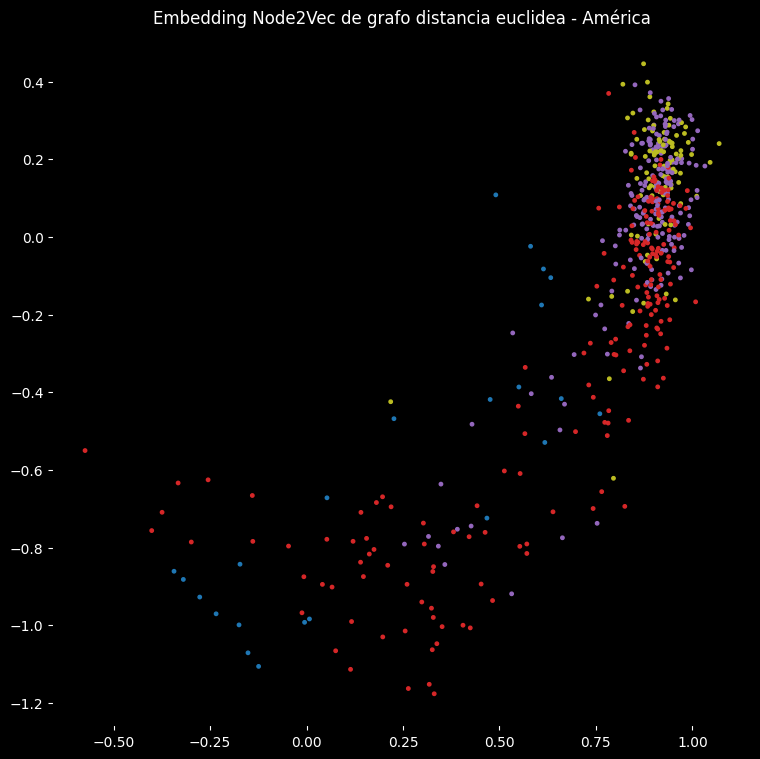

In [75]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo distancia euclidea - América", color='white')  # Cambiar el color del título a blanco
plt.show()

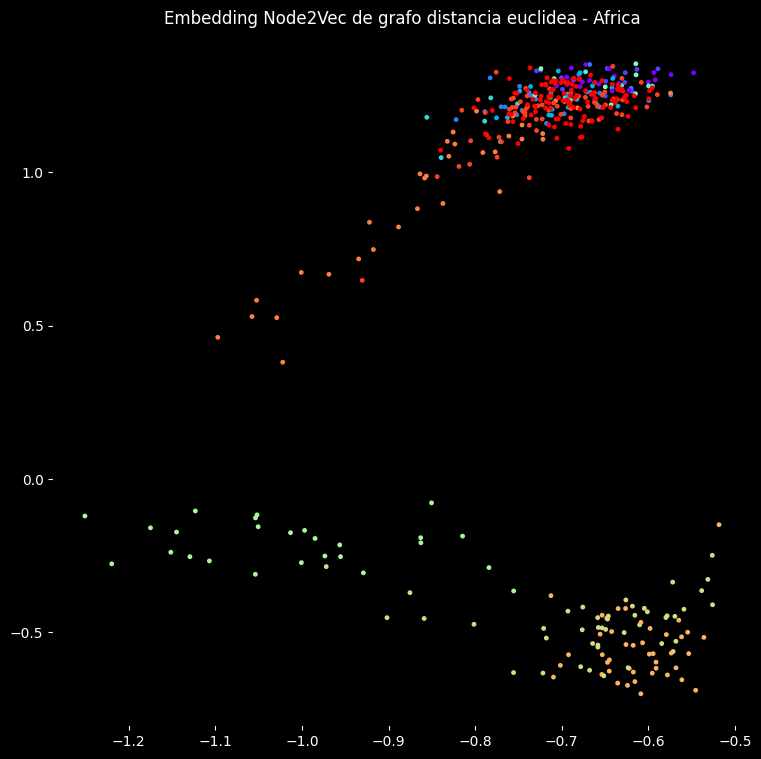

In [76]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo distancia euclidea - Africa", color='white')  # Cambiar el color del título a blanco
plt.show()

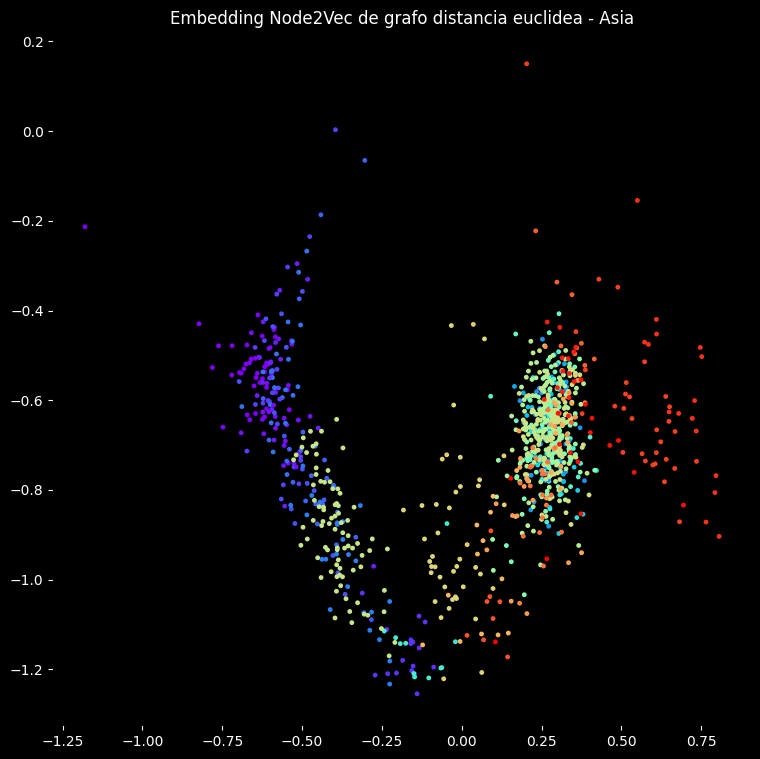

In [77]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo distancia euclidea - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

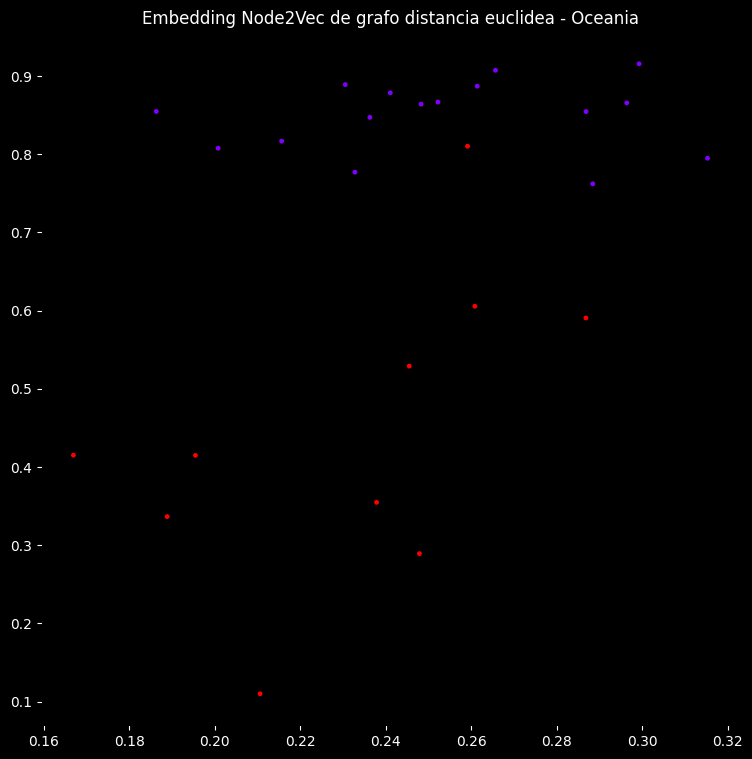

In [78]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo distancia euclidea - Oceania", color='white')  # Cambiar el color del título a blanco
plt.show()

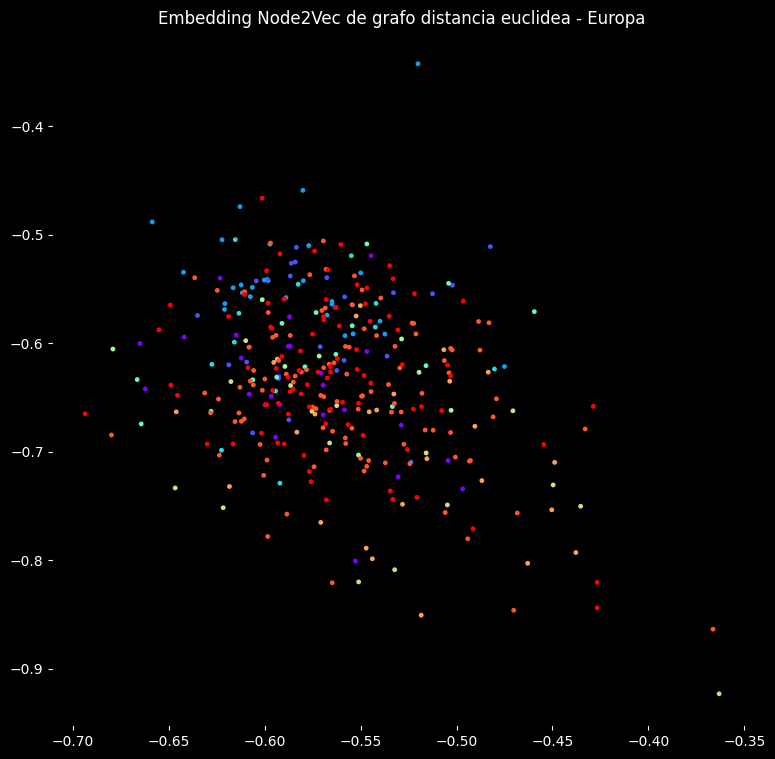

In [79]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo distancia euclidea - Europa", color='white')  # Cambiar el color del título a blanco
plt.show()

# Distancia Fermat

In [11]:
pip install fermat

In [12]:
from fermat import Fermat

In [13]:
from scipy.spatial.distance import pdist, squareform

In [14]:
# 1. Imputamos datos vacíos con la media de cada columna
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(df)

# 2. Normalizamos
df_norm = data_imputed.copy()
df_norm = normalize(df_norm, norm='l2', axis=1)
display(df_norm)

array([[0.00904505, 0.01809011, 0.00904505, ..., 0.        , 0.        ,
        0.01809011],
       [0.        , 0.        , 0.00900317, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.01841305, ..., 0.        , 0.        ,
        0.00920653],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.00907742,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.00925025,
        0.00925025],
       [0.        , 0.        , 0.0092183 , ..., 0.        , 0.        ,
        0.0092183 ]])

In [15]:
distances = pdist(df_norm, metric='euclidean') #distancia euclidea

# Convierte el resultado en una matriz de distancias
distance_matrix = pd.DataFrame(squareform(distances), index=df.index, columns=df.index)

In [80]:
distance_matrix

,1_C1_1_C1,2_C2_2_C2,3_C3_3_C3,4_C4_4_C4,5_C5_5_C5,6_C6_6_C6,7_C7_7_C7,8_C8_8_C8,9_C9_9_C9,10_C10_10_C10,...,2352_NAD15_2352_NAD15,2353_NAD54_2353_NAD54,2354_NAD55_2354_NAD55,2355_NAD56_2355_NAD56,2356_NAD57_2356_NAD57,2357_NAD59_2357_NAD59,2358_NAD64_2358_NAD64,2359_NAD93_2359_NAD93,2360_NAD96_2360_NAD96,2361_NAD98_2361_NAD98
1_C1_1_C1,0.000000,1.027389,1.030295,1.020064,1.021860,1.020565,1.029417,1.024968,1.028664,1.042668,...,1.045393,1.057036,1.052631,1.047852,1.039413,1.067109,1.041017,1.057675,1.058606,1.039143
2_C2_2_C2,1.027389,0.000000,1.035928,1.021223,1.023386,1.023454,1.026857,1.024567,1.023281,1.036328,...,1.050951,1.048536,1.045423,1.048961,1.037500,1.061307,1.041314,1.058986,1.050741,1.036607
3_C3_3_C3,1.030295,1.035928,0.000000,1.030998,1.028814,1.032849,1.041677,1.028332,1.027654,1.028827,...,1.036624,1.045296,1.043751,1.044196,1.037183,1.052370,1.041263,1.047742,1.049548,1.036708
4_C4_4_C4,1.020064,1.021223,1.030998,0.000000,1.017348,1.018515,1.016365,1.026290,1.028848,1.036453,...,1.055977,1.053922,1.054195,1.052036,1.039681,1.064706,1.042316,1.068045,1.058051,1.034661
5_C5_5_C5,1.021860,1.023386,1.028814,1.017348,0.000000,1.023338,1.019794,1.029886,1.033080,1.036719,...,1.043927,1.047970,1.056536,1.046540,1.038993,1.062348,1.045085,1.064550,1.056302,1.034404
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,1.067109,1.061307,1.052370,1.064706,1.062348,1.065939,1.073845,1.065902,1.048886,1.054693,...,0.968978,0.966415,0.986038,0.938407,0.983606,0.000000,0.970735,0.921662,0.958269,0.998425
2358_NAD64_2358_NAD64,1.041017,1.041314,1.041263,1.042316,1.045085,1.040151,1.049568,1.045927,1.035020,1.037553,...,0.974579,0.985309,0.965855,0.957161,0.943702,0.970735,0.000000,0.955282,0.952331,0.935163
2359_NAD93_2359_NAD93,1.057675,1.058986,1.047742,1.068045,1.064550,1.059603,1.072394,1.058547,1.040997,1.053310,...,0.951570,0.956292,0.961154,0.956618,0.974637,0.921662,0.955282,0.000000,0.963989,0.982308
2360_NAD96_2360_NAD96,1.058606,1.050741,1.049548,1.058051,1.056302,1.051631,1.061599,1.052846,1.041617,1.046060,...,0.975720,0.981755,0.969981,0.923738,0.924300,0.958269,0.952331,0.963989,0.000000,0.969951


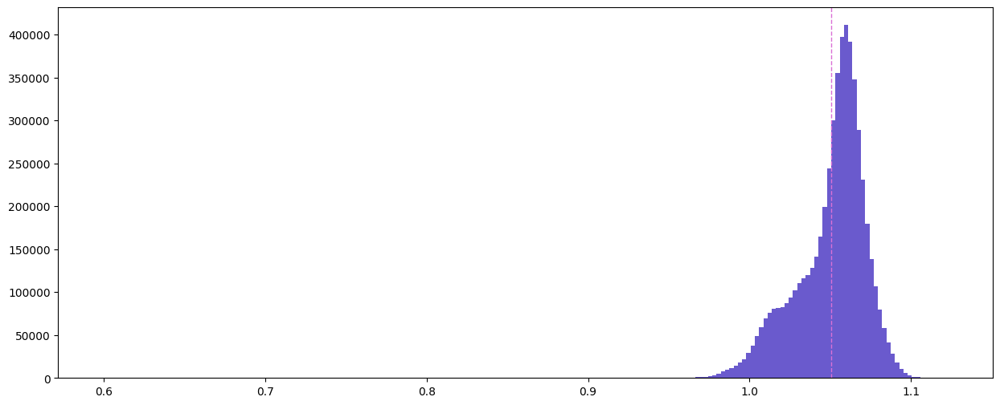

In [81]:
plt.figure(figsize=(15, 6))
plt.hist(np.array(distance_matrix[distance_matrix != 0]).flatten(), bins = 200, color = "slateblue")
plt.axvline(x=np.mean(distance_matrix[distance_matrix != 0]), color='orchid', linestyle='--', linewidth=1)
plt.show()

In [82]:
alpha = 10

In [83]:
f_exact = Fermat(alpha=alpha, path_method='FW')
f_exact.fit(distance_matrix)
fermat_dist_exact = f_exact.get_distances()

In [84]:
fermat_dist_exact

array([[0.        , 1.31022934, 1.34776849, ..., 1.75196064, 1.76743071,
        1.46809519],
       [1.31022934, 0.        , 1.42330374, ..., 1.77378864, 1.64043101,
        1.43265347],
       [1.34776849, 1.42330374, 0.        , ..., 1.59419655, 1.62189104,
        1.43405306],
       ...,
       [1.75196064, 1.77378864, 1.59419655, ..., 0.        , 0.69298213,
        0.8365195 ],
       [1.76743071, 1.64043101, 1.62189104, ..., 0.69298213, 0.        ,
        0.73705169],
       [1.46809519, 1.43265347, 1.43405306, ..., 0.8365195 , 0.73705169,
        0.        ]])

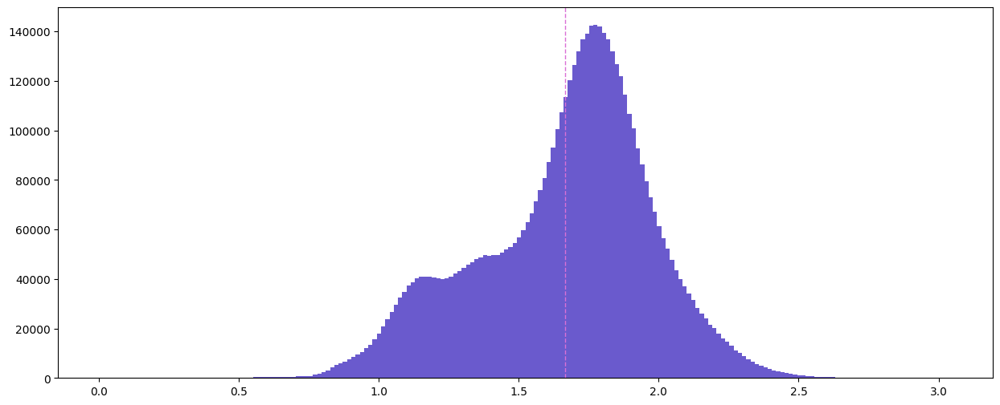

In [85]:
plt.figure(figsize=(15, 6))
plt.hist(np.array(fermat_dist_exact[fermat_dist_exact != 0]).flatten(), bins = 200, color = "slateblue")
plt.axvline(x=np.mean(fermat_dist_exact[fermat_dist_exact != 0]), color='orchid', linestyle='--', linewidth=1)
plt.show()

In [86]:
Adj_fermat = 1 / fermat_dist_exact
np.fill_diagonal(Adj_fermat, 0)
#Adj_fermat[Adj_fermat != 1] = 10000 * Adj_fermat[Adj_fermat != 1]

<ipython-input-86-90bf3dcb5dc8>:1: RuntimeWarning: divide by zero encountered in divide
  Adj_fermat = 1 / fermat_dist_exact


In [87]:
Adj_fermat

array([[0.        , 0.76322516, 0.74196719, ..., 0.57078908, 0.56579304,
        0.68115474],
       [0.76322516, 0.        , 0.70259072, ..., 0.56376503, 0.60959589,
        0.6980055 ],
       [0.74196719, 0.70259072, 0.        , ..., 0.62727523, 0.61656423,
        0.69732427],
       ...,
       [0.57078908, 0.56376503, 0.62727523, ..., 0.        , 1.44303864,
        1.19542939],
       [0.56579304, 0.60959589, 0.61656423, ..., 1.44303864, 0.        ,
        1.35675694],
       [0.68115474, 0.6980055 , 0.69732427, ..., 1.19542939, 1.35675694,
        0.        ]])

In [88]:
np.mean(Adj_fermat)

0.6276562665157057

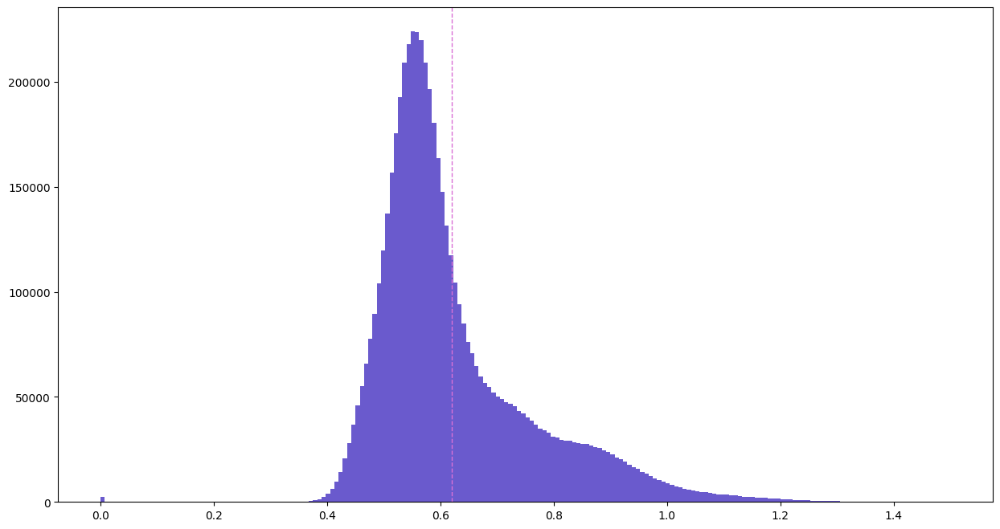

In [111]:
plt.figure(figsize=(15, 8))
plt.hist(np.array(Adj_fermat[Adj_fermat < 1.5]).flatten(), bins = 200, color = "slateblue")
plt.axvline(x=0.62, color='orchid', linestyle='--', linewidth=1)
plt.show()

In [112]:
mask = Adj_fermat > 0.62
Adj = np.where(mask , Adj_fermat, 0)
Adj

array([[0.        , 0.76322516, 0.74196719, ..., 0.        , 0.        ,
        0.68115474],
       [0.76322516, 0.        , 0.70259072, ..., 0.        , 0.        ,
        0.6980055 ],
       [0.74196719, 0.70259072, 0.        , ..., 0.62727523, 0.        ,
        0.69732427],
       ...,
       [0.        , 0.        , 0.62727523, ..., 0.        , 1.44303864,
        1.19542939],
       [0.        , 0.        , 0.        , ..., 1.44303864, 0.        ,
        1.35675694],
       [0.68115474, 0.6980055 , 0.69732427, ..., 1.19542939, 1.35675694,
        0.        ]])

In [113]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [114]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

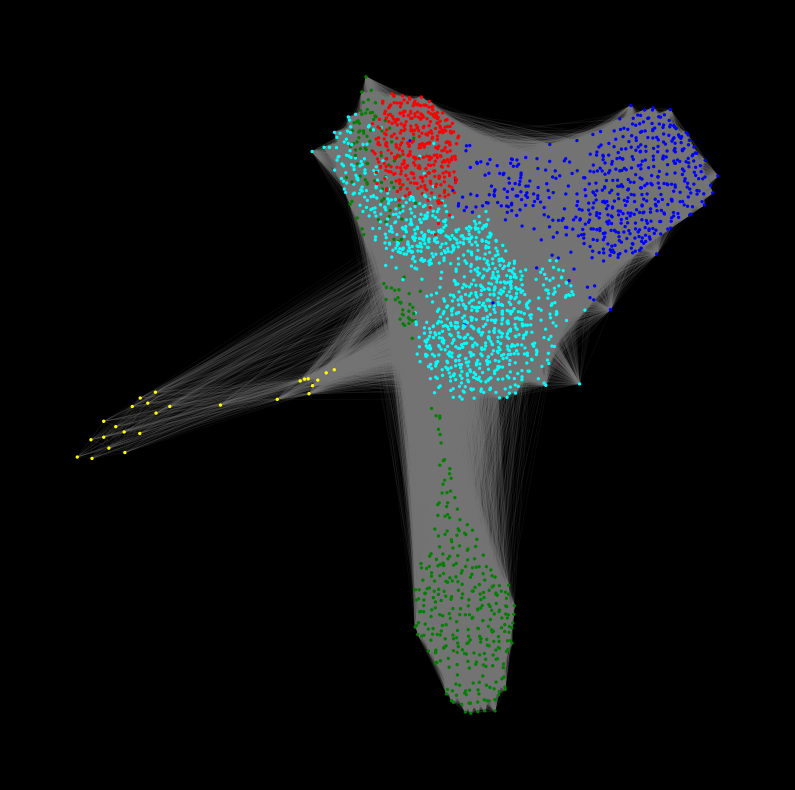

In [115]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

In [116]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.6954, Acc:
Epoch: 02, Loss: 1.5680, Acc:
Epoch: 03, Loss: 1.4978, Acc:
Epoch: 04, Loss: 1.4576, Acc:
Epoch: 05, Loss: 1.4341, Acc:
Epoch: 06, Loss: 1.4201, Acc:
Epoch: 07, Loss: 1.4107, Acc:
Epoch: 08, Loss: 1.4040, Acc:
Epoch: 09, Loss: 1.3985, Acc:
Epoch: 10, Loss: 1.3932, Acc:
Epoch: 11, Loss: 1.3868, Acc:
Epoch: 12, Loss: 1.3775, Acc:
Epoch: 13, Loss: 1.3652, Acc:
Epoch: 14, Loss: 1.3523, Acc:
Epoch: 15, Loss: 1.3406, Acc:
Epoch: 16, Loss: 1.3323, Acc:
Epoch: 17, Loss: 1.3282, Acc:
Epoch: 18, Loss: 1.3228, Acc:
Epoch: 19, Loss: 1.3216, Acc:
Epoch: 20, Loss: 1.3202, Acc:
Epoch: 21, Loss: 1.3184, Acc:
Epoch: 22, Loss: 1.3181, Acc:
Epoch: 23, Loss: 1.3166, Acc:
Epoch: 24, Loss: 1.3169, Acc:
Epoch: 25, Loss: 1.3161, Acc:
Epoch: 26, Loss: 1.3146, Acc:
Epoch: 27, Loss: 1.3131, Acc:
Epoch: 28, Loss: 1.3102, Acc:
Epoch: 29, Loss: 1.3068, Acc:
Epoch: 30, Loss: 1.3039, Acc:
Epoch: 31, Loss: 1.3019, Acc:
Epoch: 32, Loss: 1.3010, Acc:
Epoch: 33, Loss: 1.2991, Acc:
Epoch: 34,

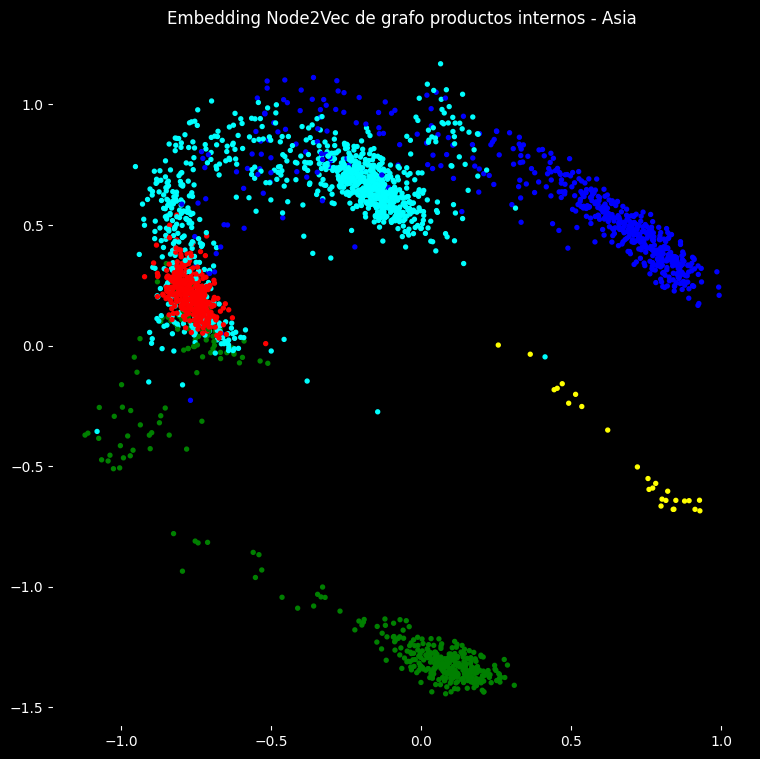

In [117]:
# Node2vec
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')  # Establecer el color de fondo negro
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=8)
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo fermat", color='white')  # Cambiar el color del título a blanco
plt.show()

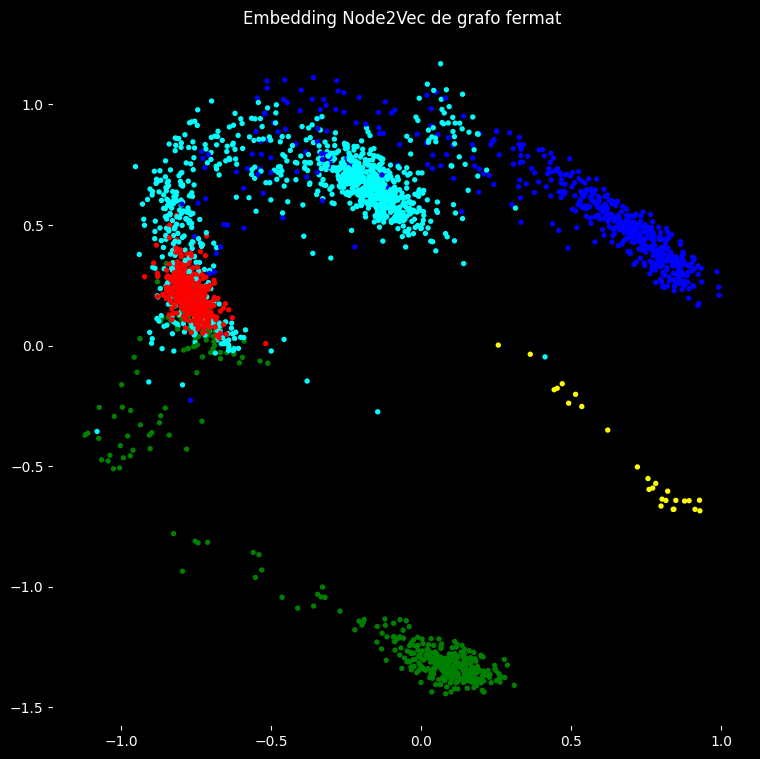

In [118]:
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')  # Establecer el color de fondo negro
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=8)
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo fermat", color='white')  # Cambiar el color del título a blanco
plt.show()

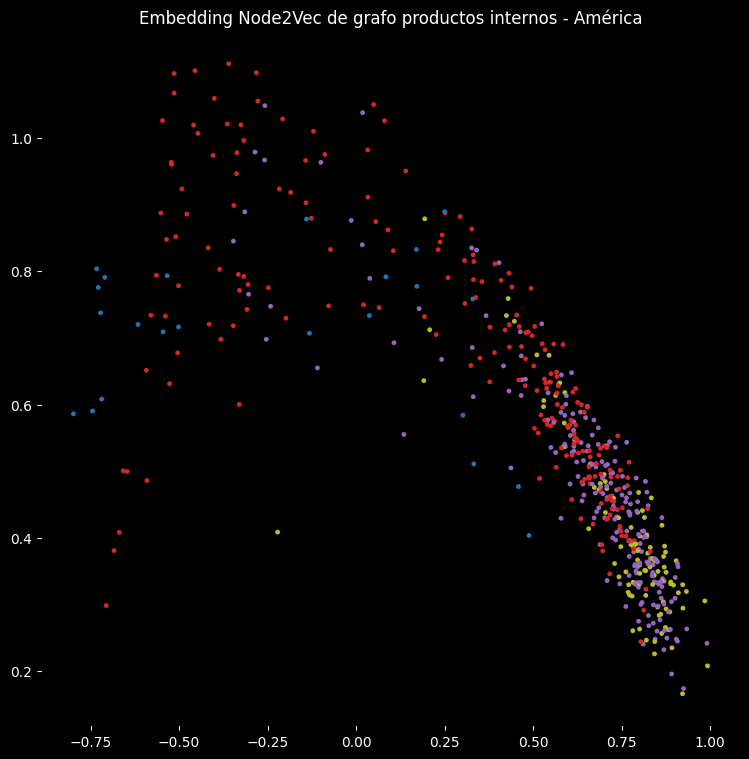

In [119]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

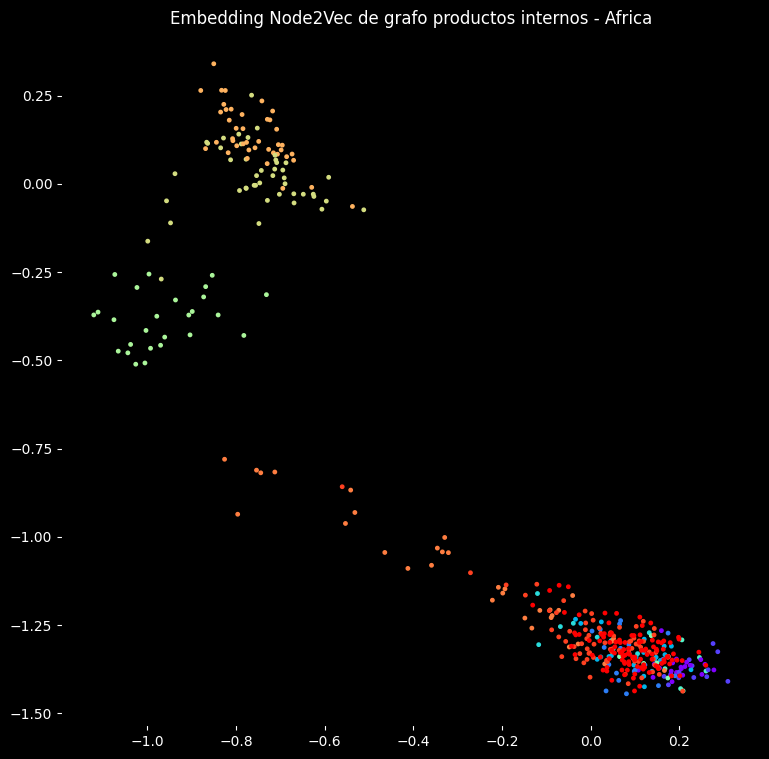

In [121]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Africa", color='white')  # Cambiar el color del título a blanco
plt.show()

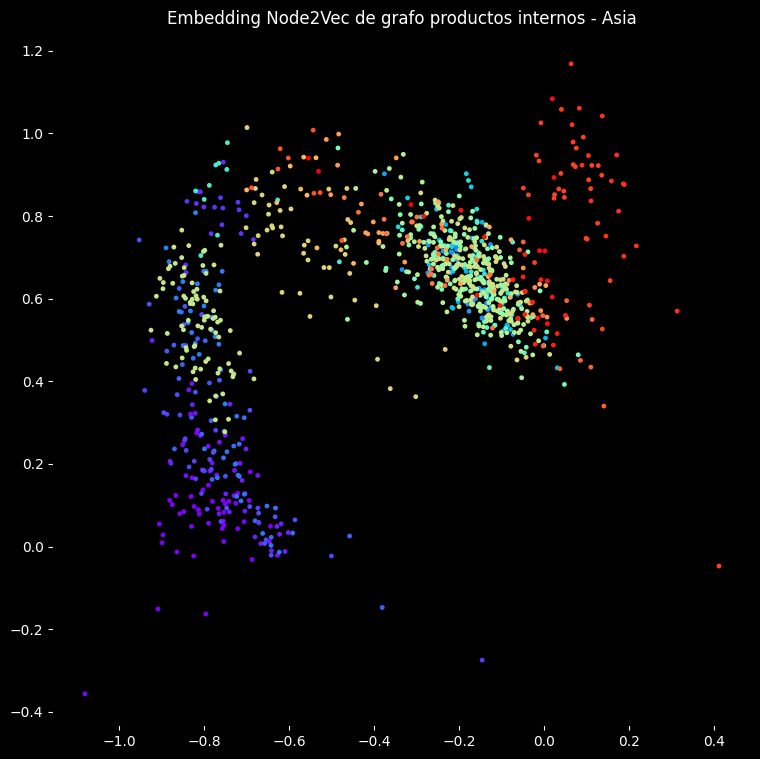

In [122]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

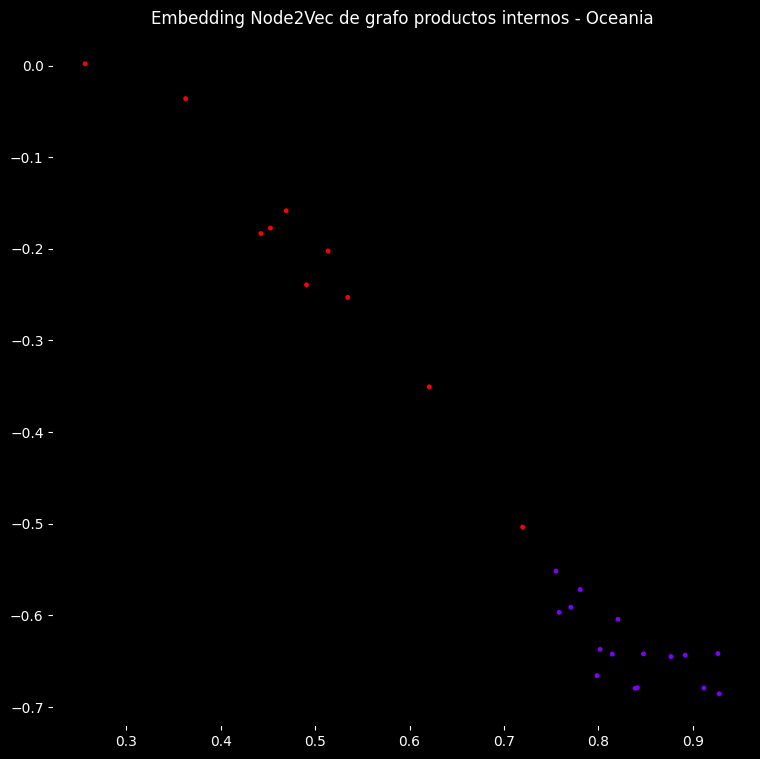

In [123]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Oceania", color='white')  # Cambiar el color del título a blanco
plt.show()

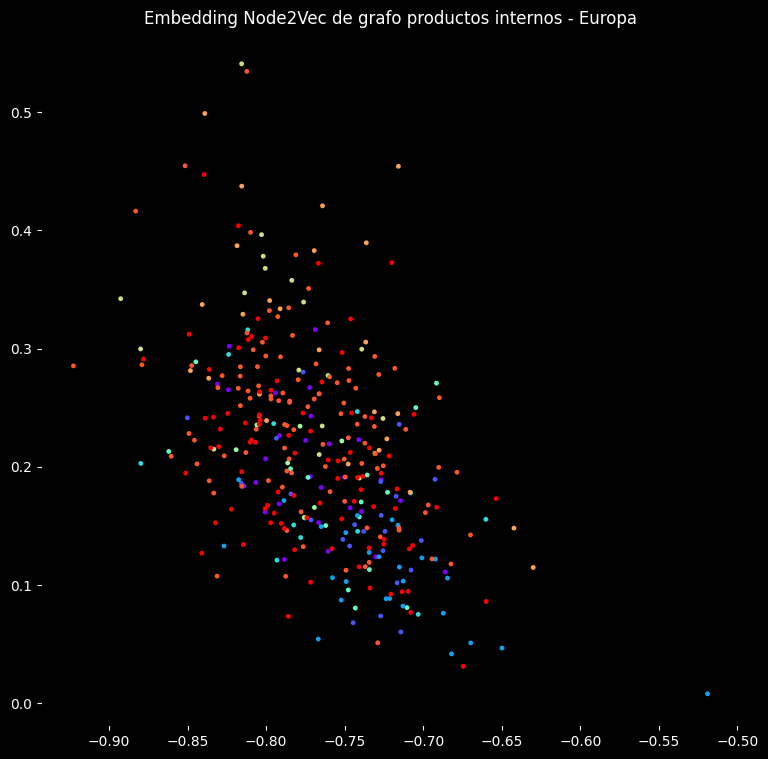

In [124]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Europa", color='white')  # Cambiar el color del título a blanco
plt.show()

## Fermat, Node2vec + tsne

In [ ]:
model2 = Node2Vec(pyg_graph.edge_index, embedding_dim=10, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer2 = torch.optim.SparseAdam(list(model2.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader2 = model2.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train2():
    model2.train()
    total_loss = 0
    for pos_rw, neg_rw in loader2:
        optimizer2.zero_grad()
        loss = model2.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer2.step()
        total_loss += loss.item()
    return total_loss / len(loader2)

for epoch in range(1, 101):
    loss = train2()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 2.6004, Acc:
Epoch: 02, Loss: 2.1549, Acc:
Epoch: 03, Loss: 1.8695, Acc:
Epoch: 04, Loss: 1.6967, Acc:
Epoch: 05, Loss: 1.5920, Acc:
Epoch: 06, Loss: 1.5261, Acc:
Epoch: 07, Loss: 1.4821, Acc:
Epoch: 08, Loss: 1.4504, Acc:
Epoch: 09, Loss: 1.4230, Acc:
Epoch: 10, Loss: 1.3975, Acc:
Epoch: 11, Loss: 1.3741, Acc:
Epoch: 12, Loss: 1.3555, Acc:
Epoch: 13, Loss: 1.3430, Acc:
Epoch: 14, Loss: 1.3341, Acc:
Epoch: 15, Loss: 1.3282, Acc:
Epoch: 16, Loss: 1.3213, Acc:
Epoch: 17, Loss: 1.3160, Acc:
Epoch: 18, Loss: 1.3114, Acc:
Epoch: 19, Loss: 1.3086, Acc:
Epoch: 20, Loss: 1.3075, Acc:
Epoch: 21, Loss: 1.3035, Acc:
Epoch: 22, Loss: 1.3021, Acc:
Epoch: 23, Loss: 1.2998, Acc:
Epoch: 24, Loss: 1.3000, Acc:
Epoch: 25, Loss: 1.2996, Acc:
Epoch: 26, Loss: 1.2980, Acc:
Epoch: 27, Loss: 1.2971, Acc:
Epoch: 28, Loss: 1.2962, Acc:
Epoch: 29, Loss: 1.2970, Acc:
Epoch: 30, Loss: 1.2952, Acc:
Epoch: 31, Loss: 1.2946, Acc:
Epoch: 32, Loss: 1.2955, Acc:
Epoch: 33, Loss: 1.2964, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec dim=10 + Tsne de grafo F2')

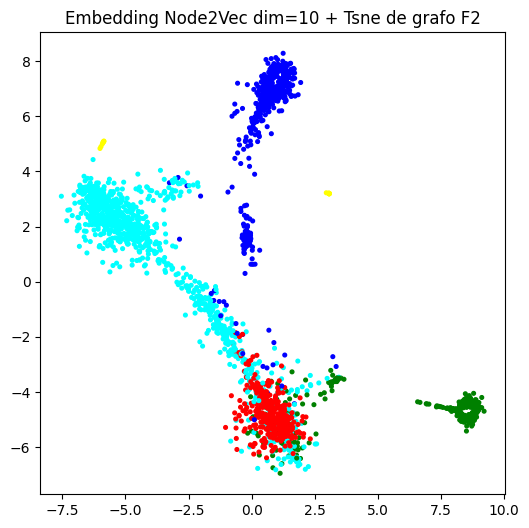

In [ ]:
model2.eval()
z2 = model2(torch.arange(data.num_nodes, device=device)).detach().numpy()

tsne = openTSNE.TSNE(
    perplexity=500,
    metric="euclidean",
    n_jobs=8,
    random_state=42,
    verbose=False,
)
tsne_nod2vec = tsne.fit(z2)
fig,ax1 = plt.subplots(1,1,figsize=(6, 6))
ax1.scatter(tsne_nod2vec[:,0],tsne_nod2vec[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec dim=10 + Tsne de grafo F2")

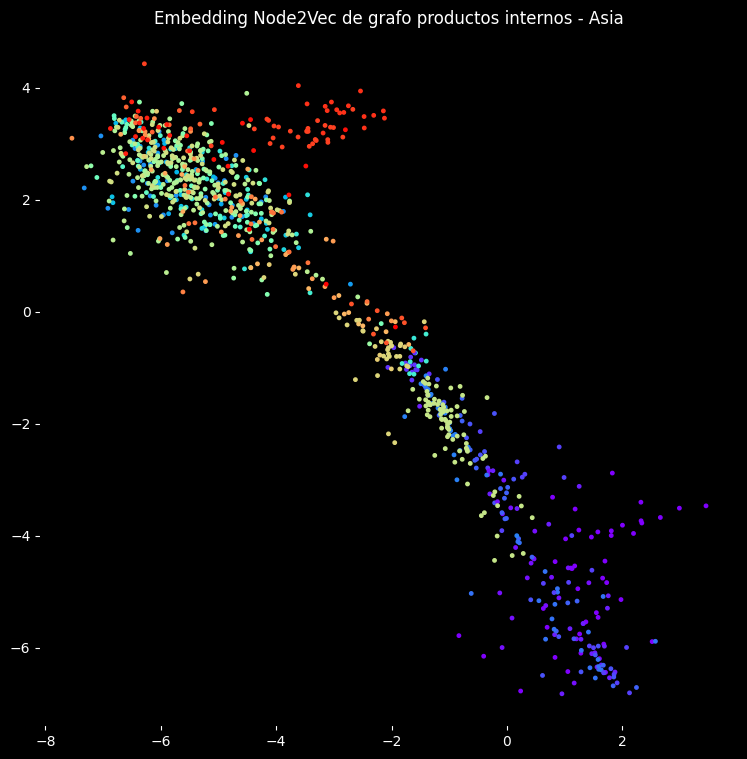

In [ ]:
tsne_asia = tsne_nod2vec[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(tsne_asia[:, 0], tsne_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

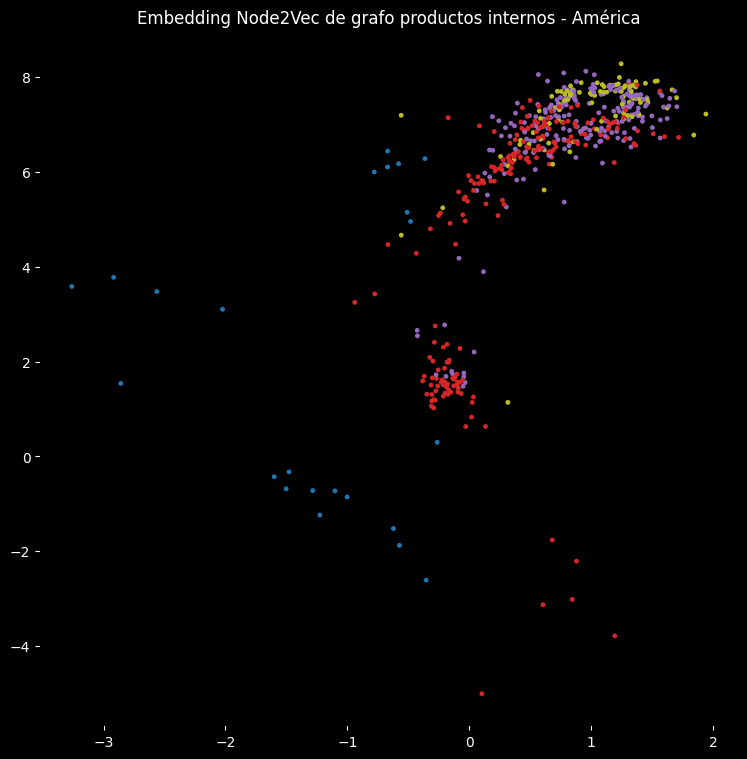

In [ ]:
tsne_america = tsne_nod2vec[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(tsne_america[:, 0], tsne_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

#Control cantidad de aristas por nodo

In [ ]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj, index=origen["id"], columns=origen["id"]))

# Eliminar nodos aislados y bucles
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [ ]:
G2 = G.copy()

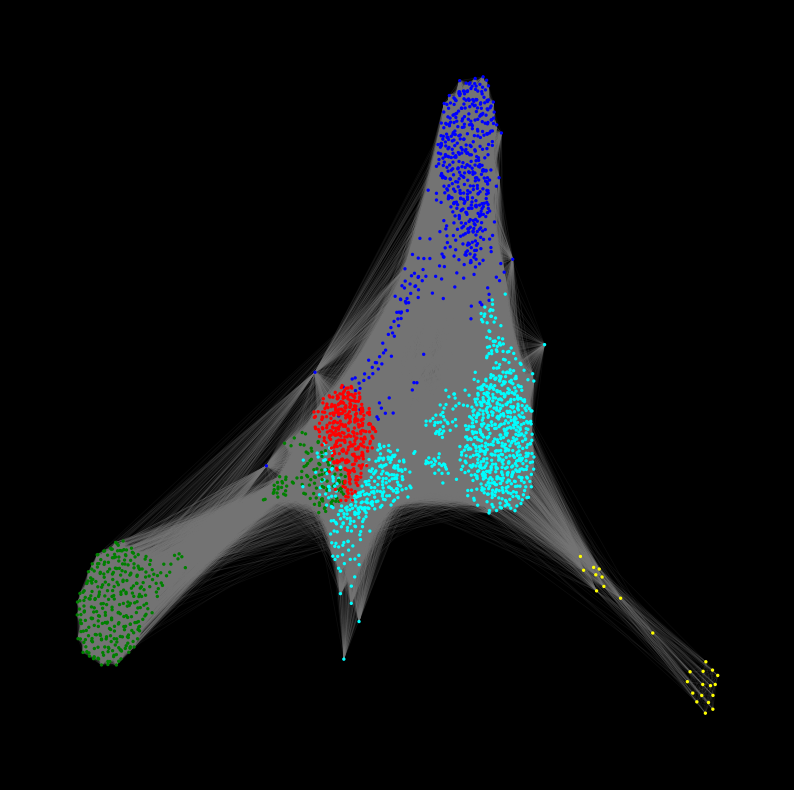

In [ ]:
# Establecer el límite mínimo y máximo de aristas por nodo
min_edges_per_node = 2
max_edges_per_node = 800

# Agregar las aristas más fuertes hasta que cada nodo tenga entre min_edges_per_node y max_edges_per_node aristas
for node in G2.nodes():
    edges = sorted(G2.edges(node, data=True), key=lambda x: x[2]["weight"], reverse=True)  # Ordenar aristas por peso descendente
    while len(edges) > max_edges_per_node:
        # Eliminar la arista más débil si se supera el límite máximo
        edge_to_remove = edges.pop()
        G2.remove_edge(*edge_to_remove[:2])
    while len(edges) < min_edges_per_node:
        # Agregar la arista más fuerte disponible si se tiene menos de min_edges_per_node aristas
        if len(edges) == 0:
            break
        strongest_edge = edges.pop(0)
        G2.add_edge(*strongest_edge[:2])

# Calcular la disposición de los nodos
pos = nx.spring_layout(G2, scale=0.1, k=1/10)

# Crear la figura y el eje
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(10, 10)
fig.set_facecolor("black")
ax.set_facecolor("black")

# Dibujar las aristas del grafo
nx.draw_networkx_edges(G2,
                       pos=pos,
                       edge_color="gray",
                       alpha=0.1,
                       width=0.5)

# Dibujar los nodos del grafo con colores según el continente
nx.draw_networkx_nodes(G2,
                       pos=pos,
                       node_size=2,
                       node_color=pd.Series(list(G2.nodes())).apply(
                           lambda x: continent_paint[origen[origen["id"] == x]["Continente"].values[0]]
                       ))

plt.show()

In [ ]:
pyg_graph = from_networkx(G2)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.7010, Acc:
Epoch: 02, Loss: 1.5720, Acc:
Epoch: 03, Loss: 1.5005, Acc:
Epoch: 04, Loss: 1.4591, Acc:
Epoch: 05, Loss: 1.4359, Acc:
Epoch: 06, Loss: 1.4211, Acc:
Epoch: 07, Loss: 1.4107, Acc:
Epoch: 08, Loss: 1.4022, Acc:
Epoch: 09, Loss: 1.3930, Acc:
Epoch: 10, Loss: 1.3801, Acc:
Epoch: 11, Loss: 1.3610, Acc:
Epoch: 12, Loss: 1.3372, Acc:
Epoch: 13, Loss: 1.3087, Acc:
Epoch: 14, Loss: 1.2811, Acc:
Epoch: 15, Loss: 1.2602, Acc:
Epoch: 16, Loss: 1.2430, Acc:
Epoch: 17, Loss: 1.2305, Acc:
Epoch: 18, Loss: 1.2228, Acc:
Epoch: 19, Loss: 1.2190, Acc:
Epoch: 20, Loss: 1.2161, Acc:
Epoch: 21, Loss: 1.2112, Acc:
Epoch: 22, Loss: 1.2118, Acc:
Epoch: 23, Loss: 1.2100, Acc:
Epoch: 24, Loss: 1.2091, Acc:
Epoch: 25, Loss: 1.2076, Acc:
Epoch: 26, Loss: 1.2094, Acc:
Epoch: 27, Loss: 1.2071, Acc:
Epoch: 28, Loss: 1.2061, Acc:
Epoch: 29, Loss: 1.2085, Acc:
Epoch: 30, Loss: 1.2085, Acc:
Epoch: 31, Loss: 1.2078, Acc:
Epoch: 32, Loss: 1.2076, Acc:
Epoch: 33, Loss: 1.2070, Acc:
Epoch: 34,

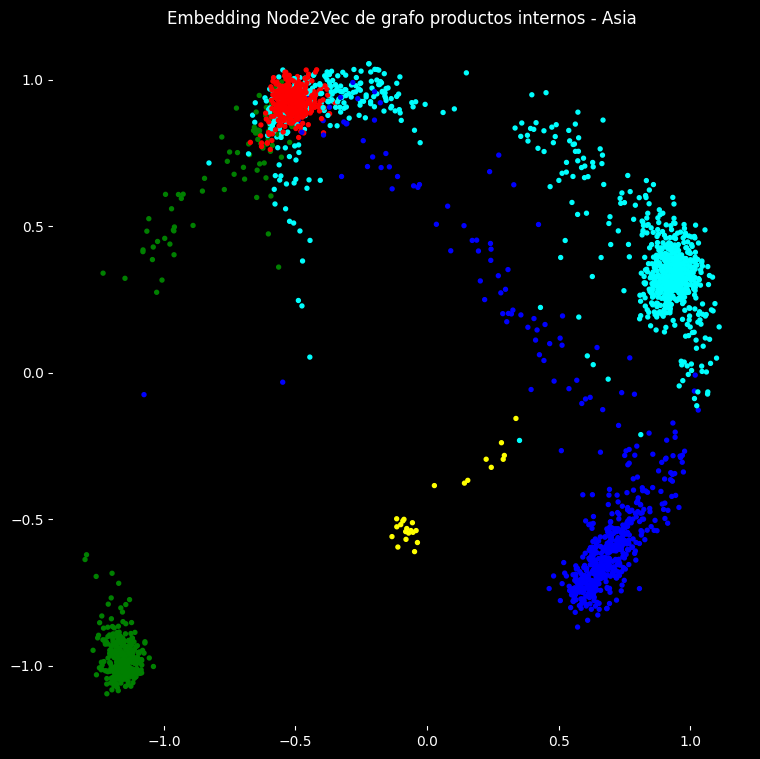

In [ ]:
# Node2vec
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')  # Establecer el color de fondo negro
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=8)
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

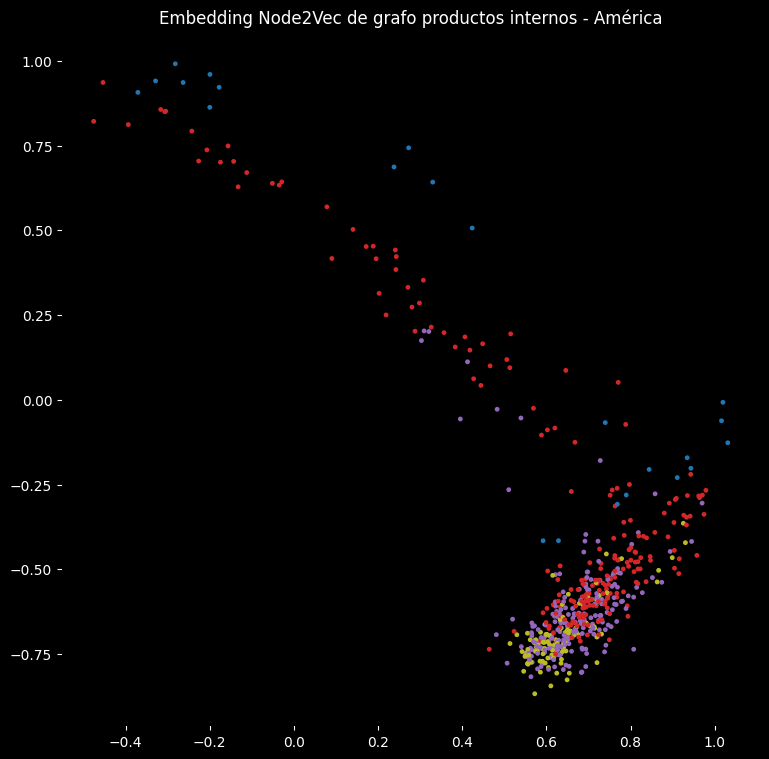

In [ ]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')
plt.show()

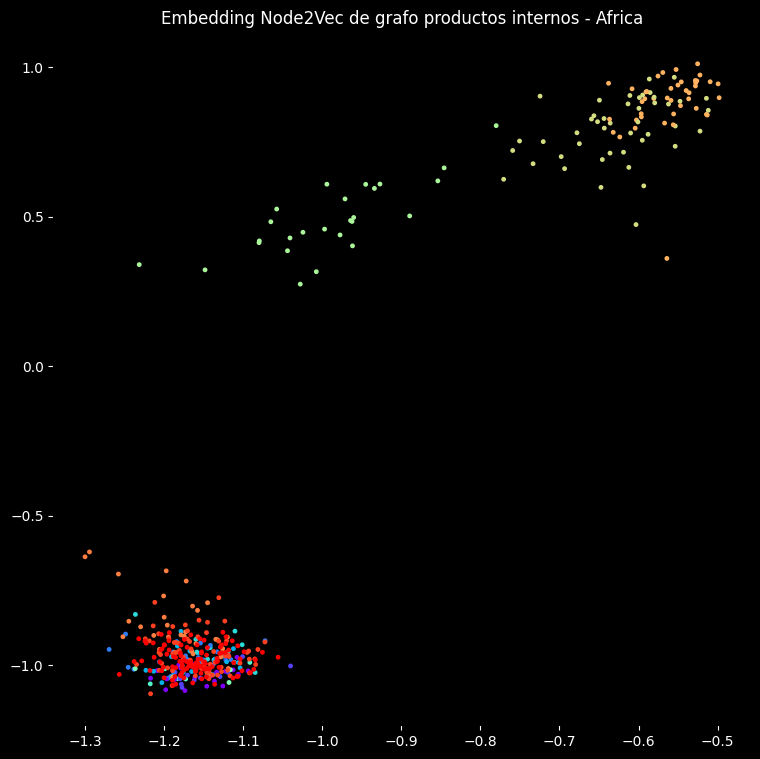

In [ ]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Africa", color='white')
plt.show()

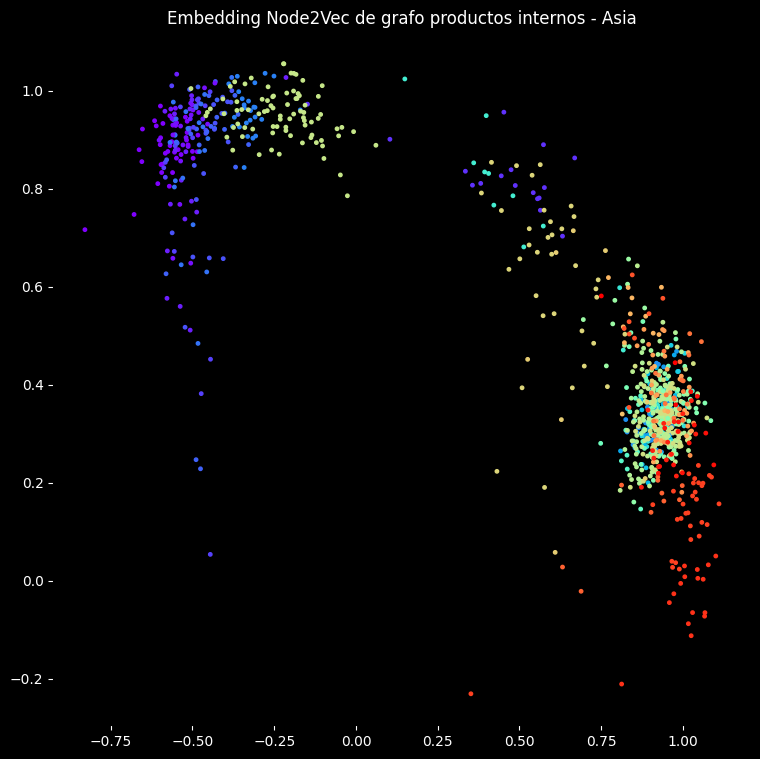

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')
plt.show()

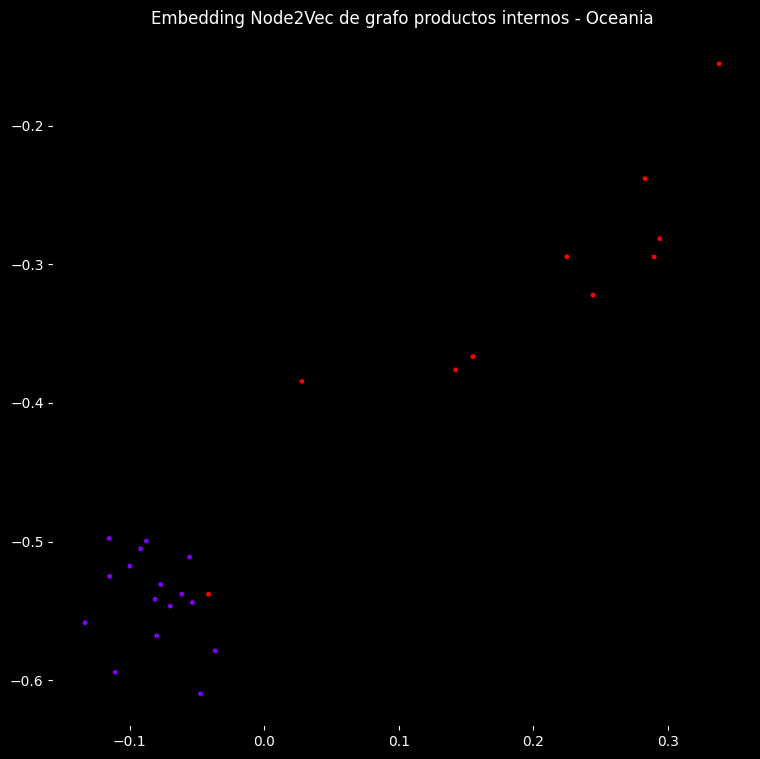

In [ ]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Oceania", color='white')
plt.show()

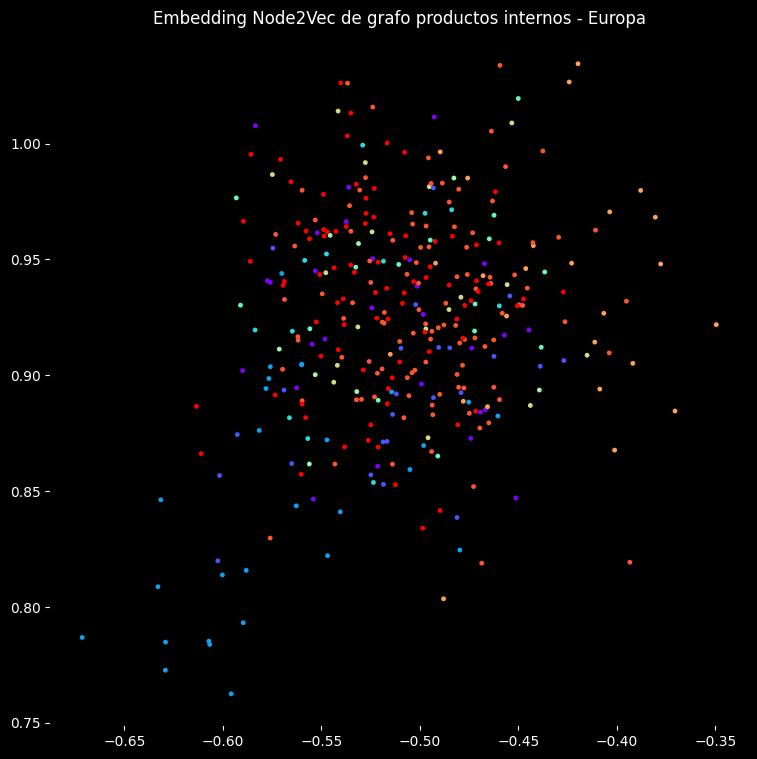

In [ ]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Europa", color='white')
plt.show()

# Control cantidad de aristas por nodo, Node2vec + tsne

In [ ]:
model2 = Node2Vec(pyg_graph.edge_index, embedding_dim=10, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer2 = torch.optim.SparseAdam(list(model2.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader2 = model2.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train2():
    model2.train()
    total_loss = 0
    for pos_rw, neg_rw in loader2:
        optimizer2.zero_grad()
        loss = model2.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer2.step()
        total_loss += loss.item()
    return total_loss / len(loader2)

for epoch in range(1, 101):
    loss = train2()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 2.6207, Acc:
Epoch: 02, Loss: 2.1723, Acc:
Epoch: 03, Loss: 1.8803, Acc:
Epoch: 04, Loss: 1.7008, Acc:
Epoch: 05, Loss: 1.5873, Acc:
Epoch: 06, Loss: 1.5087, Acc:
Epoch: 07, Loss: 1.4421, Acc:
Epoch: 08, Loss: 1.3791, Acc:
Epoch: 09, Loss: 1.3261, Acc:
Epoch: 10, Loss: 1.2854, Acc:
Epoch: 11, Loss: 1.2602, Acc:
Epoch: 12, Loss: 1.2442, Acc:
Epoch: 13, Loss: 1.2343, Acc:
Epoch: 14, Loss: 1.2244, Acc:
Epoch: 15, Loss: 1.2171, Acc:
Epoch: 16, Loss: 1.2127, Acc:
Epoch: 17, Loss: 1.2081, Acc:
Epoch: 18, Loss: 1.2037, Acc:
Epoch: 19, Loss: 1.2011, Acc:
Epoch: 20, Loss: 1.2005, Acc:
Epoch: 21, Loss: 1.1985, Acc:
Epoch: 22, Loss: 1.1963, Acc:
Epoch: 23, Loss: 1.1957, Acc:
Epoch: 24, Loss: 1.1963, Acc:
Epoch: 25, Loss: 1.1944, Acc:
Epoch: 26, Loss: 1.1958, Acc:
Epoch: 27, Loss: 1.1940, Acc:
Epoch: 28, Loss: 1.1920, Acc:
Epoch: 29, Loss: 1.1940, Acc:
Epoch: 30, Loss: 1.1948, Acc:
Epoch: 31, Loss: 1.1909, Acc:
Epoch: 32, Loss: 1.1918, Acc:
Epoch: 33, Loss: 1.1915, Acc:
Epoch: 34,

Text(0.5, 1.0, 'Embedding Node2Vec dim=10 + Tsne de grafo F2')

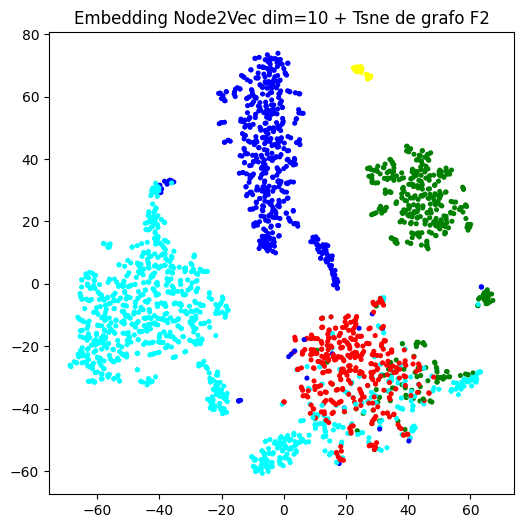

In [ ]:
model2.eval()
z2 = model2(torch.arange(data.num_nodes, device=device)).detach().numpy()

tsne = openTSNE.TSNE(
    perplexity=15,
    metric="euclidean",
    n_jobs=8,
    random_state=42,
    verbose=False,
)
tsne_nod2vec = tsne.fit(z2)
fig,ax1 = plt.subplots(1,1,figsize=(6, 6))
ax1.scatter(tsne_nod2vec[:,0],tsne_nod2vec[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=7)
plt.title("Embedding Node2Vec dim=10 + Tsne de grafo F2")

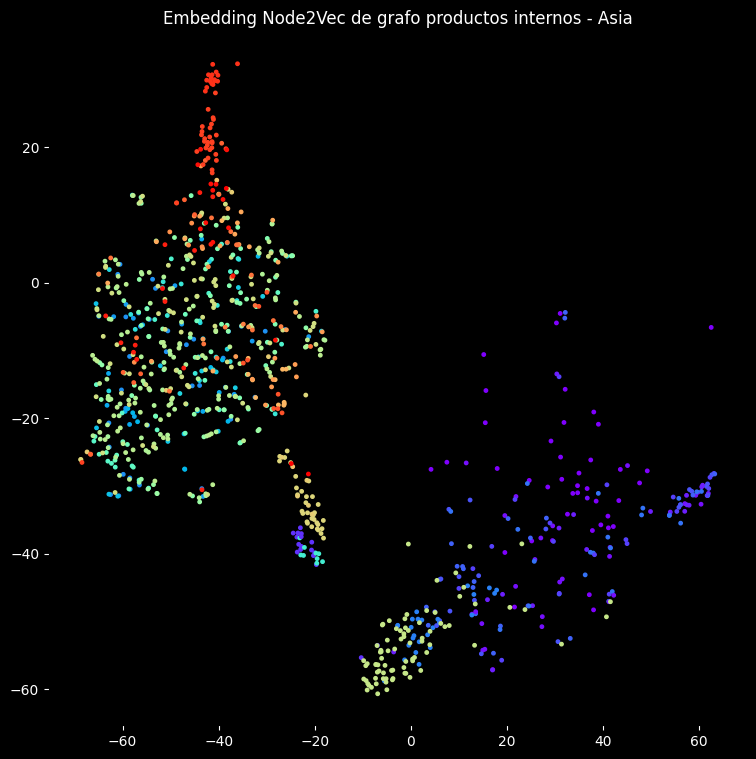

In [ ]:
tsne_asia = tsne_nod2vec[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(tsne_asia[:, 0], tsne_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

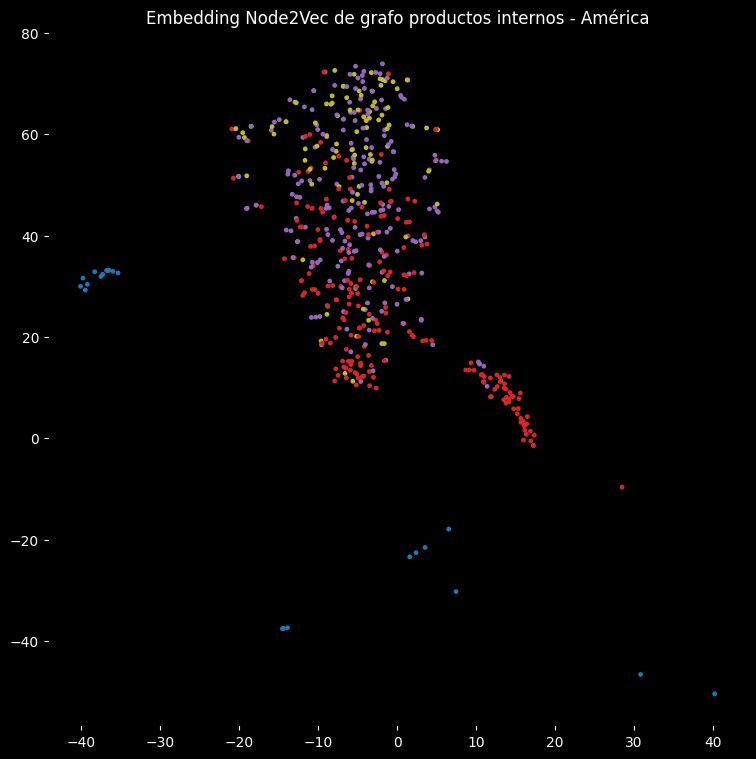

In [ ]:
tsne_america = tsne_nod2vec[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(tsne_america[:, 0], tsne_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

# Submuestrear

In [147]:
sample_size = 400
continents_to_sample = ['Asia', 'Africa', 'America']
origen_sampled = origen[origen['Continente'].isin(continents_to_sample)].groupby('Continente').apply(lambda x: x.sample(n=sample_size, random_state=1)).reset_index(drop=True)

# Verificar los resultados del submuestreo
print(origen_sampled['Continente'].value_counts())

# Filtrar df con los IDs de origen_sampled
print(df.index)
print(origen_sampled['id'])

# Filtrar df con los IDs de origen_sampled
df_filtered = df[df.index.isin(origen_sampled['id'])]

# Verificar el filtrado
print(df_filtered)

Continente
Africa     400
America    400
Asia       400
Name: count, dtype: int64
Index(['1_C1_1_C1', '2_C2_2_C2', '3_C3_3_C3', '4_C4_4_C4', '5_C5_5_C5',
       '6_C6_6_C6', '7_C7_7_C7', '8_C8_8_C8', '9_C9_9_C9', '10_C10_10_C10',
       ...
       '2352_NAD15_2352_NAD15', '2353_NAD54_2353_NAD54',
       '2354_NAD55_2354_NAD55', '2355_NAD56_2355_NAD56',
       '2356_NAD57_2356_NAD57', '2357_NAD59_2357_NAD59',
       '2358_NAD64_2358_NAD64', '2359_NAD93_2359_NAD93',
       '2360_NAD96_2360_NAD96', '2361_NAD98_2361_NAD98'],
      dtype='object', length=2361)
0            NA20346
1          HGDP01406
2          HGDP00936
3            NA19359
4          HGDP00940
            ...     
1195       HGDP01338
1196       HGDP01308
1197       HGDP00125
1198    4249815291_A
1199       HGDP00092
Name: id, Length: 1200, dtype: object
Empty DataFrame
Columns: [rs11588312, rs2843143, rs7545940, rs4648482, rs12409345, rs2493291, rs10915433, rs6681347, rs10915494, rs17407901, rs12025694, rs2035010, rs666

In [153]:
origen

,id,label,Continente,Region
0,C1,CHARRUA,America,America del Sur
1,C2,CHARRUA,America,America del Sur
2,C3,CHARRUA,America,America del Sur
3,C4,CHARRUA,America,America del Sur
4,C5,CHARRUA,America,America del Sur
...,...,...,...,...
2356,NAD59,Chipewyan,America,America del Norte
2357,NAD64,Chipewyan,America,America del Norte
2358,NAD93,Chipewyan,America,America del Norte
2359,NAD96,Chipewyan,America,America del Norte


In [154]:
df

,rs11588312,rs2843143,rs7545940,rs4648482,rs12409345,rs2493291,rs10915433,rs6681347,rs10915494,rs17407901,...,rs7290877,rs8138195,rs5770403,rs4823934,rs714006,rs5770482,rs6009839,rs12171156,rs909693,rs8185000
1_C1_1_C1,1.0,2.0,1.0,0.0,2.0,0.0,1.0,1.0,1.0,0.0,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0
2_C2_2_C2,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3_C3_3_C3,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,1.0
4_C4_4_C4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5_C5_5_C5,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,1.0,1.0,...,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2357_NAD59_2357_NAD59,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2358_NAD64_2358_NAD64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2359_NAD93_2359_NAD93,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2360_NAD96_2360_NAD96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0


In [155]:
# Obtener los IDs de los individuos de Europa y Oceanía
europa_oceania = origen[(origen['Continente'] == 'Europa') | (origen['Continente'] == 'Oceania')]['id']

# Subsamplear 400 individuos de África, América y Asia
africa_sampled = origen[origen['Continente'] == 'Africa'].sample(n=400, random_state=42)['id']
america_sampled = origen[origen['Continente'] == 'America'].sample(n=400, random_state=42)['id']
asia_sampled = origen[origen['Continente'] == 'Asia'].sample(n=400, random_state=42)['id']

# Concatenar los IDs subsampleados con los de Europa y Oceanía
ids_filtered = pd.concat([europa_oceania, africa_sampled, america_sampled, asia_sampled])

# Filtrar el DataFrame origen con los IDs filtrados
origen_filtered = origen[origen['id'].isin(ids_filtered)]

# Verificar el tamaño del DataFrame resultante
print(len(origen_filtered))  # Debería mostrar 1579

1579


In [156]:
origen_filtered

,id,label,Continente,Region
0,C1,CHARRUA,America,America del Sur
2,C3,CHARRUA,America,America del Sur
3,C4,CHARRUA,America,America del Sur
5,C6,CHARRUA,America,America del Sur
6,C7,CHARRUA,America,America del Sur
...,...,...,...,...
2354,NAD56,Chipewyan,America,America del Norte
2356,NAD59,Chipewyan,America,America del Norte
2357,NAD64,Chipewyan,America,America del Norte
2359,NAD96,Chipewyan,America,America del Norte


In [169]:
df.reset_index(drop=True, inplace=True)

In [170]:
df

,rs11588312,rs2843143,rs7545940,rs4648482,rs12409345,rs2493291,rs10915433,rs6681347,rs10915494,rs17407901,...,rs7290877,rs8138195,rs5770403,rs4823934,rs714006,rs5770482,rs6009839,rs12171156,rs909693,rs8185000
0,1.0,2.0,1.0,0.0,2.0,0.0,1.0,1.0,1.0,0.0,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0
1,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,1.0,1.0,...,0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2356,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2357,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2358,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2359,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0


In [171]:
indices_filtrados = origen_filtered.index

# Filtrar df usando los índices filtrados
df_filtered = df.iloc[indices_filtrados]

# Verificar la forma del DataFrame filtrado
print(df_filtered.shape)

(1579, 20216)


In [172]:
df = df_filtered
origen = origen_filtered

In [173]:
# 1. Imputamos datos vacíos con la media de cada columna
imputer = SimpleImputer(strategy='mean')
data_imputed = imputer.fit_transform(df)

# 2. Normalizamos
df_norm = data_imputed.copy()
df_norm = normalize(df_norm, norm='l2', axis=1)
display(df_norm)

array([[0.00904505, 0.01809011, 0.00904505, ..., 0.        , 0.        ,
        0.01809011],
       [0.        , 0.        , 0.01841305, ..., 0.        , 0.        ,
        0.00920653],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.00925023,
        0.00925023],
       [0.        , 0.        , 0.00921829, ..., 0.        , 0.        ,
        0.00921829]])

In [174]:
distances = pdist(df_norm, metric='euclidean') #distancia euclidea

# Convierte el resultado en una matriz de distancias
distance_matrix = pd.DataFrame(squareform(distances), index=df.index, columns=df.index)

In [175]:
distance_matrix

,0,2,3,5,6,7,9,10,11,12,...,2347,2348,2349,2350,2351,2354,2356,2357,2359,2360
0,0.000000,1.030295,1.020064,1.020565,1.029417,1.024968,1.042668,1.067034,1.070009,1.066762,...,1.056940,1.056829,1.048435,1.048826,1.045393,1.047853,1.067109,1.041019,1.058607,1.039144
2,1.030295,0.000000,1.030998,1.032849,1.041677,1.028332,1.028827,1.045855,1.048493,1.048420,...,1.051432,1.044306,1.034759,1.039875,1.036623,1.044196,1.052370,1.041266,1.049546,1.036709
3,1.020064,1.030998,0.000000,1.018515,1.016365,1.026290,1.036453,1.069566,1.070063,1.059542,...,1.053846,1.054535,1.052769,1.049718,1.055976,1.052036,1.064706,1.042317,1.058047,1.034659
5,1.020565,1.032849,1.018515,0.000000,1.020504,1.017943,1.031638,1.056889,1.070430,1.057743,...,1.050076,1.043144,1.049282,1.047371,1.051785,1.052426,1.065939,1.040149,1.051626,1.036159
6,1.029417,1.041677,1.016365,1.020504,0.000000,1.034314,1.040396,1.066566,1.069192,1.067840,...,1.064138,1.063797,1.057997,1.053838,1.052824,1.056023,1.073845,1.049567,1.061597,1.047008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2354,1.047853,1.044196,1.052036,1.052426,1.056023,1.048572,1.041195,1.066486,1.074804,1.071958,...,1.025736,1.027007,1.017658,1.014468,0.957767,0.000000,0.938408,0.957163,0.923739,0.955269
2356,1.067109,1.052370,1.064706,1.065939,1.073845,1.065902,1.054693,1.082728,1.090038,1.080817,...,1.041465,1.031985,1.024197,1.025792,0.968977,0.938408,0.000000,0.970737,0.958271,0.998426
2357,1.041019,1.041266,1.042317,1.040149,1.049567,1.045925,1.037559,1.063632,1.077385,1.069631,...,1.020460,1.024125,1.021909,1.028658,0.974589,0.957163,0.970737,0.000000,0.952332,0.935164
2359,1.058607,1.049546,1.058047,1.051626,1.061597,1.052844,1.046059,1.081479,1.087392,1.071702,...,1.037321,1.032423,1.031396,1.036189,0.975718,0.923739,0.958271,0.952332,0.000000,0.969948


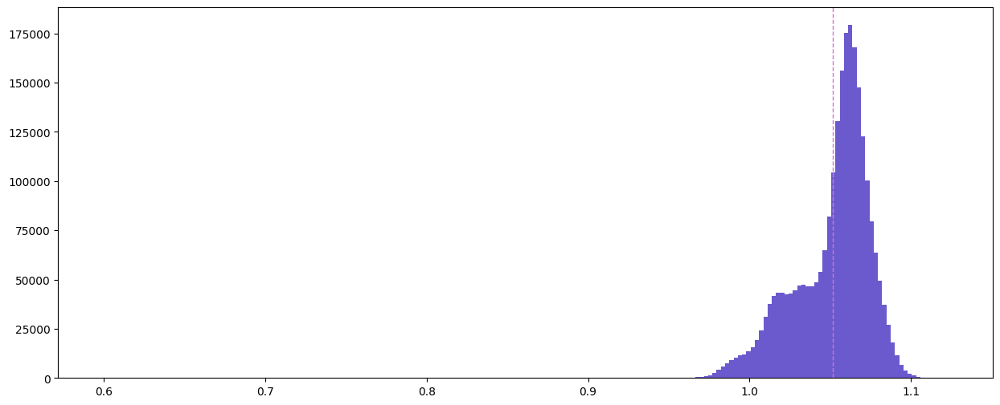

In [176]:
plt.figure(figsize=(15, 6))
plt.hist(np.array(distance_matrix[distance_matrix != 0]).flatten(), bins = 200, color = "slateblue")
plt.axvline(x=np.mean(distance_matrix[distance_matrix != 0]), color='orchid', linestyle='--', linewidth=1)
plt.show()

In [177]:
alpha = 10

In [178]:
f_exact = Fermat(alpha=alpha, path_method='FW')
f_exact.fit(distance_matrix)
fermat_dist_exact = f_exact.get_distances()

In [179]:
fermat_dist_exact

array([[0.        , 1.34776849, 1.21976037, ..., 1.49480596, 1.76745488,
        1.46810175],
       [1.34776849, 0.        , 1.35699162, ..., 1.49836799, 1.62186137,
        1.43405953],
       [1.21976037, 1.35699162, 0.        , ..., 1.51355168, 1.75812311,
        1.40596059],
       ...,
       [1.49480596, 1.49836799, 1.51355168, ..., 0.        , 0.61359679,
        0.51153583],
       [1.76745488, 1.62186137, 1.75812311, ..., 0.61359679, 0.        ,
        0.73702532],
       [1.46810175, 1.43405953, 1.40596059, ..., 0.51153583, 0.73702532,
        0.        ]])

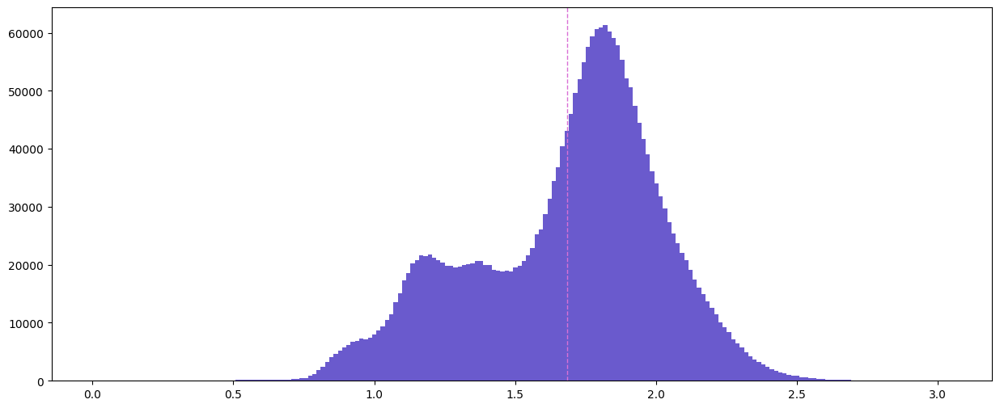

In [180]:
plt.figure(figsize=(15, 6))
plt.hist(np.array(fermat_dist_exact[fermat_dist_exact != 0]).flatten(), bins = 200, color = "slateblue")
plt.axvline(x=np.mean(fermat_dist_exact[fermat_dist_exact != 0]), color='orchid', linestyle='--', linewidth=1)
plt.show()

In [181]:
Adj_fermat = 1 / fermat_dist_exact
np.fill_diagonal(Adj_fermat, 0)
#Adj_fermat[Adj_fermat != 1] = 10000 * Adj_fermat[Adj_fermat != 1]

<ipython-input-181-90bf3dcb5dc8>:1: RuntimeWarning: divide by zero encountered in divide
  Adj_fermat = 1 / fermat_dist_exact


In [182]:
Adj_fermat

array([[0.        , 0.74196719, 0.81983316, ..., 0.66898315, 0.5657853 ,
        0.6811517 ],
       [0.74196719, 0.        , 0.73692423, ..., 0.66739279, 0.61657551,
        0.69732112],
       [0.81983316, 0.73692423, 0.        , ..., 0.66069762, 0.56878838,
        0.71125749],
       ...,
       [0.66898315, 0.66739279, 0.66069762, ..., 0.        , 1.62973473,
        1.95489726],
       [0.5657853 , 0.61657551, 0.56878838, ..., 1.62973473, 0.        ,
        1.35680549],
       [0.6811517 , 0.69732112, 0.71125749, ..., 1.95489726, 1.35680549,
        0.        ]])

In [183]:
np.mean(Adj_fermat)

0.6259205403763985

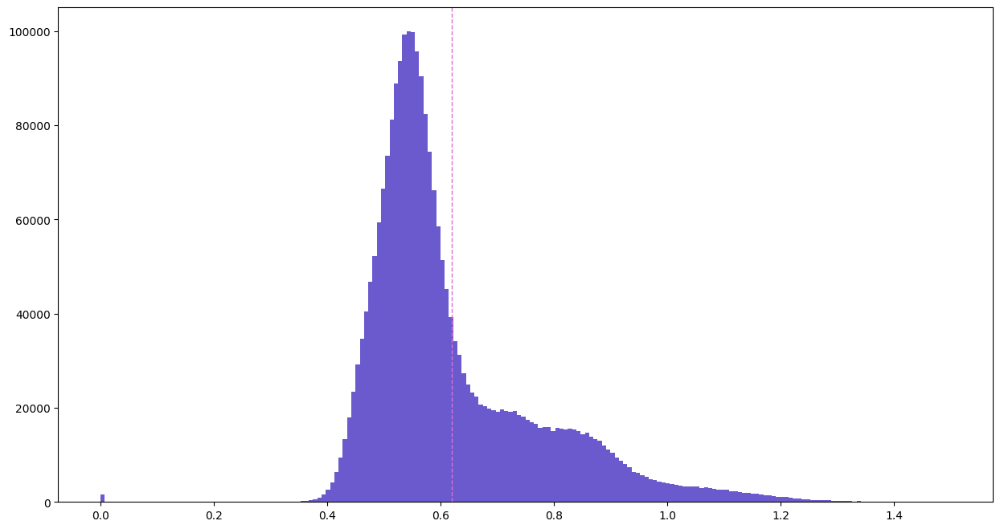

In [184]:
plt.figure(figsize=(15, 8))
plt.hist(np.array(Adj_fermat[Adj_fermat < 1.5]).flatten(), bins = 200, color = "slateblue")
plt.axvline(x=0.62, color='orchid', linestyle='--', linewidth=1)
plt.show()

In [185]:
mask = Adj_fermat > 0.62
Adj = np.where(mask , Adj_fermat, 0)
Adj

array([[0.        , 0.74196719, 0.81983316, ..., 0.66898315, 0.        ,
        0.6811517 ],
       [0.74196719, 0.        , 0.73692423, ..., 0.66739279, 0.        ,
        0.69732112],
       [0.81983316, 0.73692423, 0.        , ..., 0.66069762, 0.        ,
        0.71125749],
       ...,
       [0.66898315, 0.66739279, 0.66069762, ..., 0.        , 1.62973473,
        1.95489726],
       [0.        , 0.        , 0.        , ..., 1.62973473, 0.        ,
        1.35680549],
       [0.6811517 , 0.69732112, 0.71125749, ..., 1.95489726, 1.35680549,
        0.        ]])

In [186]:
G = nx.from_pandas_adjacency(pd.DataFrame(Adj, index = origen["id"] , columns = origen["id"]))
G.remove_nodes_from(list(nx.isolates(G)))
G.remove_edges_from(nx.selfloop_edges(G))

In [187]:
pos = nx.spring_layout(G, scale = 0.1, k = 1/10)

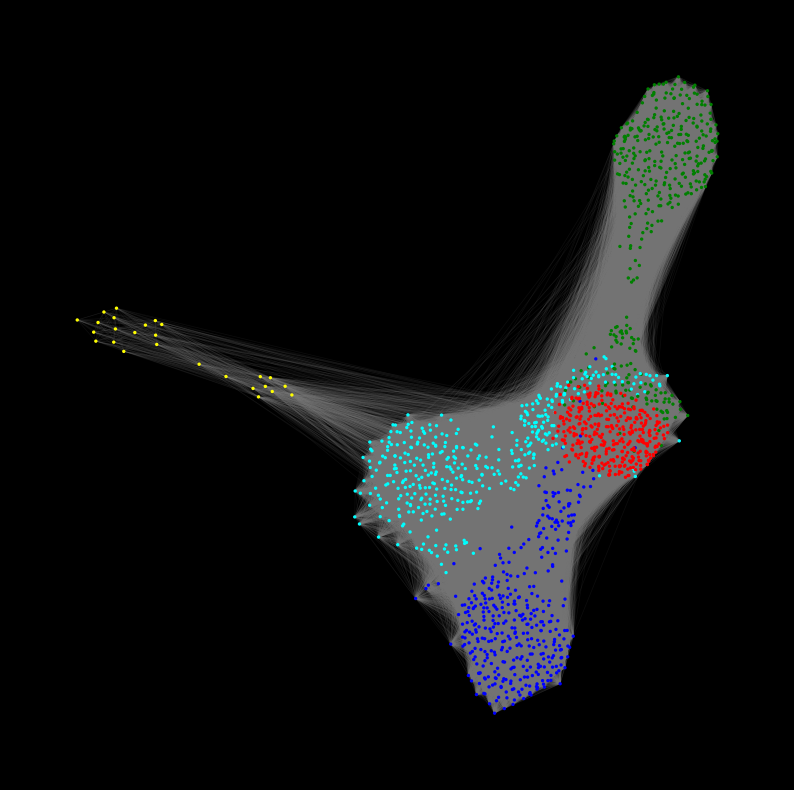

In [188]:
fig, ax = plt.subplots(1,1)
fig.set_size_inches(10,10)
fig.set_facecolor("black")
ax.set_facecolor("black")
nx.draw_networkx_edges(G,
                       pos = pos,
                       edge_color = "gray",
                       alpha = 0.1,
                       width = 0.5)
nx.draw_networkx_nodes(G,
                       pos = pos,
                       node_size = 2,
                       node_color = pd.Series(list(G.nodes())).apply(lambda x : continent_paint[origen[origen["id"] == x]["Continente"].values[0]]))
plt.show()

In [189]:
pyg_graph = from_networkx(G)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch: 01, Loss: 1.7088, Acc:
Epoch: 02, Loss: 1.6072, Acc:
Epoch: 03, Loss: 1.5408, Acc:
Epoch: 04, Loss: 1.4950, Acc:
Epoch: 05, Loss: 1.4655, Acc:
Epoch: 06, Loss: 1.4459, Acc:
Epoch: 07, Loss: 1.4318, Acc:
Epoch: 08, Loss: 1.4215, Acc:
Epoch: 09, Loss: 1.4144, Acc:
Epoch: 10, Loss: 1.4093, Acc:
Epoch: 11, Loss: 1.4044, Acc:
Epoch: 12, Loss: 1.4010, Acc:
Epoch: 13, Loss: 1.3973, Acc:
Epoch: 14, Loss: 1.3935, Acc:
Epoch: 15, Loss: 1.3886, Acc:
Epoch: 16, Loss: 1.3826, Acc:
Epoch: 17, Loss: 1.3735, Acc:
Epoch: 18, Loss: 1.3632, Acc:
Epoch: 19, Loss: 1.3505, Acc:
Epoch: 20, Loss: 1.3386, Acc:
Epoch: 21, Loss: 1.3284, Acc:
Epoch: 22, Loss: 1.3191, Acc:
Epoch: 23, Loss: 1.3128, Acc:
Epoch: 24, Loss: 1.3060, Acc:
Epoch: 25, Loss: 1.2996, Acc:
Epoch: 26, Loss: 1.2927, Acc:
Epoch: 27, Loss: 1.2896, Acc:
Epoch: 28, Loss: 1.2856, Acc:
Epoch: 29, Loss: 1.2825, Acc:
Epoch: 30, Loss: 1.2802, Acc:
Epoch: 31, Loss: 1.2801, Acc:
Epoch: 32, Loss: 1.2774, Acc:
Epoch: 33, Loss: 1.2756, Acc:
Epoch: 34,

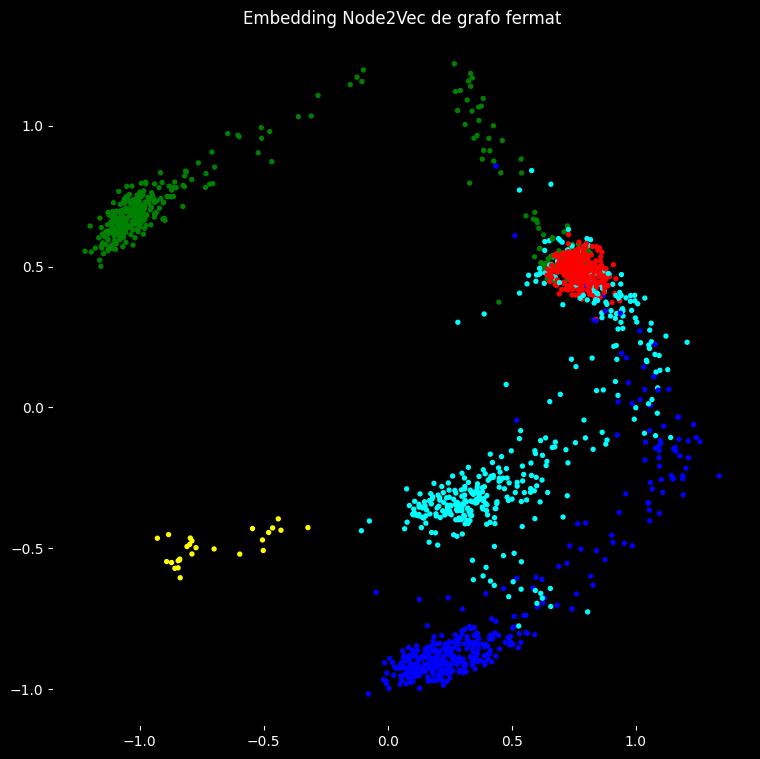

In [190]:
# Node2vec
model = Node2Vec(pyg_graph.edge_index, embedding_dim=2, walk_length=25,
                     context_size=10, walks_per_node=10,
                     num_negative_samples=1, p=1, q=1, sparse=True)
optimizer = torch.optim.SparseAdam(list(model.parameters()), lr=0.01)

num_workers = 0 if sys.platform.startswith('win') else 4
device = 'cuda' if torch.cuda.is_available() else 'cpu'
loader = model.loader(batch_size=128, shuffle=True,
                          num_workers=num_workers)

data=pyg_graph
def train():
    model.train()
    total_loss = 0
    for pos_rw, neg_rw in loader:
        optimizer.zero_grad()
        loss = model.loss(pos_rw.to(device), neg_rw.to(device))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(loader)

for epoch in range(1, 101):
    loss = train()
    #acc = test()
    print(f'Epoch: {epoch:02d}, Loss: {loss:.4f}, Acc:')

model.eval()
z = model(torch.arange(data.num_nodes, device=device)).detach().numpy()
fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')  # Establecer el color de fondo negro
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.scatter(z[:,0],z[:,1],c = origen.Continente.apply(lambda x : continent_paint[x]), s=8)
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo fermat", color='white')  # Cambiar el color del título a blanco
plt.show()

In [202]:
z_america = z[indices_america]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_america[:, 0], z_america[:, 1], c=colors_america_regiones, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - América", color='white')  # Cambiar el color del título a blanco
plt.show()

IndexError: index 1716 is out of bounds for axis 0 with size 1579

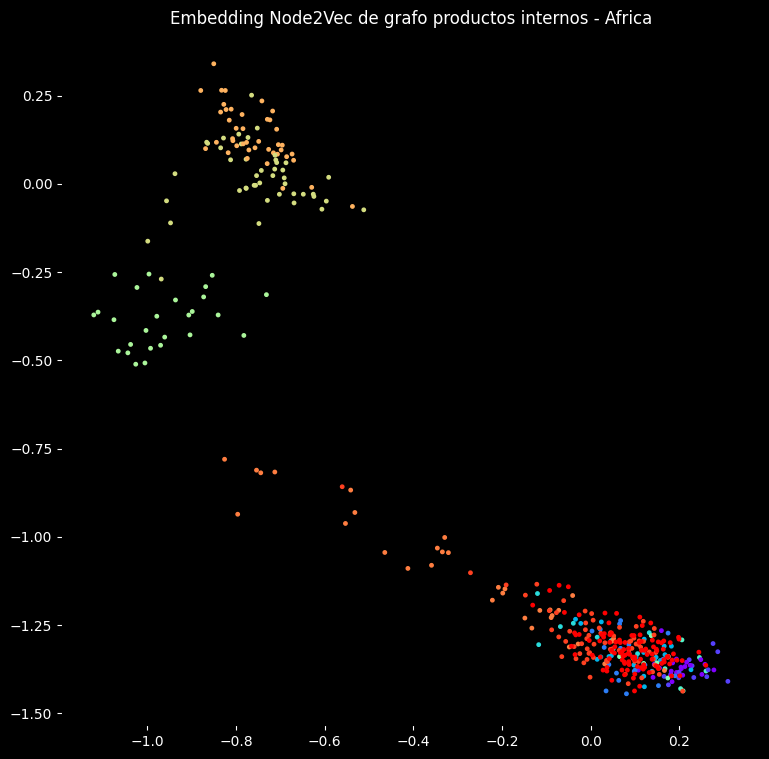

In [ ]:
z_africa = z[origen["Continente"] == "Africa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_africa[:, 0], z_africa[:, 1], c=colors_africa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Africa", color='white')  # Cambiar el color del título a blanco
plt.show()

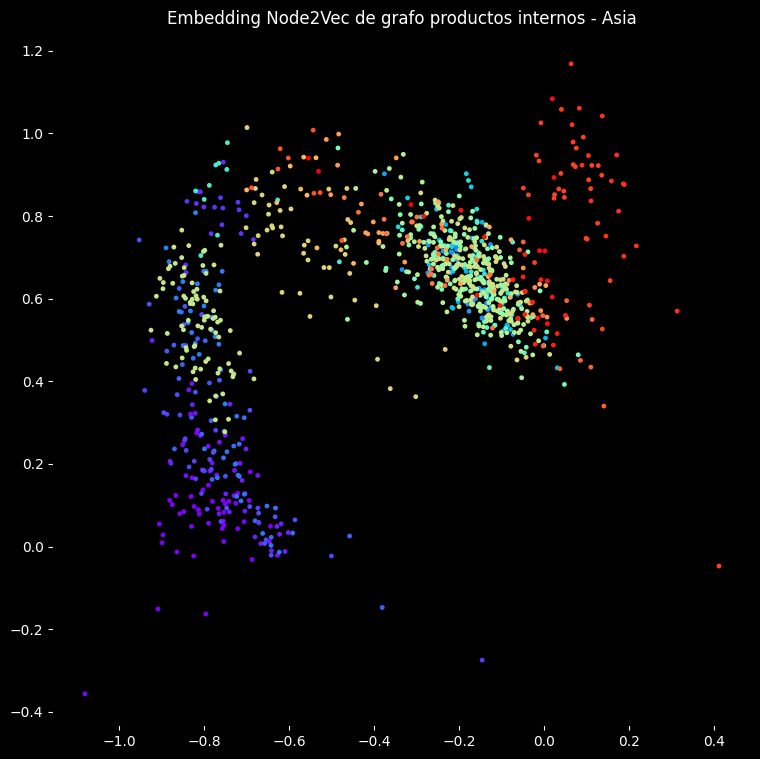

In [ ]:
z_asia = z[origen["Continente"] == "Asia"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_asia[:, 0], z_asia[:, 1], c=colors_asia, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Asia", color='white')  # Cambiar el color del título a blanco
plt.show()

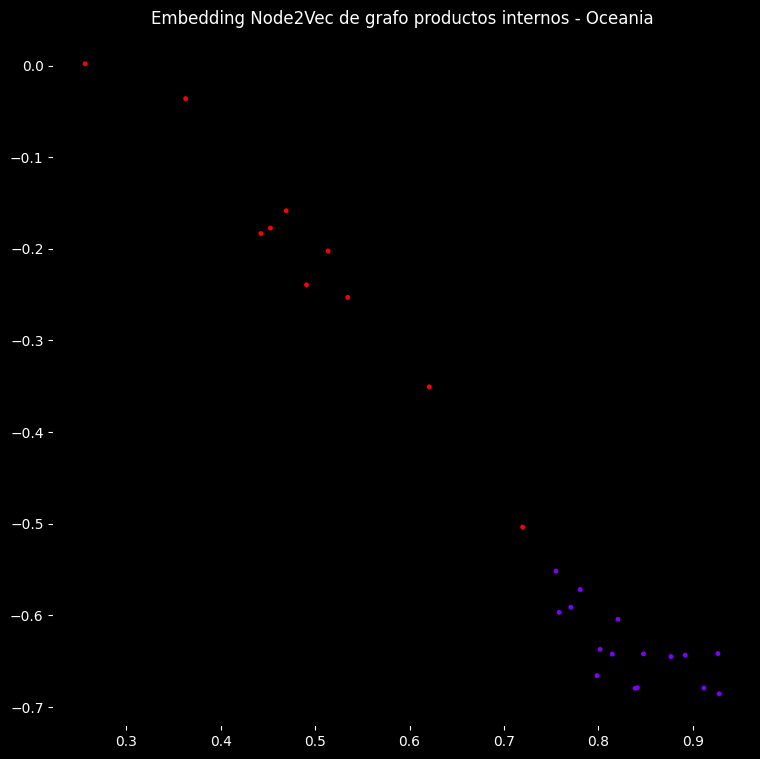

In [ ]:
z_oceania = z[origen["Continente"] == "Oceania"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_oceania[:, 0], z_oceania[:, 1], c=colors_oceania, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Oceania", color='white')  # Cambiar el color del título a blanco
plt.show()

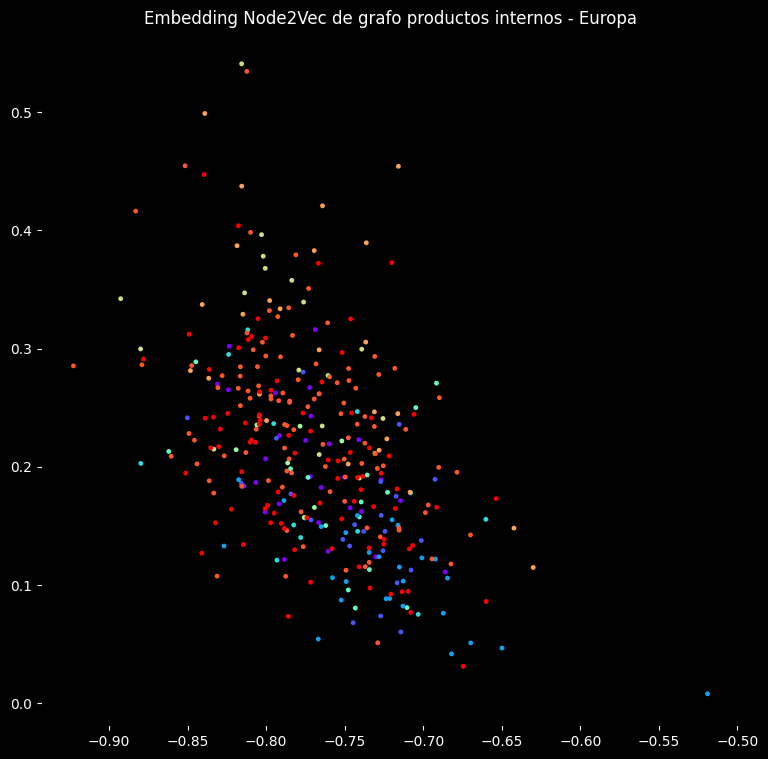

In [ ]:
z_europa = z[origen["Continente"] == "Europa"]

fig, ax1 = plt.subplots(1, 1, figsize=(9, 9), facecolor='black')
ax1.scatter(z_europa[:, 0], z_europa[:, 1], c=colors_europa, s=6)
ax1.set_facecolor('black')  # Cambiar el color de fondo del eje a negro
ax1.tick_params(axis='x', colors='white')  # Cambiar el color de las etiquetas de los ejes a blanco
ax1.tick_params(axis='y', colors='white')
plt.title("Embedding Node2Vec de grafo productos internos - Europa", color='white')  # Cambiar el color del título a blanco
plt.show()

# Altair

In [ ]:
n2v_df = pd.DataFrame(z[:,0:2])
n2v_df.columns = ["0","1"]
n2v_df["Continente"] = origen["Continente"]
n2v_df["label"] = origen["label"]
n2v_df["color"] = origen["Continente"].apply(lambda x: continent_paint[x])

In [ ]:
alt.Chart(n2v_df).mark_circle(size=25).encode(
    x="0",
    y="1",
    tooltip="label",
    color= alt.Color('color', scale=None)
).properties(
    width=700,
    height=700
).interactive()

alt.Chart(...)

In [ ]:
Colores_Grupos = {origen.label.unique()[i] : plt.get_cmap("jet")(np.linspace(0,1,127))[i] for i in np.arange(len(origen.label.unique()))}

In [ ]:
n2v_df = pd.DataFrame(z[:,0:2])
n2v_df.columns = ["0","1"]
n2v_df["Continente"] = origen["Continente"]
n2v_df["label"] = origen["label"]
n2v_df["color"] = origen["label"].apply(lambda x: mlp.colors.to_hex(Colores_Grupos[x]))

In [ ]:
alt.Chart(n2v_df).mark_circle(size=25).encode(
    x="0",
    y="1",
    tooltip="label",
    color= alt.Color('color', scale=None)
).properties(
    width=700,
    height=700
).interactive()

alt.Chart(...)